In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
import scipy
import os
from sklearn.model_selection import GridSearchCV
from typing import Optional, Union

In [2]:
# Music library
import librosa
import librosa.display
import IPython.display as ipd

In [3]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
# per multi-core processing
from sklearnex import patch_sklearn
patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


# Introduzione: classificazione di generi musicali
- **Obbiettivo**: addestrare modelli per il riconoscimento di generi musicali (associare ad un brano il genere)
### Premessa:
- natura soggettiva e pareri
- caratteristiche sovrapponibili
- stili diversi

# Audio data
*Un segnale audio consiste in una sequenza di campioni audio, dove ogni campione (sample) rappresenta l'ampiezza del suono in un istante di tempo specifico. In breve, un segnale audio cattura le variazioni di pressione dell'aria nel tempo, che sono percepite dall'orecchio umano come suoni.
 L'ampiezza di un campione rappresenta l'altezza della forma d'onda sonora in quel punto specifico. L'ampiezza è direttamente correlata all'intensità del suono. I valori positivi rappresentano le compressioni dell'aria (pressione positiva), mentre i valori negativi rappresentano le rarefazioni dell'aria (pressione negativa).*

In questa prima parte cercheremo di analizzare i dati audio per vedere se effettivamente ci sono delle differenze tra i generi, e quindi se ha senso ricercare dei pattern per fare classificazione.

In [5]:
# audio directory
AUDIO_DIR = os.path.join(os.getcwd(), 'archive/Data', 'genres_original')

# genres
GENRES_DIRS = os.listdir(AUDIO_DIR)

In [8]:
def load_song(genre: str = 'rock', song_number: int = 0) -> tuple[np.ndarray, float]:
    """
    Load song from the dataset.
    :param genre: Genre of the song.
    :param song_number: Number of the song.

    :return: Tuple of the song and the sample rate.
    """
    sont_title = sorted(os.listdir(os.path.join(AUDIO_DIR, genre)))[song_number]
    song_path = os.path.join(AUDIO_DIR, genre, sont_title)
    y, sr = librosa.load(song_path)
    return y, sr

def song_info(y: np.ndarray, sr: float):
    """
    Print song information.

    :param y: Audio time series, i.e. the time series of the amplitude values
    :param sr:  Sampling rate of y, i.e. the number of samples per second of audio
    :return:
    """
    print('y: {}'.format(y))
    print('Duration: {:.2f}s, {} samples, {} KHz'.format(len(y)/sr, len(y), sr/1000))

In [9]:
def plot_waveplot(y, sr, title='Waveplot', xlabel='Time', ylabel='Amplitude', color=None, alpha=0.8):
    """
    Plot waveplot of the song.

    :param y: Audio time series, i.e. the time series of the amplitude values
    :param sr:  Sampling rate of y, i.e. the number of samples per second of audio
    :param title: Title of the plot
    :param xlabel: Label of the x axis
    :param ylabel: Label of the y axis
    :param color: Color of the plot
    :return:
    """
    plt.figure(figsize=(14, 5))
    if color:
        librosa.display.waveshow(y, sr=sr, color=color, alpha=alpha)
    else:
        librosa.display.waveshow(y, sr=sr, alpha=alpha)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

y: [-0.09124756 -0.06356812 -0.04788208 ...  0.12573242  0.08944702
  0.07394409]
Duration: 30.01s, 661794 samples, 22.05 KHz


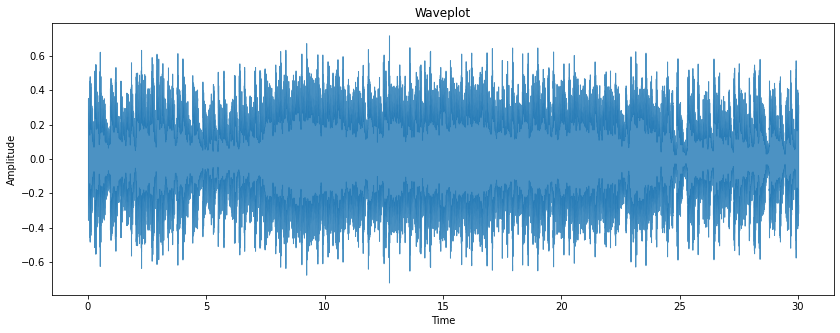

In [10]:
y, sr = load_song('rock', 28)
song_info(y, sr)
plot_waveplot(y, sr)

In [ ]:
ipd.Audio(y, rate=sr)

The Rolling Stones: Jumpin' Jack Flash

y: [-0.037323    0.01690674  0.00811768 ...  0.12271118  0.11727905
  0.11752319]
Duration: 30.01s, 661794 samples, 22.05 KHz


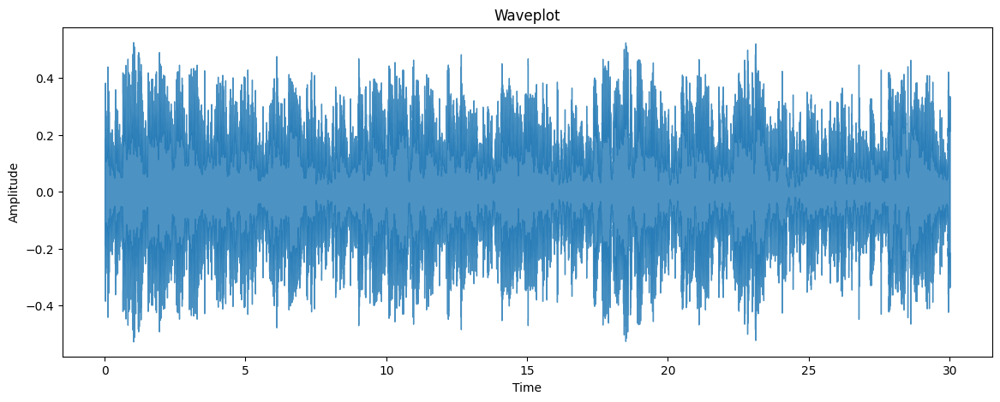

In [ ]:
y2, sr2 = load_song('rock', 30)
song_info(y2, sr2)
plot_waveplot(y2, sr2)

In [ ]:
ipd.Audio(y2, rate=sr2)

The Rolling Stones: Sympathy For The Devil

y: [0.00930786 0.01437378 0.01144409 ... 0.0105896  0.0140686  0.01730347]
Duration: 30.01s, 661794 samples, 22.05 KHz


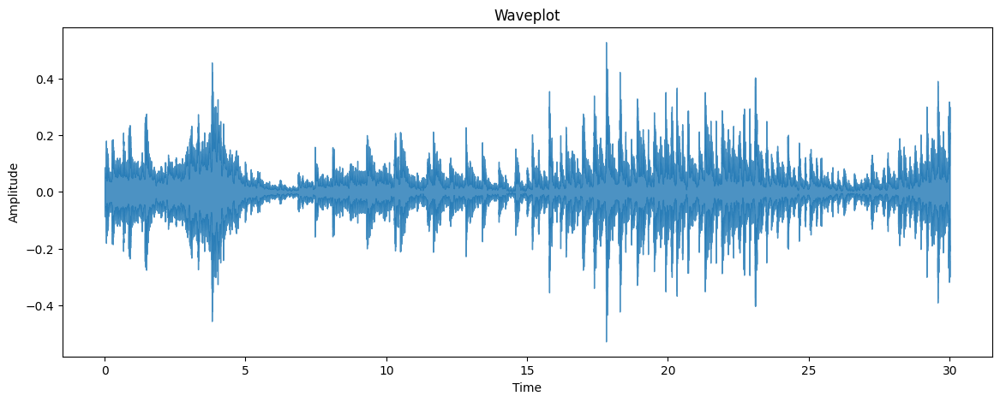

In [ ]:
y3, sr3 = load_song('classical', 35)
song_info(y3, sr3)
plot_waveplot(y3, sr3)

In [ ]:
ipd.Audio(y3, rate=sr3)

Juilliard String Quartet: Quartet In F Major for Strings

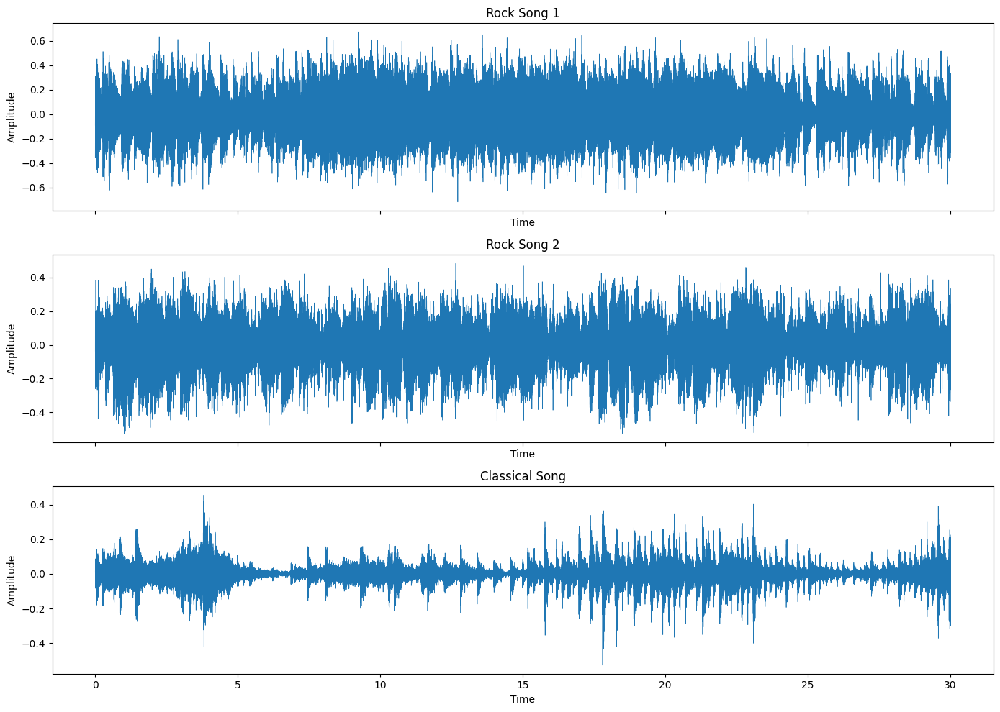

In [ ]:
# plot the three songs together vertically

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

# librosa.display.waveshow(y, sr=sr)
ax1.plot(y, linewidth=0.5)
ax1.set_title('Rock Song 1')
ax1.set_xlabel('Time')
ax1.set_ylabel('Amplitude')

ax2.plot(y2, linewidth=0.5)
ax2.set_title('Rock Song 2')
ax2.set_xlabel('Time')
ax2.set_ylabel('Amplitude')

ax3.plot(y3, linewidth=0.5)
ax3.set_title('Classical Song')
ax3.set_xlabel('Time')
ax3.set_ylabel('Amplitude')

# set x ticks to seconds, every 5 seconds starting from 0
x_ticks = np.arange(0, len(y), sr*5)
ax3.set_xticks(x_ticks)
ax3.set_xticklabels((x_ticks/sr).astype(int))

plt.tight_layout()
plt.show()

## Spectrogram

È una tecnica di analisi molto comune utilizzata nell'elaborazione dei segnali audio per mostrare come l'energia del suono è distribuita nelle diverse frequenze durante un periodo di tempo specifico.
L'asse delle ascisse rappresenta il tempo mentre l'asse delle ordinate rappresenta la frequenza. Le frequenze più basse si trovano di solito nella parte inferiore dello spettrogramma, mentre le frequenze più alte si trovano nella parte superiore. La frequenza è solitamente misurata in unità come Hertz (Hz).

In [ ]:
def spectrogram(y, mel=False):
    """
    Plot spectrogram of the song.

    :param y: Audio time series, i.e. the time series of the amplitude values
    :param mel: Mel-scaled spectrogram. If mel is true, plot both spectrogram and mel-scaled spectrogram in one figure vertically.
    :return:
    """

    # normalize the amplitude
    y = librosa.util.normalize(y)

    # Short-time Fourier transform (STFT)
    X = librosa.stft(y)

    # Convert an amplitude spectrogram to dB-scaled spectrogram.
    x_db = librosa.amplitude_to_db(abs(X))

    # Display a spectrogram
    plt.figure(figsize=(14, 5))
    if mel:
        # Mel-scaled power spectrogram
        X_mel = librosa.feature.melspectrogram(y=y, sr=sr)
        x_db_mel = librosa.amplitude_to_db(abs(X_mel))

        plt.figure(figsize=(14, 10))

        plt.subplot(2, 1, 1)
        librosa.display.specshow(x_db, sr=sr, x_axis='time', y_axis='hz')
        plt.title('Simple Spectrogram')
        plt.colorbar()

        plt.subplot(2, 1, 2)
        librosa.display.specshow(x_db_mel, sr=sr, x_axis='time', y_axis='hz')
        plt.title('Mel-scaled spectrogram')
        plt.colorbar()
        plt.tight_layout()
    else:
        librosa.display.specshow(x_db, sr=sr, x_axis='time', y_axis='hz')
        plt.title('Spectrogram')
        plt.colorbar()

    plt.show()

<Figure size 1400x500 with 0 Axes>

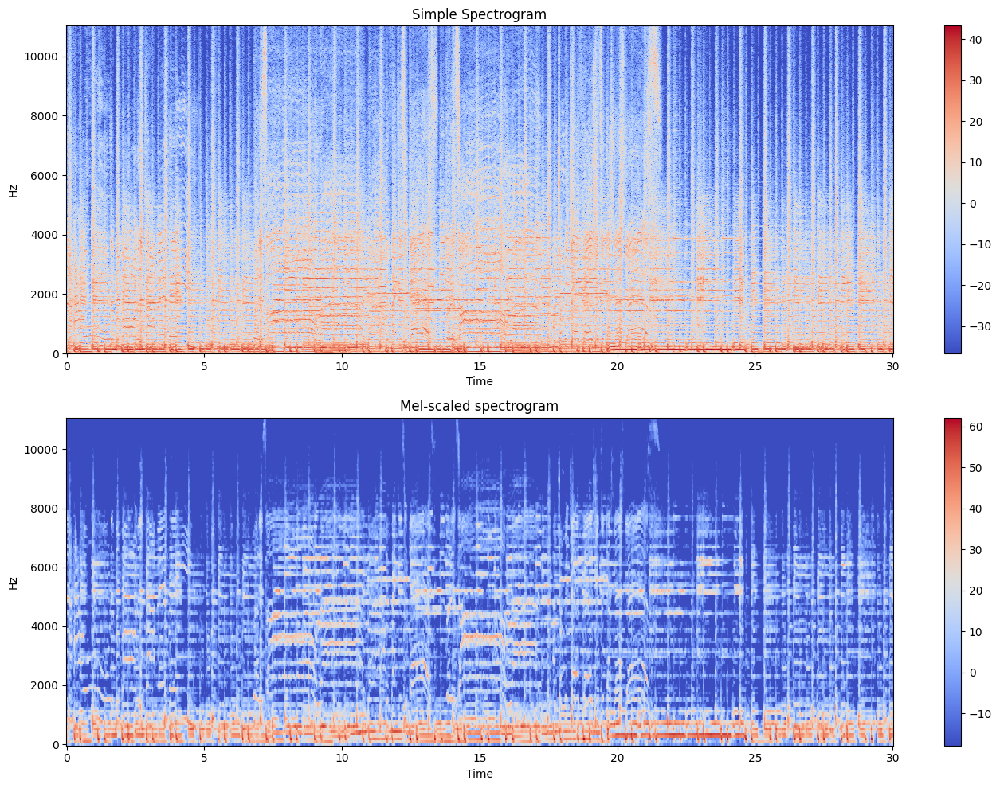

In [ ]:
spectrogram(y, True)

<Figure size 1400x500 with 0 Axes>

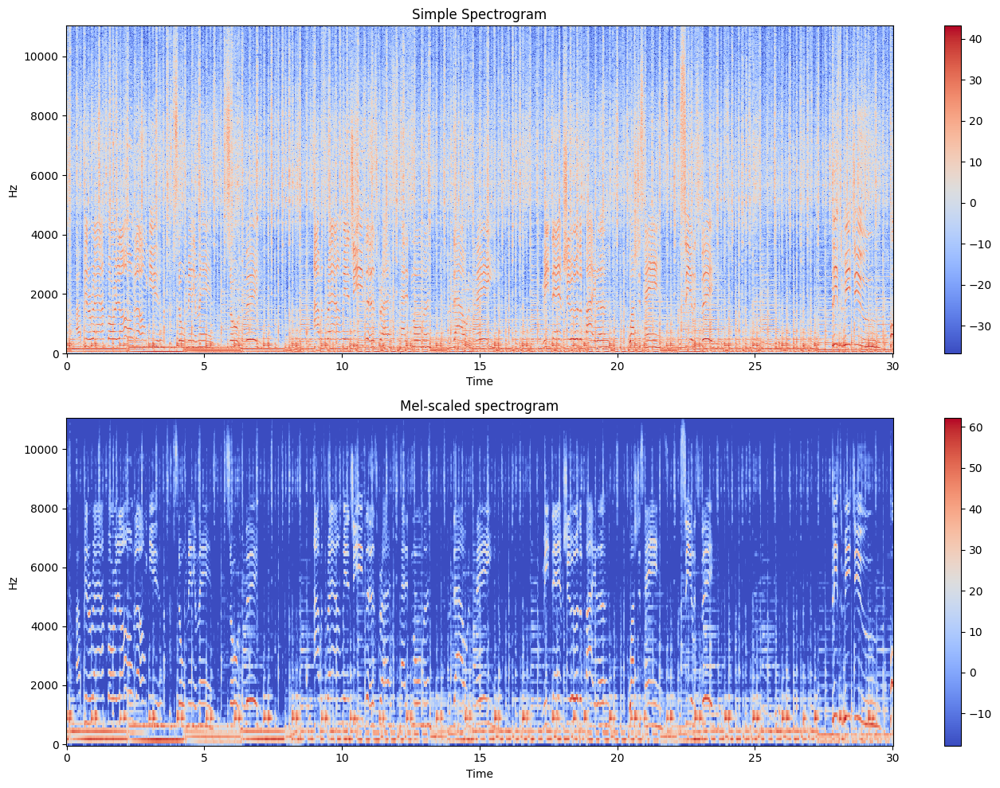

In [ ]:
spectrogram(y2, True)

<Figure size 1400x500 with 0 Axes>

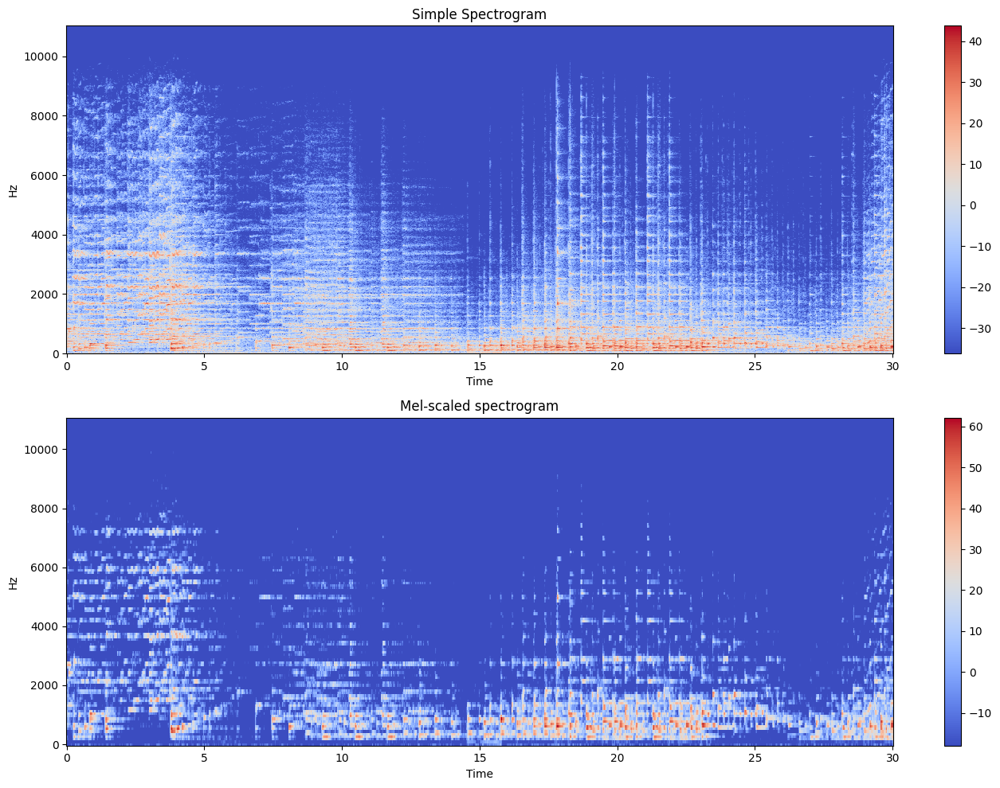

In [ ]:
spectrogram(y3, True)

-------
# Possibili features

## Zero Crossing Rate
Viene utilizzata per calcolare il tasso di attraversamento dello zero in un segnale audio. Il tasso di attraversamento dello zero rappresenta il numero di volte in cui la forma d'onda di un segnale attraversa l'asse orizzontale (zero) in un determinato intervallo di tempo.

In [ ]:

def plot_zero_cross_rate(y1, y2, label1, label2, zero_line=True):

    # zero crossing rate
    z1 = librosa.feature.zero_crossing_rate(y1)
    z2 = librosa.feature.zero_crossing_rate(y2)


    # plot a graph with the two crossing rates, and one with the difference between the tww (horizontally)
    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15, 5))
    fig.suptitle('Zero Crossing Rate', fontsize=16)

    # left plot
    ax1.plot(z1[0], label=label1, linewidth=.5)
    ax1.plot(z2[0], label=label2, linewidth=.5)

    # mean line
    m1 = np.mean(z1)
    m2 = np.mean(z2)
    ax1.axhline(m1, color='blue', linestyle='--', linewidth=2, label=f'Mean of {label1}')
    ax1.axhline(m2, color='red', linestyle='--', linewidth=2, label=f'Mean of {label2}')

    # right plot
    z3 = z1 - z2
    ax2.plot(z3[0], color='green', label='Difference', linewidth=.5)
    ax2.set_title('Difference between the two crossing rates')

    # mean line
    m3 = np.mean(z3)
    ax2.axhline(m3, color='purple', linestyle='--', linewidth=2, label=f'Mean of the difference')

    if zero_line:
        ax1.axhline(0, color='black', linestyle='--', linewidth=1)
        ax2.axhline(0, color='black', linestyle='--', linewidth=1)
        ax1.set_title('Zero Crossing Rate')
        ax2.set_title('Zero Crossing Rate')

    ax1.legend()
    ax2.legend()

    plt.show()

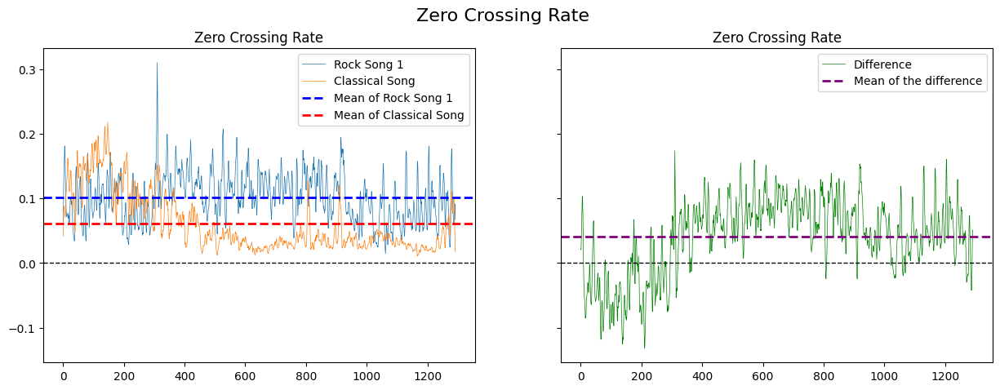

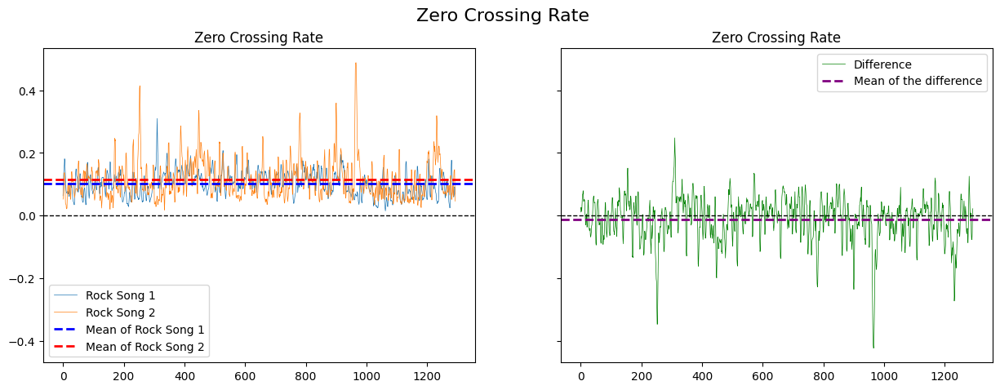

In [ ]:
plot_zero_cross_rate(y, y3, 'Rock Song 1', 'Classical Song')
plot_zero_cross_rate(y, y2, 'Rock Song 1', 'Rock Song 2')

## Harmonics and Percussive
L'armonico contiene principalmente il contenuto melodico o tonale del segnale audio, come le note suonate da uno strumento musicale. Il percussivo contiene principalmente il contenuto ritmico o percussivo del segnale audio, come colpi di batteria o percussioni.

In [ ]:
# plot harmonic and percussive components of the song
def plot_harmonic(*Y):

    n = len(Y)
    _, ax = plt.subplots(n, 1, figsize=(14, 5*n), sharex=True)

    if n == 1:
        ax = [ax]

    for i in range(n):
        y = Y[i]
        y_harmonic, y_percussive = librosa.effects.hpss(y)
        librosa.display.waveshow(y_harmonic, sr=sr, color='purple', linewidth=0.5, ax=ax[i], label='Harmonic')
        librosa.display.waveshow(y_percussive, sr=sr, color='orange', linewidth=0.5, ax=ax[i], label='Percussive')
        ax[i].set_title(f'Harmonic and Percussive Components of the Song {i+1}')
        ax[i].set_ylabel('Amplitude')
        ax[i].set_xlabel(None)
        ax[i].legend()

    ax[-1].set_xlabel('Time')
    plt.show()

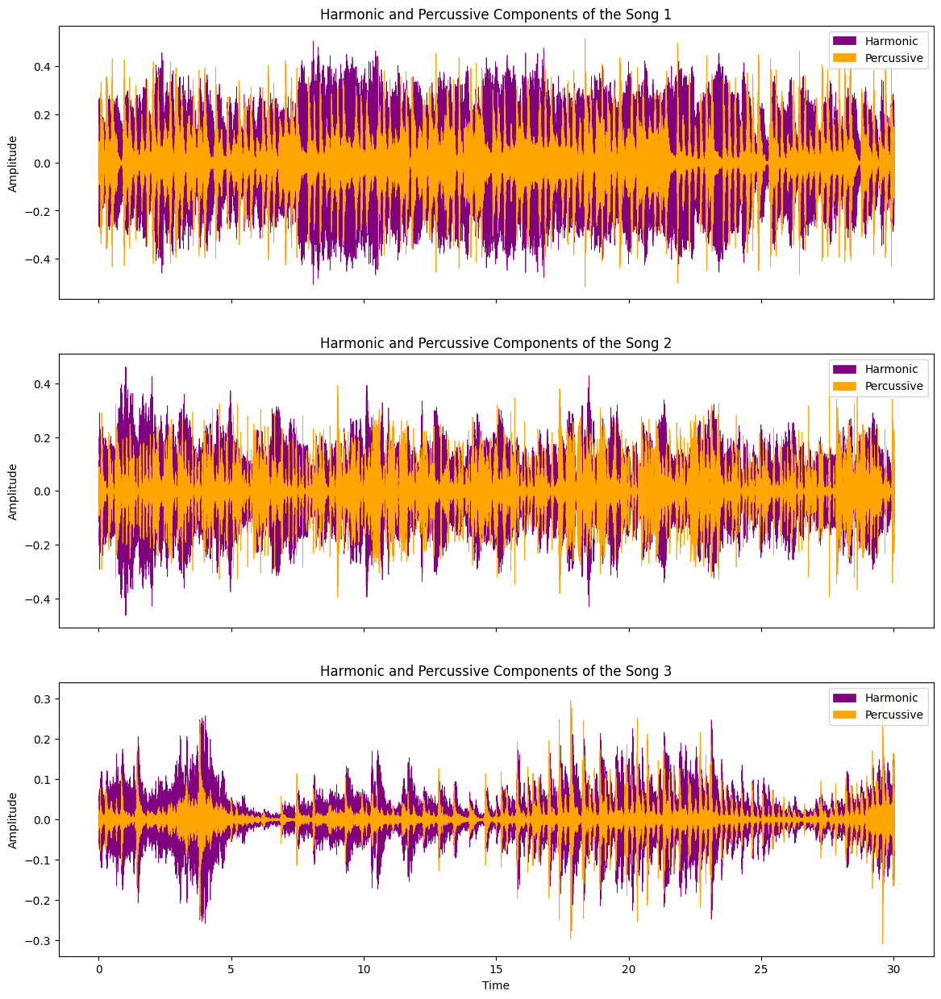

In [ ]:
plot_harmonic(y, y2, y3)

## BMP (beats per minute)
Sono una misura della velocità o del tempo di un brano musicale o di un segnale ritmico.
- **OSSERVAZIONE**: forse non molto informativo: due generi diversi possono avere anche lo stesso tempo come due tracce dello stesso genere possono avere BPM molto diversi.

In [ ]:

def plot_bpm(*Y, sr=22050, songs_names=None):
    """
    Plot the rithm of the song.

    :param Y: Audio time series, i.e. the time series of the amplitude values
    :param sr:  Sampling rate of y, i.e. the number of samples per second of audio
    :param songs_names: Names of the songs
    :return:
    """

    n = len(Y)
    fig, ax = plt.subplots(n, 1, figsize=(14, 5*n), sharex=True)

    fig.suptitle('Rithm of the Song', fontsize=16)

    if n == 1:
        ax = [ax]

    for i in range(n):
        y = Y[i]

        tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
        beat_times = librosa.frames_to_time(beat_frames, sr=sr) * sr

        ax[i].plot(y, linewidth=0.2, alpha=0.8)
        ax[i].set_ylabel('Amplitude')
        ax[i].set_xlabel(None)

        title = songs_names[i] if songs_names else f'Song {i+1}'
        title += ' - Tempo: {:.2f} BPM'.format(tempo)
        ax[i].set_title(title)

        for bt in beat_times[:-1]:
            ax[i].axvline(bt, color='red', linestyle='--', linewidth=1.5)

        ax[i].axvline(beat_times[-1], color='red', linestyle='--', linewidth=1.5, label='Beat')
        ax[i].legend()

    ax[-1].set_xlabel('Time')
    plt.show()

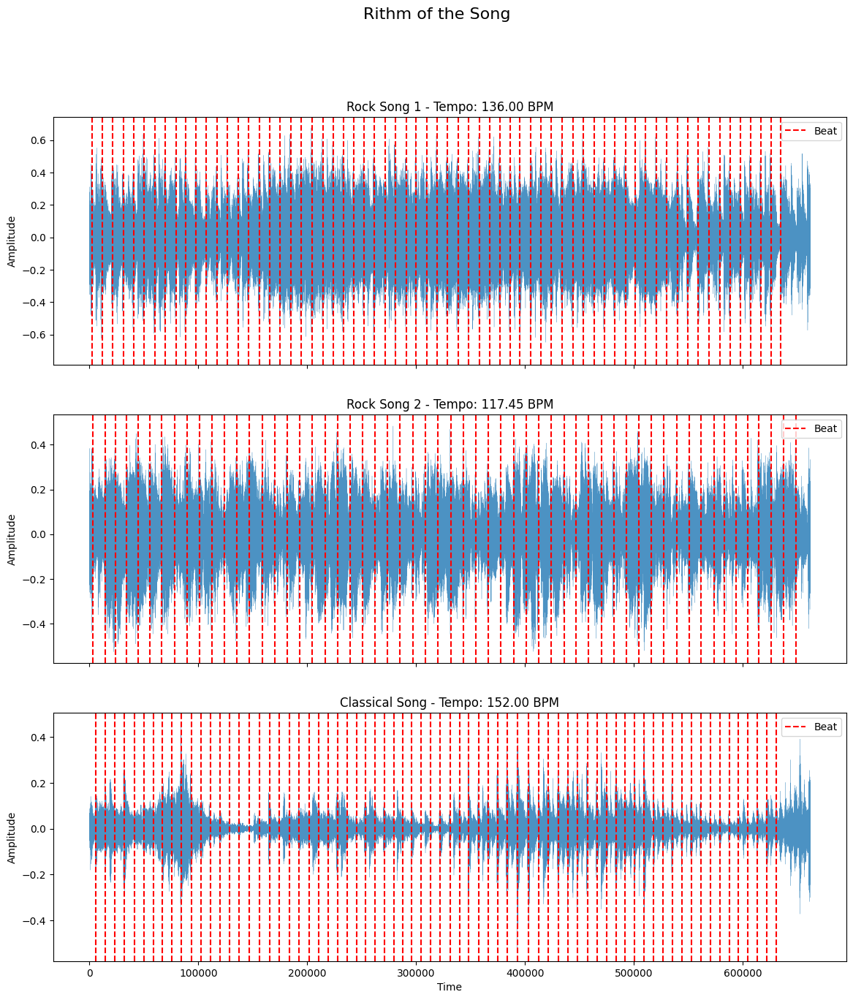

In [ ]:
plot_bpm(y, y2, y3, sr=sr, songs_names=['Rock Song 1', 'Rock Song 2', 'Classical Song'])

## Spectral Centroid
è una misura delle frequenze predominanti o del "peso medio" delle frequenze presenti in uno spettrogramma o in uno spettro di potenza di un segnale audio.
In sostanza, **calcola la frequenza media per ogni istante di tempo**.

Dalla documentazione di `librosa.features.spectral_centroid`
$$
\text{centroid}(t) = \frac{\sum_k S(k, t) \cdot \text{freq}(k)}{\sum_j S(j, t)}
$$
where $S$ is a **magnitude spectrogram**, and $\text{freq}$ is the array of frequencies (e.g., FFT frequencies in Hz) of the rows of $S$.

In [ ]:
def normalize(x, axis=0):
    """
    Normalize the dataset x.
    """
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

def plot_spectral_centroid(*Y, sr, title='Spectral Centroid', xlabel='Time', ylabel='Frequency', songs_names=None):
    """
    Plot spectral centroid of the song.

    :param y: Audio time series, i.e. the time series of the amplitude values
    :param sr:  Sampling rate of y, i.e. the number of samples per second of audio
    :param title: Title of the plot
    :param xlabel: Label of the x axis
    :param ylabel: Label of the y axis
    :param songs_names: Names of the songs. If None, the title will be Song 1, Song 2, etc.
    :return:
    """

    n = len(Y)
    fig, ax = plt.subplots(n, 1, figsize=(14, 5*n), sharex=True)

    fig.suptitle(title, fontsize=16)

    if n == 1:
        ax = [ax]

    for i in range(n):
        y = Y[i]

        # Computing the spectral centroid for each frame
        cent = librosa.feature.spectral_centroid(y=y, sr=sr)[0]

        # Computing the time variable for visualization
        frames = range(len(cent))

        # Converts frame counts to time (seconds)
        t = librosa.frames_to_time(frames)

        librosa.display.waveshow(y, sr=sr, linewidth=.5,  alpha=0.4, ax=ax[i])
        ax[i].plot(t, normalize(cent), color='#FFB100', label='Spectral Centroid', linewidth=2)

        title = songs_names[i] if songs_names else f'Song {i+1}'

        ax[i].set_title(title)
        ax[i].set_xlabel(xlabel)
        ax[i].set_ylabel(ylabel)
        ax[i].legend()
    plt.show()

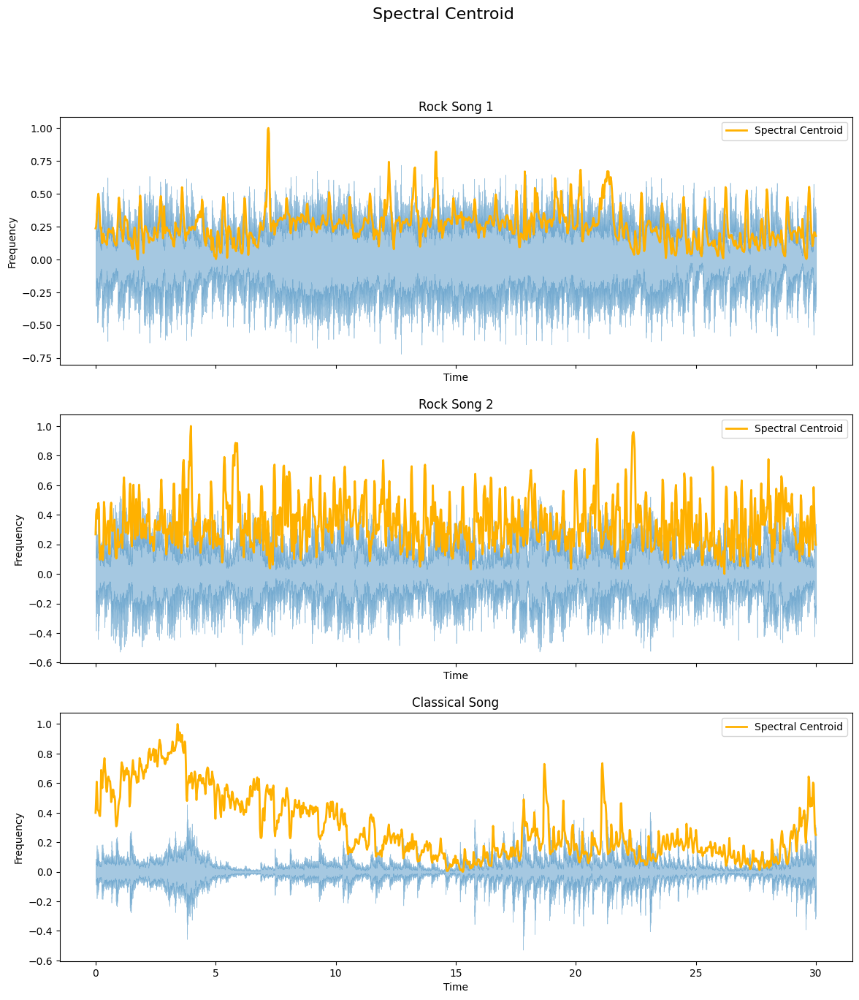

In [ ]:
plot_spectral_centroid(y, y2, y3, sr=sr, songs_names=['Rock Song 1', 'Rock Song 2', 'Classical Song'])

In [ ]:
# plot spectral centroid of all the songs, and the mean of the spectral centroid of each one, in one plot
def compare_spectral_centroids(*Y, sr, degree=10, normalized=True, songs_names=None):

    # Computing the spectral centroid for each frame
    centroids = [
        librosa.feature.spectral_centroid(y=y, sr=sr)[0]
        for y in Y
    ]

    if normalized:
        centroids = [normalize(c) for c in centroids]

    # Compute the regression line for each song
    reg_lines = [
        np.polyfit(range(len(c)), c, degree)
        for c in centroids
    ]

    # Computing the time variable for visualization
    frames = range(len(centroids[0]))

    # Converts frame counts to time (seconds)
    t = librosa.frames_to_time(frames)

    functions = [np.poly1d(r) for r in reg_lines]

    # Plotting the Spectral Centroid along the waveform
    plt.figure(figsize=(14, 5))
    colors = ['red', 'green', 'blue']
    for i in range(len(centroids)):
        label = songs_names[i] if songs_names else f'Song {i+1}'
        plt.plot(t, centroids[i], color=colors[i], linewidth=.2)
        plt.plot(t, functions[i](frames), color=colors[i], linestyle='--', linewidth=2, label=label)

    plt.title(f'{"Normalized " if normalized else ""}Spectral Centroid Regression Comparison')
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

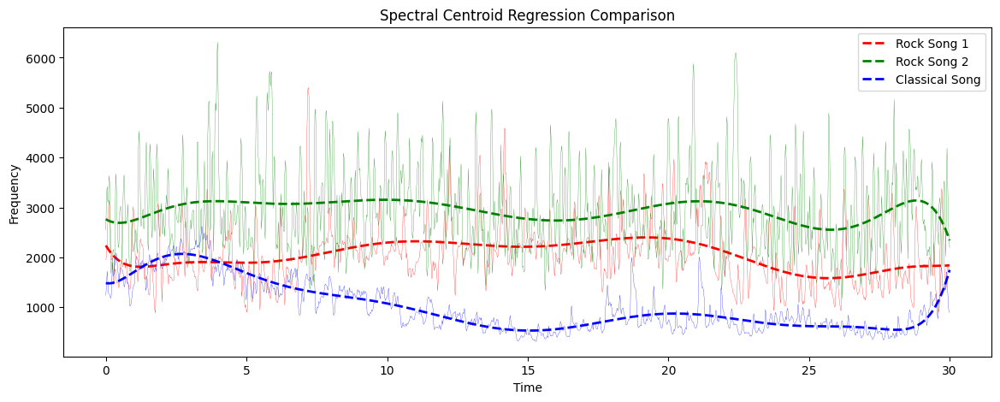

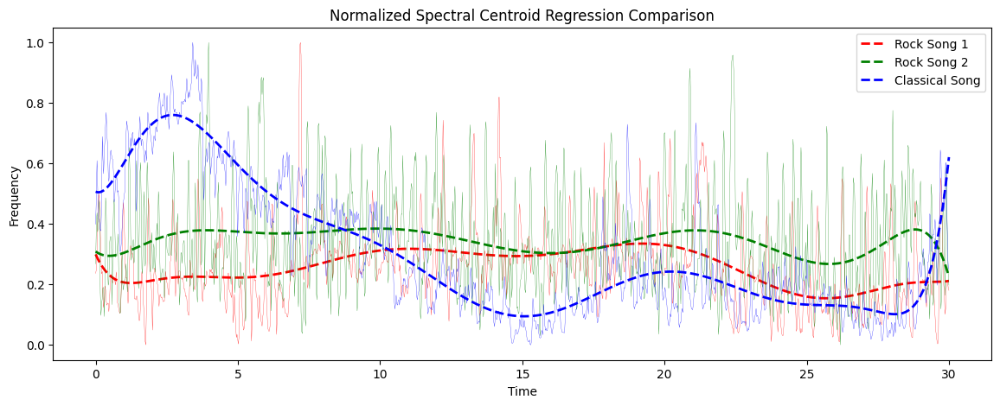

In [ ]:
compare_spectral_centroids(y, y2, y3, sr=sr, normalized=False, songs_names=['Rock Song 1', 'Rock Song 2', 'Classical Song'])
compare_spectral_centroids(y, y2, y3, sr=sr, songs_names=['Rock Song 1', 'Rock Song 2', 'Classical Song'])


## Mel-Frequency Cepstral Coefficients
Sono una serie di coefficienti utilizzati per rappresentare le caratteristiche spettrali di un segnale audio in un formato compatibile con la percezione umana delle frequenze (vengono utilizzati soprettutto per il riconoscimento e la sintesi vocale).
Per essere più precisi, i coefficienti MFCC rappresentano una serie di valori numerici che catturano le caratteristiche spettrali del segnale audio in un dato frame temporale.
Ad esempio, nella cella (1,2) troveremo il valore del terzo coefficiente di mel nel secondo frame.

In [ ]:
def plot_mfcc(*Y, sr, songs_names=None):

    n = len(Y)
    fig, ax = plt.subplots(n, 1, figsize=(14, 5*n), sharex=True)
    fig.suptitle('Mel-frequency cepstral coefficients (MFCC)', fontsize=16)

    if n == 1:
        ax = [ax]

    for i in range(n):

        # mfcc of the song
        mfcc = librosa.feature.mfcc(y=Y[i], sr=sr)

        mean = np.mean(mfcc)
        variance = np.var(mfcc)

        # scale the mfcc
        mfcc = sklearn.preprocessing.scale(mfcc, axis=1)

        # display the mfcc
        librosa.display.specshow(mfcc, sr=sr, x_axis='time', ax=ax[i])

        # set title
        title = songs_names[i] if songs_names else f'Song {i+1}'
        ax[i].set_title(f'{title}\nMean: {mean:.2f}, Variance: {variance:.2f}')

        # set x and y labels
        ax[i].set_xlabel(None)
        ax[i].set_ylabel('MFCC')

    ax[-1].set_xlabel('Time')

    plt.show()

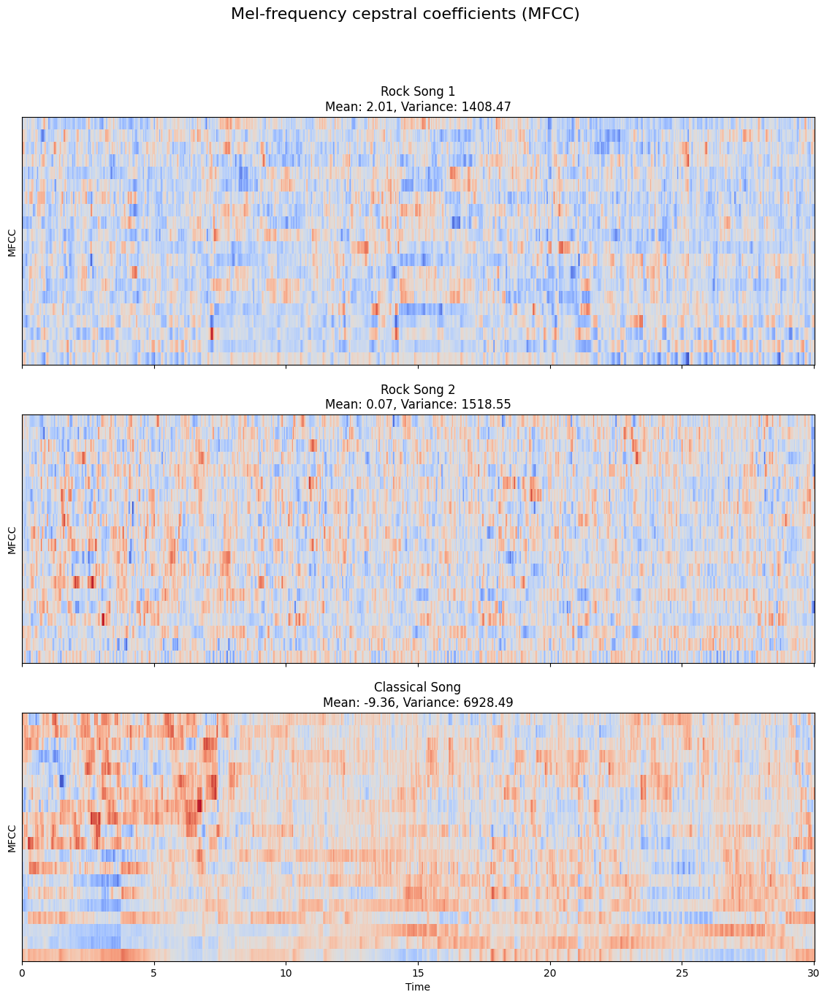

In [ ]:
plot_mfcc(y, y2, y3, sr=sr, songs_names=['Rock Song 1', 'Rock Song 2', 'Classical Song'])

------------------------
# Dataset
2 file CSV contenenti le features dei file audio. Un file contiene, per ciascuna canzone (lunga 30 secondi), la media e la varianza calcolate su diverse features che possono essere estratte da un file audio. L'altro file ha la stessa struttura, ma le canzoni sono state divise in file audio da 3 secondi ciascuno (in questo modo aumentando di 10 volte la quantità di dati che alimentano i nostri modelli di classificazione).

In [6]:
def load_data(reduced=True) -> pd.DataFrame:
    """
    Load the dataset.
    If reduced is True, load the dataset with 3 seconds of audio for each song (total size 9990 records circa).
    If reduced is False, load the dataset with the full length of the songs (total size 1000 records circa).
    """

    file_name = 'features_3_sec.csv' if reduced else 'features_30_sec.csv'

    # load the dataset
    data = pd.read_csv(os.path.join(os.getcwd(), 'archive/Data', file_name))

    # drop filename column
    data.drop(['filename'], axis=1, inplace=True)

    return data

In [7]:
df_3sec = load_data()
df_3sec

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,66149,0.349126,0.080515,0.050019,0.000097,1499.083005,164266.886443,1718.707215,85931.574523,3015.559458,...,42.485981,-9.094270,38.326839,-4.246976,31.049839,-5.625813,48.804092,1.818823,38.966969,rock
9986,66149,0.372564,0.082626,0.057897,0.000088,1847.965128,281054.935973,1906.468492,99727.037054,3746.694524,...,32.415203,-12.375726,66.418587,-3.081278,54.414265,-11.960546,63.452255,0.428857,18.697033,rock
9987,66149,0.347481,0.089019,0.052403,0.000701,1346.157659,662956.246325,1561.859087,138762.841945,2442.362154,...,78.228149,-2.524483,21.778994,4.809936,25.980829,1.775686,48.582378,-0.299545,41.586990,rock
9988,66149,0.387527,0.084815,0.066430,0.000320,2084.515327,203891.039161,2018.366254,22860.992562,4313.266226,...,28.323744,-5.363541,17.209942,6.462601,21.442928,2.354765,24.843613,0.675824,12.787750,rock


In [8]:
df_30sec = load_data(reduced=False)
df_30sec

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,661794,0.352063,0.080487,0.079486,0.000345,2008.149458,282174.689224,2106.541053,88609.749506,4253.557033,...,45.050526,-13.289984,41.754955,2.484145,36.778877,-6.713265,54.866825,-1.193787,49.950665,rock
996,661794,0.398687,0.075086,0.076458,0.000588,2006.843354,182114.709510,2068.942009,82426.016726,4149.338328,...,33.851742,-10.848309,39.395096,1.881229,32.010040,-7.461491,39.196327,-2.795338,31.773624,rock
997,661794,0.432142,0.075268,0.081651,0.000322,2077.526598,231657.968040,1927.293153,74717.124394,4031.405321,...,33.597008,-12.845291,36.367264,3.440978,36.001110,-12.588070,42.502201,-2.106337,29.865515,rock
998,661794,0.362485,0.091506,0.083860,0.001211,1398.699344,240318.731073,1818.450280,109090.207161,3015.631004,...,46.324894,-4.416050,43.583942,1.556207,34.331261,-5.041897,47.227180,-3.590644,41.299088,rock


In [13]:
df_3sec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 59 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   length                   9990 non-null   int64  
 1   chroma_stft_mean         9990 non-null   float64
 2   chroma_stft_var          9990 non-null   float64
 3   rms_mean                 9990 non-null   float64
 4   rms_var                  9990 non-null   float64
 5   spectral_centroid_mean   9990 non-null   float64
 6   spectral_centroid_var    9990 non-null   float64
 7   spectral_bandwidth_mean  9990 non-null   float64
 8   spectral_bandwidth_var   9990 non-null   float64
 9   rolloff_mean             9990 non-null   float64
 10  rolloff_var              9990 non-null   float64
 11  zero_crossing_rate_mean  9990 non-null   float64
 12  zero_crossing_rate_var   9990 non-null   float64
 13  harmony_mean             9990 non-null   float64
 14  harmony_var             

In [14]:
df_3sec.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,9990.0,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,...,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000
mean,66149.0,0.379534,0.084876,0.130859,2.676388e-03,2199.219431,4.166727e+05,2241.385959,1.182711e+05,4566.076592,...,1.448240,49.988755,-4.198706,51.962753,0.739943,52.488851,-2.497306,54.973829,-0.917584,57.322614
std,0.0,0.090466,0.009637,0.068545,3.585628e-03,751.860611,4.349644e+05,543.854449,1.013505e+05,1642.065335,...,5.735149,34.442816,5.677379,36.400669,5.181313,38.177120,5.111799,41.585677,5.253243,46.444212
min,66149.0,0.107108,0.015345,0.000953,4.379535e-08,472.741636,8.118813e+02,499.162910,1.183520e+03,658.336276,...,-26.850016,1.325786,-27.809795,1.624544,-20.733809,3.437439,-27.448456,3.065302,-35.640659,0.282131
25%,66149.0,0.315698,0.079833,0.083782,6.145900e-04,1630.680158,1.231961e+05,1887.455790,4.876553e+04,3378.311110,...,-2.227478,29.584894,-7.951722,29.863448,-2.516638,29.636197,-5.734123,30.496412,-4.004475,30.011365
50%,66149.0,0.384741,0.085108,0.121253,1.491318e-03,2208.628236,2.650692e+05,2230.575595,8.996072e+04,4631.377892,...,1.461623,41.702393,-4.443021,42.393583,0.733772,41.831377,-2.702366,43.435253,-1.030939,44.332155
75%,66149.0,0.442443,0.091092,0.176328,3.130862e-03,2712.581884,5.624152e+05,2588.340505,1.585674e+05,5591.634521,...,5.149752,59.274619,-0.726945,61.676964,3.888734,62.033906,0.514246,65.328602,2.216603,68.210421
max,66149.0,0.749481,0.120964,0.442567,3.261522e-02,5432.534406,4.794119e+06,3708.147554,1.235143e+06,9487.446477,...,39.144405,683.932556,34.048843,529.363342,36.970322,629.729797,31.365425,1143.230591,34.212101,910.473206


In [9]:
CATEGORIES = df_3sec['label'].unique()
CATEGORIES

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock'], dtype=object)

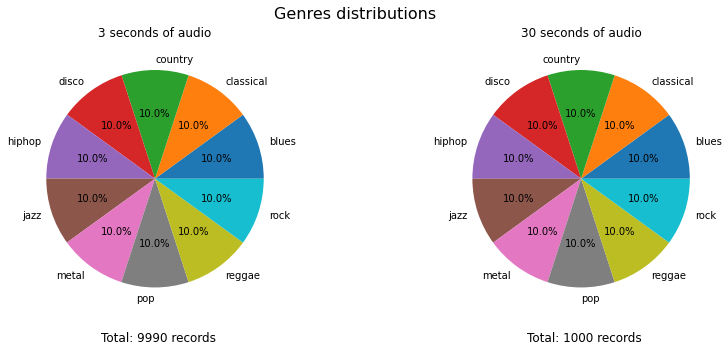

In [62]:
# plot a pie chart of genres
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5), facecolor='white')
fig.suptitle('Genres distributions', fontsize=16)

# plot a bar chart of genres
ax1.pie(df_3sec.groupby('label').size(), labels=CATEGORIES, autopct='%1.1f%%')
ax1.set_title('3 seconds of audio')
ax1.text(-.5, -1.5, 'Total: {} records'.format(len(df_3sec)), fontsize=12)


ax2.pie(df_30sec.groupby('label').size(), labels=CATEGORIES, autopct='%1.1f%%')
ax2.set_title('30 seconds of audio')
ax2.text(-.5, -1.5, 'Total: {} records'.format(len(df_30sec)), fontsize=12)

plt.show()

## Analisi sui dati

In [13]:
def compute_correlation_matrix(df: pd.DataFrame) -> pd.DataFrame:

    # ignore the label column
    df_corr = df.drop(['label'], axis=1)

    # compute the correlation matrix
    corr = df_corr.corr()

    return corr

# plot correlation matrix
def plot_correlation_matrix(df: pd.DataFrame, title: str = 'Correlation Matrix'):

    # compute the correlation matrix
    corr = compute_correlation_matrix(df)

    # generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # set up the matplotlib figure
    plt.subplots(figsize=(14, 10))

    # generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask,  cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})

    plt.title(title)
    plt.show()

### Correlation Matrix
Indica quanto due features sono collegate tra loro.

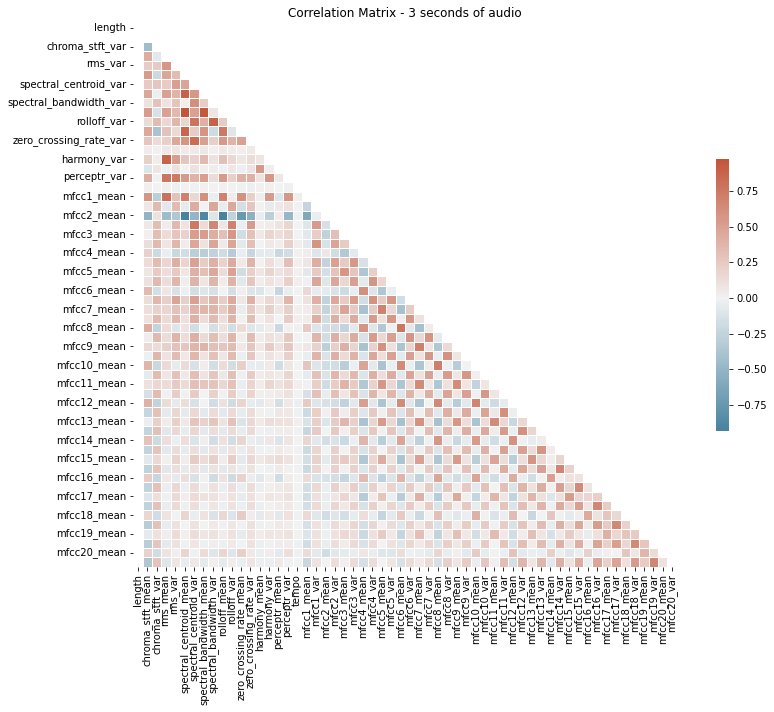

In [14]:
plot_correlation_matrix(df_3sec, title='Correlation Matrix - 3 seconds of audio')

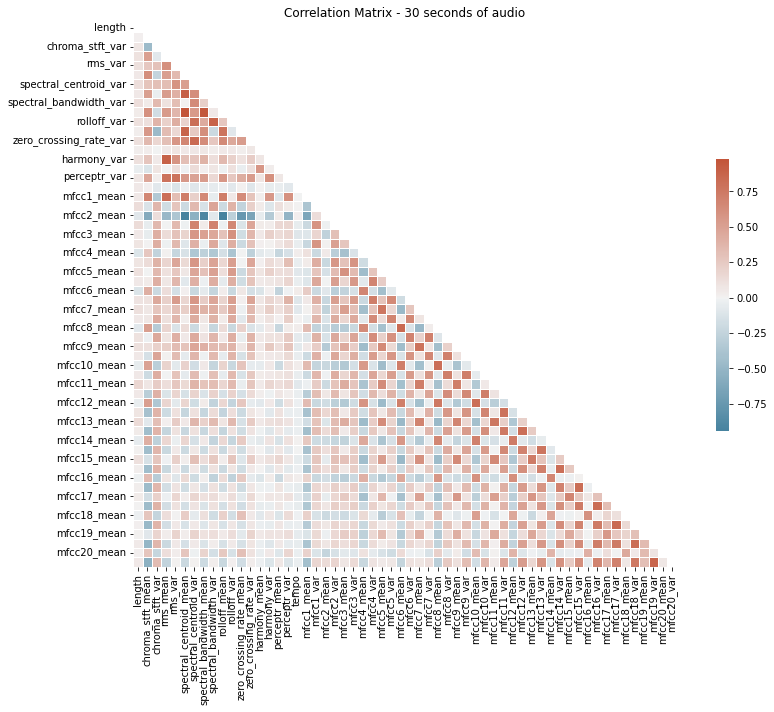

In [17]:
plot_correlation_matrix(df_30sec, title='Correlation Matrix - 30 seconds of audio')

### Pairplot
Permette di valutare la correlazione visuale tra le coppie di features. Ad esempio, un'associazione positiva mostrerà punti che si spostano in su e verso destra, mentre un'associazione negativa mostrerà punti che si spostano in su e verso sinistra.

In [15]:
# seaborn pairplot
# select some genres, some features and plot the pairplot
def plot_pairplot(df: pd.DataFrame, features: list, genres: list, n: Optional[int] = None, title: str = 'Pairplot'):

    # select the genres
    d = df[df['label'].isin(genres)]

    # if n is defined, select n random records
    if n:
        d = d.sample(n=n)

    # plot the pairplot
    sns.pairplot(d[features + ['label']], hue='label', height=2.5)
    plt.suptitle(title)
    plt.show()


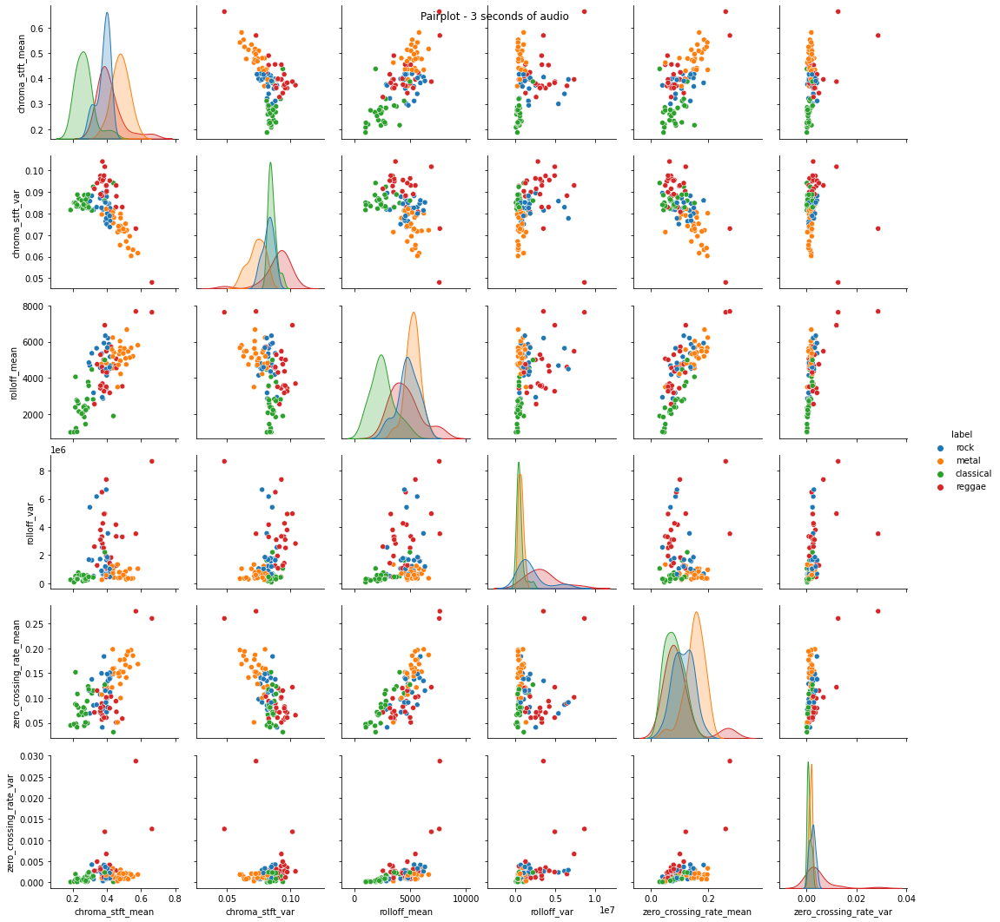

In [17]:
plot_pairplot(
    df_30sec,
    n = 100,
    features=[
        'chroma_stft_mean',
        'chroma_stft_var',
        'rolloff_mean',
        'rolloff_var',
        'zero_crossing_rate_mean',
        'zero_crossing_rate_var'
        ],
    genres=['rock', 'classical', 'metal', 'reggae'],
    title='Pairplot - 3 seconds of audio',
)

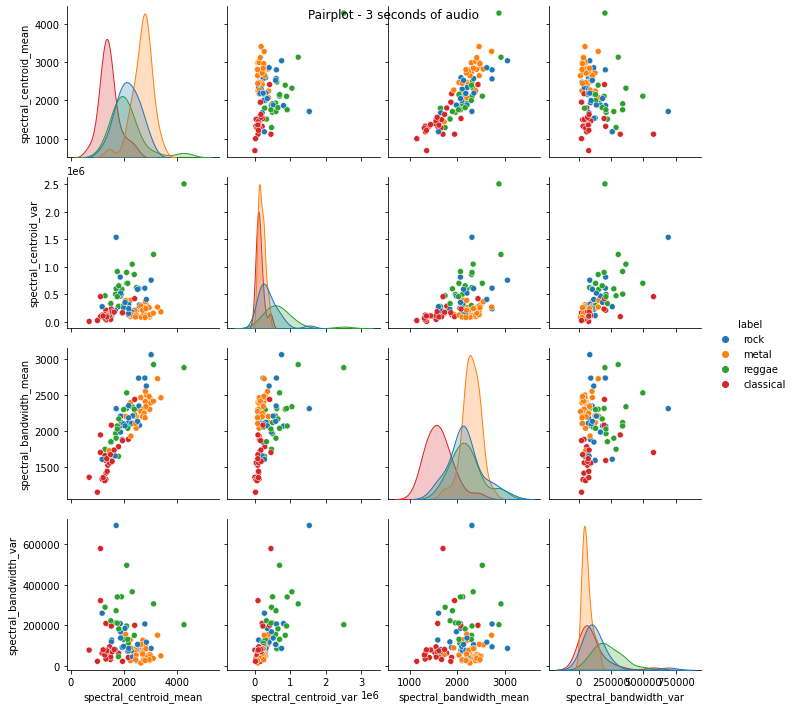

In [18]:
plot_pairplot(
    df_30sec,
    n = 100,
    features=[
        'spectral_centroid_mean',
        'spectral_centroid_var',
        'spectral_bandwidth_mean',
        'spectral_bandwidth_var'
        ],
    genres=['rock', 'classical', 'metal', 'reggae'],
    title='Pairplot - 3 seconds of audio',
)

## PCA
Faccio la proiezione in uno spazio d'. I vettori base di questo spazio d' saranno gli autovettori della matrice di covarianza dello spazio iniziale con autovalori massimi.

In [16]:

def plot_eigenvalues(y: pd.DataFrame, title: str = 'Eigenvalues'):
    """
    Plot the eigenvalues of the correlation matrix of the dataset.
    :param y: Dataset
    :param title: Title of the plot
    :return:
    """

    # compute the correlation matrix
    corr = compute_correlation_matrix(y)

    # remove NaN
    corr = corr.fillna(0)

    # normalize the correlation matrix
    corr = sklearn.preprocessing.normalize(corr)

    # compute the eigenvalues
    eig_vals = np.linalg.eigvals(corr)
    # _, eig_vals, _ = np.linalg.svd(corr)

    # sort the eigenvalues
    eig_vals = np.sort(eig_vals)[::-1]

    # plot the eigenvalues
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(title, fontsize=16)

    ax1.plot(eig_vals, linewidth=.8, marker='o', markersize=4, markerfacecolor='red', markeredgecolor='red')
    ax1.set_title('Eigenvalues - Sorted')

    # compute the cumulative sum of the eigenvalues
    cumsum = np.cumsum(eig_vals)

    # find the point on cumsum line that is closest to the 95% of the variance
    idx = np.argmin(np.abs(cumsum - cumsum[-1]*.95))

    # plot the eigenvalues horizontal line that represents the 95% of the variance
    ax2.axhline(cumsum[idx], color='black', linestyle='--', linewidth=1)
    ax2.text(0, cumsum[idx]+.3, '95% of the variance', fontsize=12)

    # plot the eigenvalues vertical line that represents the number of eigenvalues that represents the 95% of the variance
    ax2.axvline(idx, color='black', linestyle='--', linewidth=1)
    ax2.text(idx+1, 5, f'{idx} eigenvalues', fontsize=12)

    # plot the cumulative sum of the eigenvalues
    ax2.plot(cumsum, linewidth=.8, marker='o', markersize=4, markerfacecolor='red', markeredgecolor='red')
    ax2.set_title('Cumulative Sum of the Eigenvalues')

    plt.show()

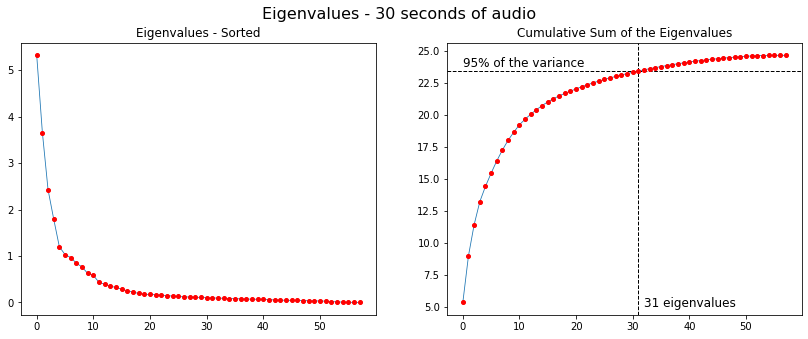

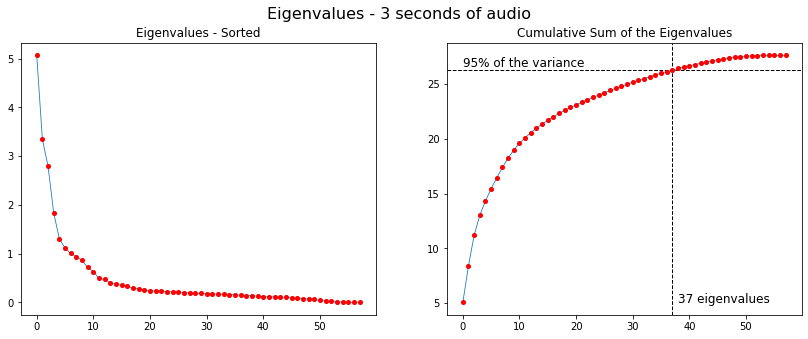

In [17]:

plot_eigenvalues(df_30sec, title='Eigenvalues - 30 seconds of audio')
plot_eigenvalues(df_3sec, title='Eigenvalues - 3 seconds of audio')

In [20]:
from sklearn import preprocessing
from sklearn.decomposition import PCA

def plot_2d_pca(df : pd.DataFrame, title : str):
    """
    Plot the dataset in 2D using PCA.
    :param df: Dataset
    :return:
    """

    df = df.copy()
    y = df['label']
    X = df.loc[:, df.columns != 'label']

    # normalize
    # X = preprocessing.normalize(X)
    cols = X.columns
    min_max_scaler = preprocessing.MinMaxScaler()
    np_scaled = min_max_scaler.fit_transform(X)
    X = pd.DataFrame(np_scaled, columns = cols)


    pca = PCA(n_components=2)
    principalComponents = pca.fit_transform(X)
    principalDf = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])

    finalDf = pd.concat([principalDf, y], axis = 1)
    # sample 100 elements
    finalDf = finalDf.sample(n=1000, replace=False)

    # Crea una figura principale
    fig = plt.figure(figsize=(16, 14))
    fig.suptitle(title, fontsize=16)

    # Crea il plot grande al centro
    ax_pca = plt.subplot2grid((2, 3), (0, 0), colspan=3)
    ax_pca.set_title('PCA on Genres', fontsize = 25)
    ax_pca.set_xlabel("Principal Component 1", fontsize = 15)
    ax_pca.set_ylabel("Principal Component 2", fontsize = 15)
    ax_pca.tick_params(axis='both', which='major', labelsize=14)
    sns.scatterplot(x = "pc1", y = "pc2", data = finalDf, hue = "label", alpha = 0.7, s = 100, ax=ax_pca)

    # Crea i tre plot più piccoli sotto
    ax1 = plt.subplot2grid((2,3), (1, 0))
    ax1.set_title('Metal vs PoP')
    ax1.set_xlabel(None)
    ax1.set_ylabel(None)
    ax1.set_xticks([])
    ax1.set_yticks([])
    sns.scatterplot(x = "pc1", y = "pc2", data = finalDf[finalDf['label'].isin(['metal', 'pop'])], hue = "label", alpha = 0.7, s = 100, ax=ax1)

    ax2 = plt.subplot2grid((2,3), (1, 1))
    ax2.set_title('Rock vs Classical')
    ax2.set_xlabel(None)
    ax2.set_ylabel(None)
    ax2.set_xticks([])
    ax2.set_yticks([])
    sns.scatterplot(x = "pc1", y = "pc2", data = finalDf[finalDf['label'].isin(['rock', 'classical'])], hue = "label", alpha = 0.7, s = 100, ax=ax2)

    ax3 = plt.subplot2grid((2,3), (1, 2))
    ax3.set_title('Reggae vs Country')
    ax3.set_xlabel(None)
    ax3.set_ylabel(None)
    ax3.set_xticks([])
    ax3.set_yticks([])
    sns.scatterplot(x = "pc1", y = "pc2", data = finalDf[finalDf['label'].isin(['reggae', 'country'])], hue = "label", alpha = 0.7, s = 100, ax=ax3)

    plt.show()


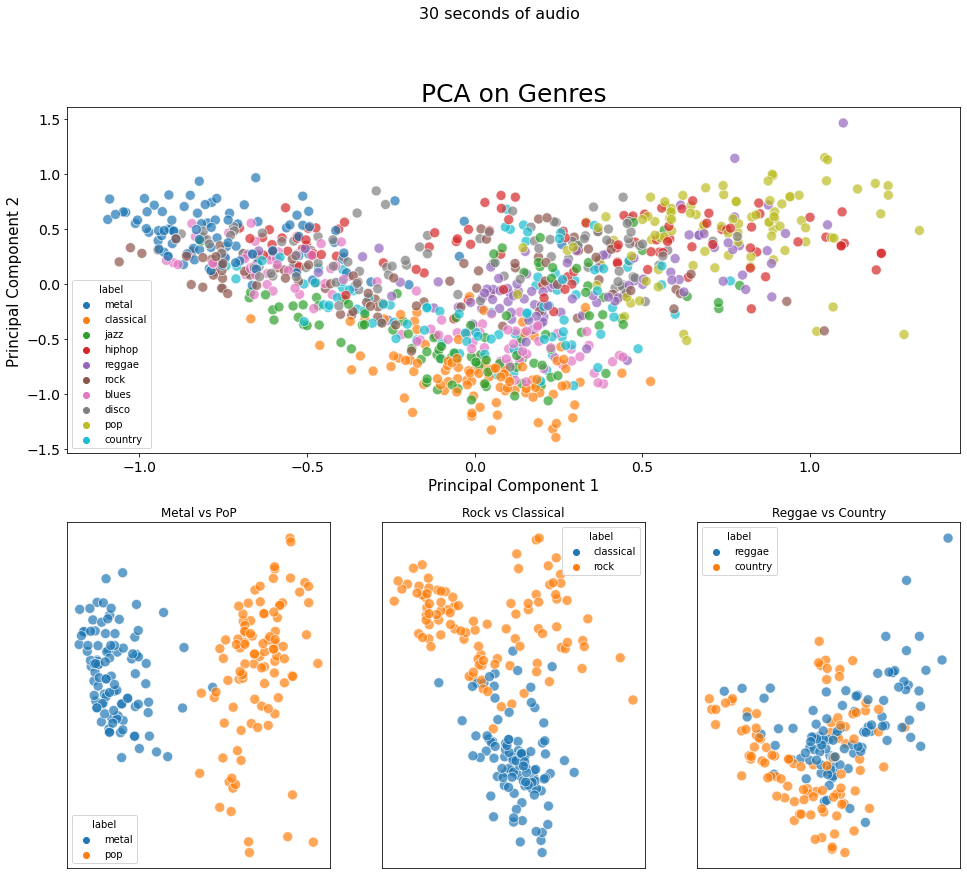

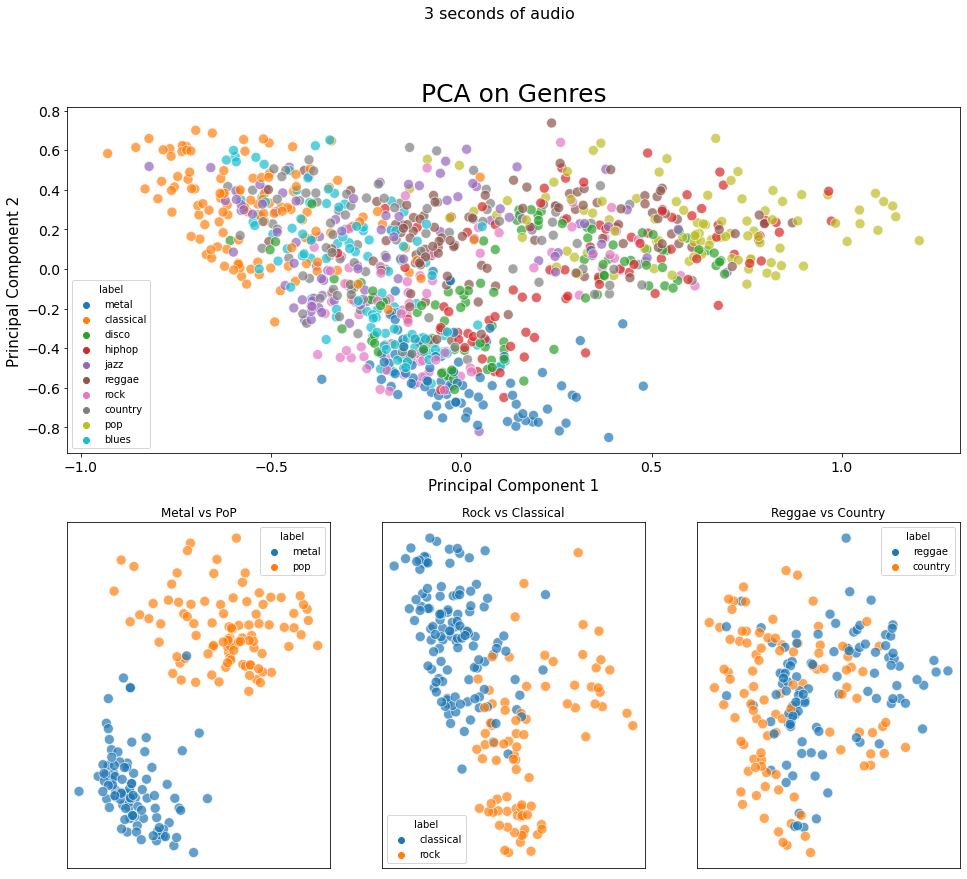

In [22]:
plot_2d_pca(df_30sec, '30 seconds of audio')
plot_2d_pca(df_3sec, '3 seconds of audio')

In [21]:
from sklearn.preprocessing import StandardScaler

def reduce_dimensionality_with_pca(y: pd.DataFrame, n_features: int):
    """
    Reduce dataset dimensionality using PCA.
    :param y: Dataset
    :param explained_variance_threshold: Explained variance threshold (e.g., 0.95 for 95%)
    :return: Reduced dataset
    """

    #Divide il DataFrame in colonne numeriche e categoriche
    numeric_columns = y.select_dtypes(include=[np.number])
    categorical_columns = y.select_dtypes(include=[object])

    # Applica la PCA solo alle colonne numeriche
    pca = PCA(n_components=n_features)
    scaled_numeric_columns = StandardScaler().fit_transform(numeric_columns)
    reduced_data_numeric = pca.fit_transform(scaled_numeric_columns)

    # Crea un DataFrame per le colonne numeriche ridotte
    reduced_df_numeric = pd.DataFrame(reduced_data_numeric, index=y.index, columns=[f'PC{i}' for i in range(1, pca.n_components_ + 1)])

    # Concatena le colonne numeriche ridotte con le colonne categoriche
    reduced_df = pd.concat([reduced_df_numeric, categorical_columns], axis=1)

    return reduced_df

#Reduce dataset dimensionality using PCA
reduced_df_30sec = reduce_dimensionality_with_pca(df_30sec, n_features = 31)
reduced_df_3sec = reduce_dimensionality_with_pca(df_3sec, n_features = 37)
#Creare un DataFrame con le informazioni prima della PCA
pre_pca_info = pd.DataFrame({
    'Nome del Dataset': ['df_30sec', 'df_3sec'],
    'Righe pre PCA': [df_30sec.shape[0], df_3sec.shape[0]],
    'Colonne pre PCA': [df_30sec.shape[1], df_3sec.shape[1]]
})
print(pre_pca_info)
print("-------------------------------------------------------")
#Creare un DataFrame con le informazioni dopo la PCA
post_pca_info = pd.DataFrame({
    'Nome del Dataset': ['reduced_df_30sec', 'reduced_df_3sec'],
    'Righe post PCA': [reduced_df_30sec.shape[0], reduced_df_3sec.shape[0]],
    'Colonne post PCA': [reduced_df_30sec.shape[1], reduced_df_3sec.shape[1]]
})
print(post_pca_info)

reduced_df_30sec

  Nome del Dataset  Righe pre PCA  Colonne pre PCA
0         df_30sec           1000               59
1          df_3sec           9990               59
-------------------------------------------------------
   Nome del Dataset  Righe post PCA  Colonne post PCA
0  reduced_df_30sec            1000                32
1   reduced_df_3sec            9990                38


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,label
0,-2.789358,-1.021673,-0.523478,-0.115987,-0.714269,0.987114,0.342778,-0.432070,-0.174436,-0.288043,...,-0.018851,-0.452812,0.395365,0.280547,0.242187,-0.210625,0.253765,-0.473476,-0.153742,blues
1,1.716939,-1.178053,1.349842,-2.460841,-2.059087,0.027979,0.060531,-0.266079,-1.040323,-1.510064,...,-0.061935,-0.130997,0.783397,0.520576,-0.648978,-0.063624,0.577493,-0.092411,-0.343834,blues
2,-2.821820,-1.562924,-0.090188,-1.597133,0.699041,1.721768,0.535122,-0.202629,0.513250,0.749519,...,0.662333,-0.139553,-0.410718,0.473196,-0.340793,0.168298,-0.347201,-0.317507,-0.365259,blues
3,0.336500,-1.485133,-1.524418,-1.898587,-1.888025,2.345393,0.198015,-0.131726,-0.582143,-1.053514,...,0.427959,0.074134,-0.319784,0.056555,-0.130229,-0.184145,-0.006678,-0.000555,0.504027,blues
4,0.610026,-3.206651,0.136129,-2.214040,3.250132,-0.026959,1.492246,0.106339,1.252430,0.467842,...,0.724263,-1.077024,0.270248,0.256761,0.117039,0.035362,0.527618,-0.893964,0.877176,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-4.864834,-1.524550,0.630490,-1.190875,0.655462,-0.744803,-0.336785,-0.749844,-1.005793,0.142932,...,0.111801,0.740159,0.274326,-0.592619,0.107020,-0.038610,0.126894,0.499059,0.609909,rock
996,-5.856512,-1.375977,-0.203681,-1.008859,0.360023,-0.732236,0.160561,-0.775757,-0.679074,0.797867,...,0.169727,0.258455,0.363939,-0.143162,0.067617,0.357161,-0.682525,0.409625,0.453537,rock
997,-5.947644,-1.278267,0.439746,-1.663879,1.637868,-1.007204,0.503281,-0.506264,-0.108861,0.849435,...,0.303523,0.457043,-0.336706,-0.677581,0.753127,0.127756,-0.087008,-0.330979,0.031061,rock
998,-0.809493,-1.968865,-0.360004,-2.831151,-1.357196,0.106524,0.005015,-0.757346,-0.406751,-1.099393,...,0.850790,-0.403375,0.810978,0.048651,0.931895,0.450467,-0.148499,0.984534,0.312741,rock


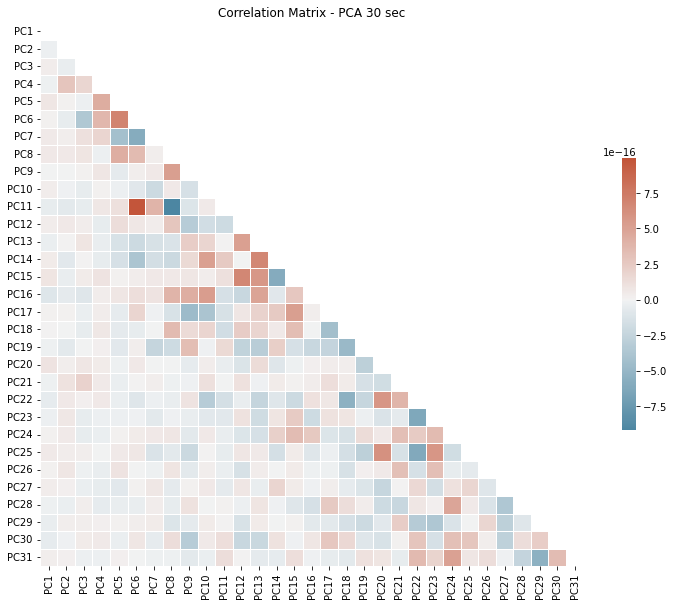

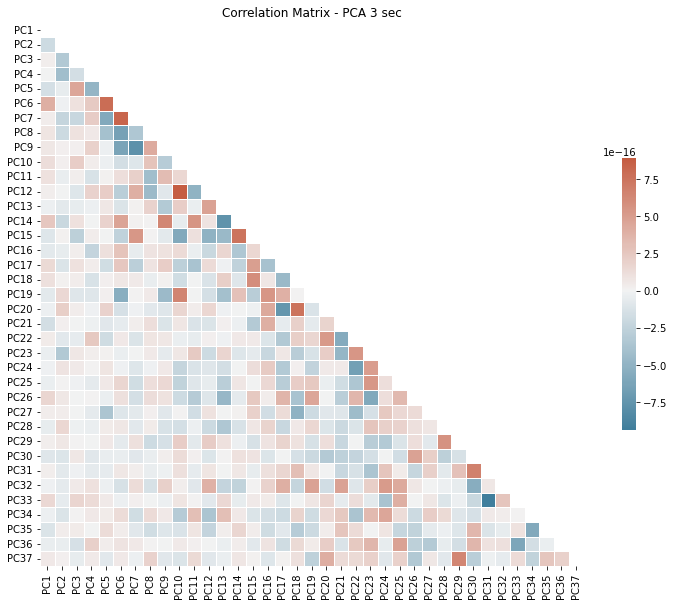

In [53]:
plot_correlation_matrix(reduced_df_30sec, 'Correlation Matrix - PCA 30 sec')
plot_correlation_matrix(reduced_df_3sec, 'Correlation Matrix - PCA 3 sec')

--------
# Models

### Premessa sui risultati
Sarà possibile osservare che i modelli confondono generi musicali simili tra loro, ad esempio confondono il blues con il rock o il country, tre generi con alcune caratteristiche sovrapponibili. L'interpretazione della musica è un'attività soggettiva, perciò potrebbero esserci opinioni divergenti sulla classificazione di un brano anche nella realtà.
La confusione tra generi musicali potrebbe derivare da caratteristiche sonore sovrapponibili tra i generi stessi. Inoltre occorre ricordare che ogni musicista ha un proprio stile e questa enorme varietà di stili all'interno di generi simili potrebbe rendere la classificazione dei generi più difficile, poiché la differenza tra di essi è sfumata ed ambigua.

Se ci sono tratti distintivi o stili comuni presenti in più generi musicali, le feature che li rappresentano potrebbero mostrare una correlazione significativa.

In [22]:
# split the dataset in train and test
from sklearn.model_selection import train_test_split

def split_dataset(df: pd.DataFrame, test_size: float = 0.2, random_state: int = 42) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Split the dataset in train and test.
    :param df: Dataset
    :param test_size: Size of the test set
    :param random_state: Random state
    :return: Tuple of the train and test set
    """

    # split the dataset
    train, test = train_test_split(df, test_size=test_size, random_state=random_state)

    return train, test

In [23]:
train_30sec, test_30sec = split_dataset(df_30sec, test_size=0.3, random_state=42)
val_30sec, test_30sec = split_dataset(test_30sec, test_size=0.5, random_state=42)
train_3sec, test_3sec = split_dataset(df_3sec, test_size=0.3, random_state=42)
val_3sec, test_3sec = split_dataset(test_3sec, test_size=0.5, random_state=42)

reduced_train_30sec, reduced_test_30sec = split_dataset(reduced_df_30sec, test_size=0.3, random_state=42)
reduced_val_30sec, reduced_test_30sec = split_dataset(reduced_test_30sec, test_size=0.5, random_state=42)
reduced_train_3sec, reduced_test_3sec = split_dataset(reduced_df_3sec, test_size=0.3, random_state=42)
reduced_val_3sec, reduced_test_3sec = split_dataset(reduced_test_3sec, test_size=0.5, random_state=42)

X_train1, y_train1 = train_30sec.loc[:, train_30sec.columns != 'label'], train_30sec['label']
X_val1, y_val1 = val_30sec.loc[:, val_30sec.columns != 'label'], val_30sec['label']
X_test1, y_test1 = test_30sec.loc[:, test_30sec.columns != 'label'], test_30sec['label']

reduced_X_train1, reduced_y_train1 = reduced_train_30sec.loc[:, reduced_train_30sec.columns != 'label'], reduced_train_30sec['label']
reduced_X_val1, reduced_y_val1 = reduced_val_30sec.loc[:, reduced_val_30sec.columns != 'label'], reduced_val_30sec['label']
reduced_X_test1, reduced_y_test1 = reduced_test_30sec.loc[:, reduced_test_30sec.columns != 'label'], reduced_test_30sec['label']

X_train2, y_train2 = train_3sec.loc[:, train_3sec.columns != 'label'], train_3sec['label']
X_val2, y_val2 = val_3sec.loc[:, val_3sec.columns != 'label'], val_3sec['label']
X_test2, y_test2 = test_3sec.loc[:, test_3sec.columns != 'label'], test_3sec['label']

reduced_X_train2, reduced_y_train2 = reduced_train_3sec.loc[:, reduced_train_3sec.columns != 'label'], reduced_train_3sec['label']
reduced_X_val2, reduced_y_val2 = reduced_val_3sec.loc[:, reduced_val_3sec.columns != 'label'], reduced_val_3sec['label']
reduced_X_test2, reduced_y_test2 = reduced_test_3sec.loc[:, reduced_test_3sec.columns != 'label'], reduced_test_3sec['label']

In [25]:
print("30 Seconds of Audio")
print(f"Train size: {X_train1.shape[0]}")
print(f"Test size: {X_test1.shape[0]}")
print(f"Validation size: {X_val1.shape[0]}")
print("=========================================")
print("3 Seconds of Audio")
print(f"Train size: {X_train2.shape[0]}")
print(f"Test size: {X_test2.shape[0]}")
print(f"Validation size: {X_val2.shape[0]}")

30 Seconds of Audio
Train size: 700
Test size: 150
Validation size: 150
3 Seconds of Audio
Train size: 6993
Test size: 1499
Validation size: 1498


In [26]:
from sklearn import metrics

def print_scores(y_true, y_pred):
    """
    Prints a report of the model output
    """
    print(metrics.classification_report(y_true, y_pred))

In [27]:
def plot_confusion_matrix(y_true, y_pred, title, ticklabels):
    """
    Plot the confusion matrix.
    :param y_true: True labels
    :param y_pred: Predicted labels
    :param title: Title of the plot
    :return:
    """

    # compute the confusion matrix
    cm = metrics.confusion_matrix(y_true, y_pred)

    # plot the confusion matrix
    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', annot_kws={"size": 16})
    plt.title(title, fontsize=16)
    plt.xlabel('Predicted', fontsize=14)
    plt.ylabel('True', fontsize=14)
    plt.xticks(np.arange(len(ticklabels)) + .5, ticklabels, fontsize=12)
    plt.yticks(np.arange(len(ticklabels)) + .5, ticklabels, fontsize=12)
    plt.show()

In [28]:
# k-fold cross validation
from sklearn.model_selection import KFold, cross_val_score

def k_fold_cross_validation(model, X, y, k=10):
    """
    Perform the k-fold cross validation.
    :param model: Model
    :param X: Features
    :param y: Labels
    :param k: Number of folds
    :return:
    """

    # define the k-fold cross validation
    kfold = KFold(n_splits=k, shuffle=True, random_state=42)

    # perform the k-fold cross validation
    scores = cross_val_score(model, X, y, cv=kfold)

    # print the results
    print(f'{k}-fold cross validation')
    print(f'Accuracy: {scores.mean():.2f} (+/- {scores.std() * 2:.2f})')

## Gaussian Naive Bayes

Il Gaussian Naive Bayes è un modello di classificazione che si basa sul teorema di Bayes. Una caratteristica chiave del GNB è l'assunzione di indipendenza tra le feature. 
Tuttavia nel caso in esame, si ha un dataset con feature molto correlate tra esse, come è stato dimostrato in precendeza tramite la Correlation Matrix.

Pertanto, i risultati e l'accuracy ottenuti vanno interpretati tenendo conto delle caratteristiche specifiche del dataset e della presenza di correlazioni tra le features.

In [29]:
## Gaussian Naive Bayes
from sklearn.naive_bayes import GaussianNB


def gaussian_naive_bayes(X_train, y_train, X_test, y_test, title: str = 'Gaussian Naive Bayes'):

    # create the model
    model = GaussianNB()

    # train the model
    model.fit(X_train, y_train)

    # make predictions
    y_pred = model.predict(X_test)

    # plot the confusion matrix
    plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

    # print the scores
    print_scores(y_test, y_pred)

    # k-fold cross validation
    k_fold_cross_validation(model, X_train, y_train)

    print("=========================================")



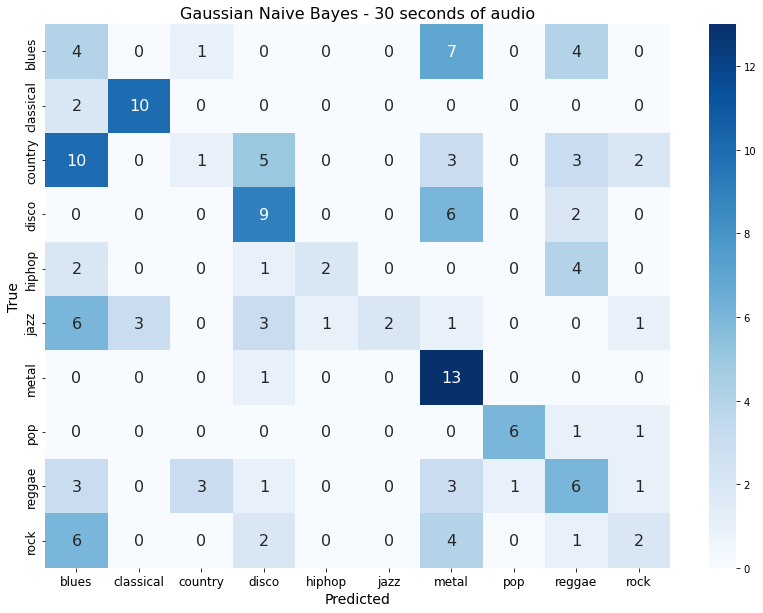

              precision    recall  f1-score   support

       blues       0.12      0.25      0.16        16
   classical       0.77      0.83      0.80        12
     country       0.20      0.04      0.07        24
       disco       0.41      0.53      0.46        17
      hiphop       0.67      0.22      0.33         9
        jazz       1.00      0.12      0.21        17
       metal       0.35      0.93      0.51        14
         pop       0.86      0.75      0.80         8
      reggae       0.29      0.33      0.31        18
        rock       0.29      0.13      0.18        15

    accuracy                           0.37       150
   macro avg       0.49      0.41      0.38       150
weighted avg       0.45      0.37      0.33       150

10-fold cross validation
Accuracy: 0.42 (+/- 0.12)


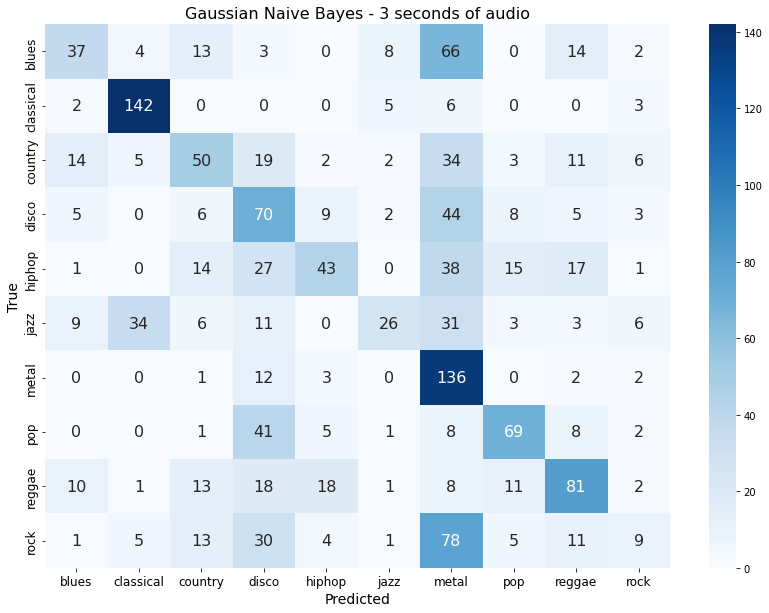

              precision    recall  f1-score   support

       blues       0.47      0.25      0.33       147
   classical       0.74      0.90      0.81       158
     country       0.43      0.34      0.38       146
       disco       0.30      0.46      0.37       152
      hiphop       0.51      0.28      0.36       156
        jazz       0.57      0.20      0.30       129
       metal       0.30      0.87      0.45       156
         pop       0.61      0.51      0.55       135
      reggae       0.53      0.50      0.51       163
        rock       0.25      0.06      0.09       157

    accuracy                           0.44      1499
   macro avg       0.47      0.44      0.42      1499
weighted avg       0.47      0.44      0.42      1499

10-fold cross validation
Accuracy: 0.42 (+/- 0.05)


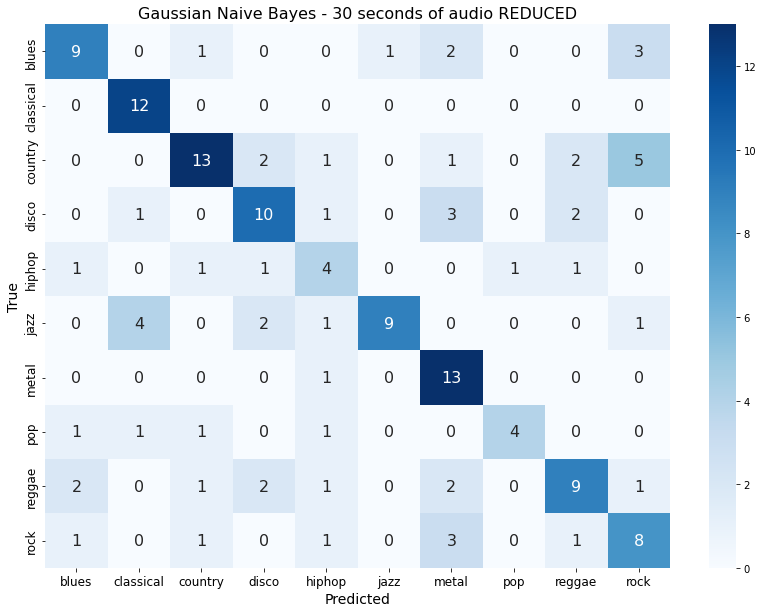

              precision    recall  f1-score   support

       blues       0.64      0.56      0.60        16
   classical       0.67      1.00      0.80        12
     country       0.72      0.54      0.62        24
       disco       0.59      0.59      0.59        17
      hiphop       0.36      0.44      0.40         9
        jazz       0.90      0.53      0.67        17
       metal       0.54      0.93      0.68        14
         pop       0.80      0.50      0.62         8
      reggae       0.60      0.50      0.55        18
        rock       0.44      0.53      0.48        15

    accuracy                           0.61       150
   macro avg       0.63      0.61      0.60       150
weighted avg       0.64      0.61      0.60       150

10-fold cross validation
Accuracy: 0.57 (+/- 0.12)


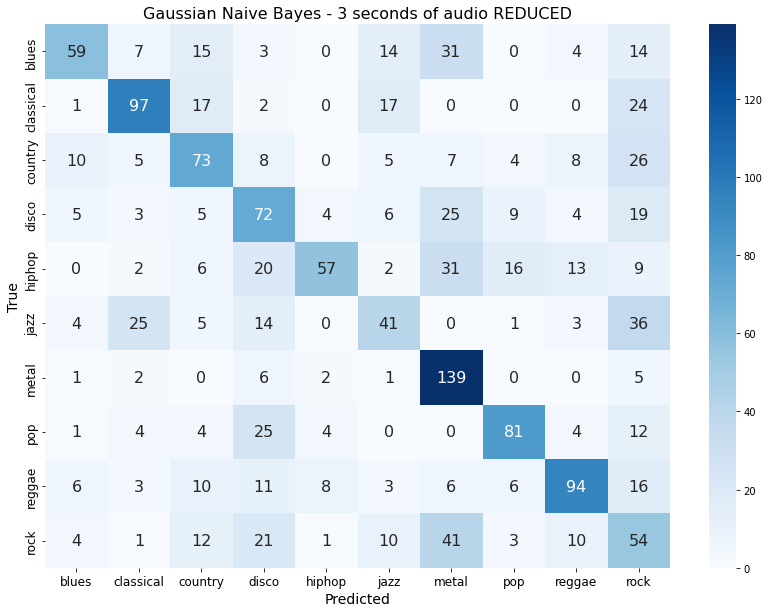

              precision    recall  f1-score   support

       blues       0.65      0.40      0.50       147
   classical       0.65      0.61      0.63       158
     country       0.50      0.50      0.50       146
       disco       0.40      0.47      0.43       152
      hiphop       0.75      0.37      0.49       156
        jazz       0.41      0.32      0.36       129
       metal       0.50      0.89      0.64       156
         pop       0.68      0.60      0.64       135
      reggae       0.67      0.58      0.62       163
        rock       0.25      0.34      0.29       157

    accuracy                           0.51      1499
   macro avg       0.54      0.51      0.51      1499
weighted avg       0.55      0.51      0.51      1499

10-fold cross validation
Accuracy: 0.50 (+/- 0.04)


In [30]:
gaussian_naive_bayes(X_train1, y_train1, X_test1, y_test1, title='Gaussian Naive Bayes - 30 seconds of audio')
gaussian_naive_bayes(X_train2, y_train2, X_test2, y_test2, title='Gaussian Naive Bayes - 3 seconds of audio')

gaussian_naive_bayes(reduced_X_train1, reduced_y_train1, reduced_X_test1, reduced_y_test1, title='Gaussian Naive Bayes - 30 seconds of audio REDUCED')
gaussian_naive_bayes(reduced_X_train2, reduced_y_train2, reduced_X_test2, reduced_y_test2, title='Gaussian Naive Bayes - 3 seconds of audio REDUCED')

### Osservazioni GNB
### Risultati ottenuti su dataset ridotto con PCA

Nel Gaussian Naive Bayes, le caratteristiche altamente correlate vengono considerate due volte, provocando una sovrastima dell'importanza di tali aspetti. Di conseguenza, le prestazioni del classificatore Naive Bayes si deteriorano.
Per migliorare la situazione, è necessario eliminare le feature correlate e seguire l'assunzione di feature indipendenti. Per individuarle graficamente possiamo fare uso della una matrice di correlazione. 

Tramite l'uso della PCA si è eseguita una Feature Extraction per poter agire sulle feature altamente correlate e ridurle. 
Possiamo osservare quindi che l'accuracy migliora dopo l'applicazione della PCA.

## Discriminant Analysis

In [31]:
# linear discriminant analysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def lda(X_train, y_train, X_test, y_test, title: str = 'LDA'):

    # create the model
    model = LinearDiscriminantAnalysis()

    # train the model
    model.fit(X_train, y_train)

    # make predictions
    y_pred = model.predict(X_test)

    # plot the confusion matrix
    plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

    # print the scores
    print_scores(y_test, y_pred)

    # k-fold cross validation
    k_fold_cross_validation(model, X_train, y_train)

    print("=========================================")

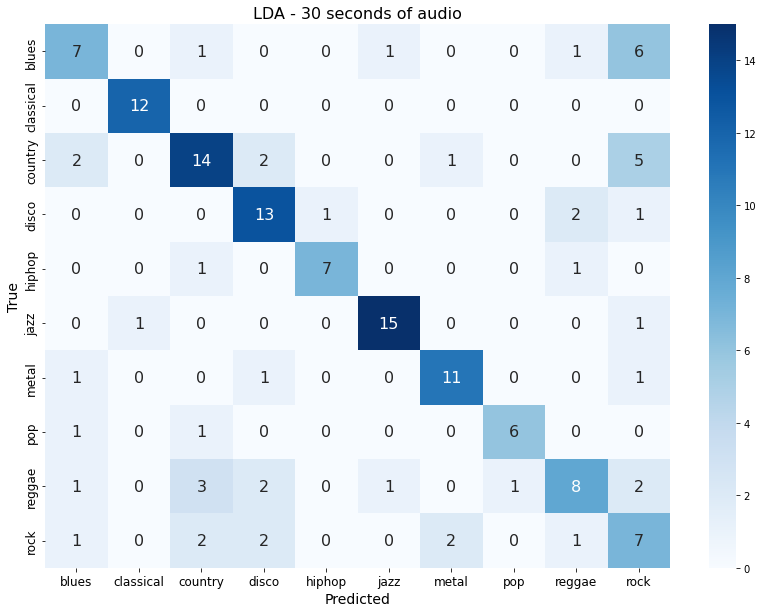

              precision    recall  f1-score   support

       blues       0.54      0.44      0.48        16
   classical       0.92      1.00      0.96        12
     country       0.64      0.58      0.61        24
       disco       0.65      0.76      0.70        17
      hiphop       0.88      0.78      0.82         9
        jazz       0.88      0.88      0.88        17
       metal       0.79      0.79      0.79        14
         pop       0.86      0.75      0.80         8
      reggae       0.62      0.44      0.52        18
        rock       0.30      0.47      0.37        15

    accuracy                           0.67       150
   macro avg       0.71      0.69      0.69       150
weighted avg       0.68      0.67      0.67       150

10-fold cross validation
Accuracy: 0.70 (+/- 0.11)


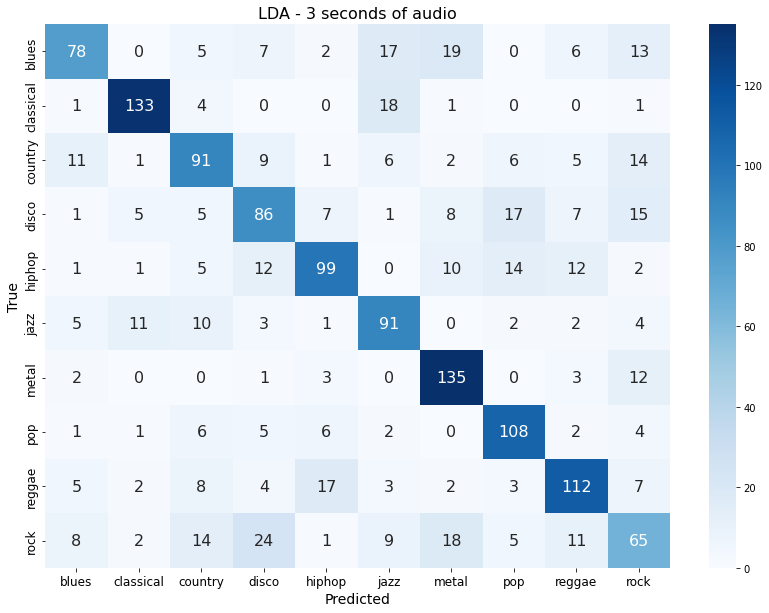

              precision    recall  f1-score   support

       blues       0.69      0.53      0.60       147
   classical       0.85      0.84      0.85       158
     country       0.61      0.62      0.62       146
       disco       0.57      0.57      0.57       152
      hiphop       0.72      0.63      0.68       156
        jazz       0.62      0.71      0.66       129
       metal       0.69      0.87      0.77       156
         pop       0.70      0.80      0.74       135
      reggae       0.70      0.69      0.69       163
        rock       0.47      0.41      0.44       157

    accuracy                           0.67      1499
   macro avg       0.66      0.67      0.66      1499
weighted avg       0.66      0.67      0.66      1499

10-fold cross validation
Accuracy: 0.66 (+/- 0.02)


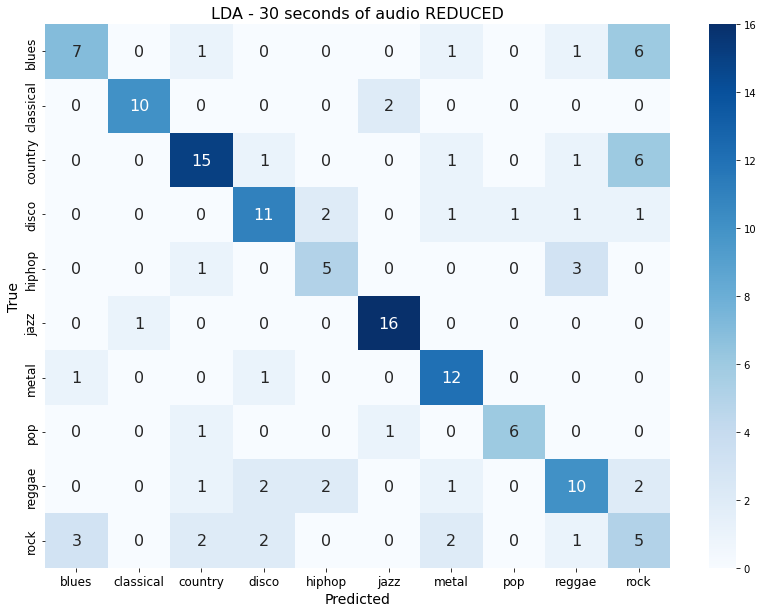

              precision    recall  f1-score   support

       blues       0.64      0.44      0.52        16
   classical       0.91      0.83      0.87        12
     country       0.71      0.62      0.67        24
       disco       0.65      0.65      0.65        17
      hiphop       0.56      0.56      0.56         9
        jazz       0.84      0.94      0.89        17
       metal       0.67      0.86      0.75        14
         pop       0.86      0.75      0.80         8
      reggae       0.59      0.56      0.57        18
        rock       0.25      0.33      0.29        15

    accuracy                           0.65       150
   macro avg       0.67      0.65      0.66       150
weighted avg       0.66      0.65      0.65       150

10-fold cross validation
Accuracy: 0.67 (+/- 0.11)


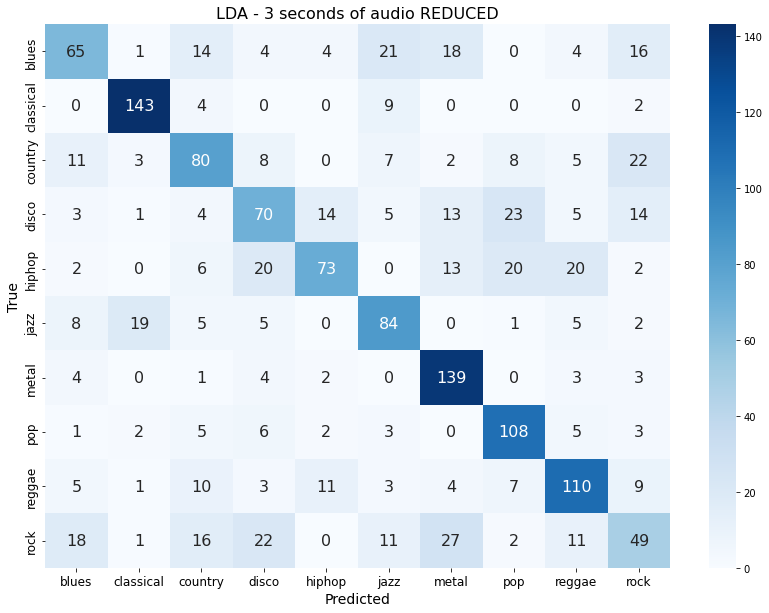

              precision    recall  f1-score   support

       blues       0.56      0.44      0.49       147
   classical       0.84      0.91      0.87       158
     country       0.55      0.55      0.55       146
       disco       0.49      0.46      0.48       152
      hiphop       0.69      0.47      0.56       156
        jazz       0.59      0.65      0.62       129
       metal       0.64      0.89      0.75       156
         pop       0.64      0.80      0.71       135
      reggae       0.65      0.67      0.66       163
        rock       0.40      0.31      0.35       157

    accuracy                           0.61      1499
   macro avg       0.61      0.62      0.60      1499
weighted avg       0.61      0.61      0.60      1499

10-fold cross validation
Accuracy: 0.61 (+/- 0.02)


In [32]:
lda(X_train1, y_train1, X_test1, y_test1, title='LDA - 30 seconds of audio')
lda(X_train2, y_train2, X_test2, y_test2, title='LDA - 3 seconds of audio')

lda(reduced_X_train1, reduced_y_train1, reduced_X_test1, reduced_y_test1, title='LDA - 30 seconds of audio REDUCED')
lda(reduced_X_train2, reduced_y_train2, reduced_X_test2, reduced_y_test2, title='LDA - 3 seconds of audio REDUCED')

### Osservazioni LDA
La Linear Distriminant Analysis (LDA) sfrutta tutte le feature e tutte le informazioni offerte dal dataset, a differenza del Gaussian Naive Bayes che non riesce a sfruttarle qualora ci sia correlazione tra di esse.

Applicare la PCA al dataset prima di utilizzare la LDA potrebbe non avere molto senso o addirittura risultare controproducente. Infatti possiamo osservare che nel nostro caso si ottiene un'accuracy peggiore.
Questo è dovuto al fatto che la LDA fa già una sua riduzione di dimensionalità del dataset per massimizzare la separazione tra classi, considerando le differenze tra le classi stesse. Applicare la PCA prima della LDA potrebbe comportare una riduzione eccessiva delle informazioni utili per la discriminazione tra classi, soprattutto se la LDA riesce già a catturare le differenze rilevanti.

## Logistic Regression

In [33]:
# logistic regression
from sklearn.linear_model import LogisticRegression

def logistic_regression(X_train, y_train, X_test, y_test, title: str = 'Logistic Regression', g: bool = True):
    # create the model
    model = LogisticRegression(max_iter=1000)

    # train the model
    model.fit(X_train, y_train)

    # make predictions
    y_pred = model.predict(X_test)

    # plot the confusion matrix
    plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

    # print the scores
    print_scores(y_test, y_pred)

    # k-fold cross validation
    k_fold_cross_validation(model, X_train, y_train)

    print("=========================================")

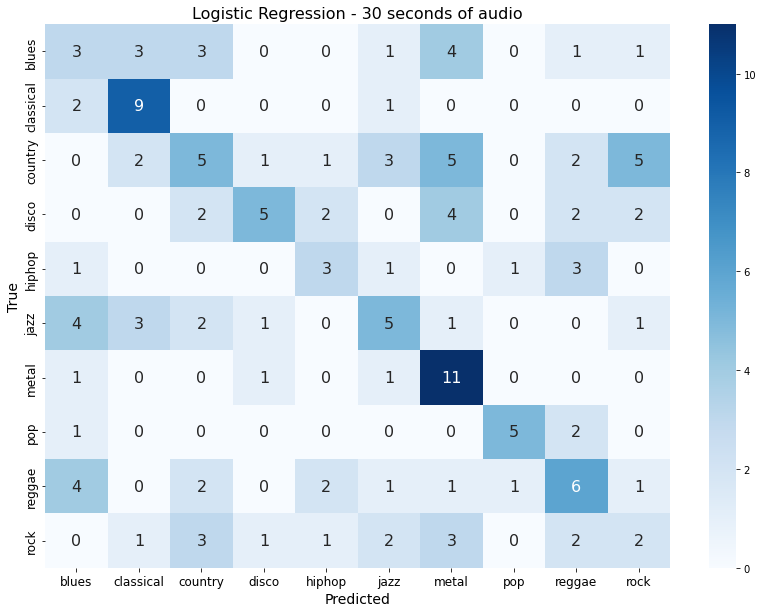

              precision    recall  f1-score   support

       blues       0.19      0.19      0.19        16
   classical       0.50      0.75      0.60        12
     country       0.29      0.21      0.24        24
       disco       0.56      0.29      0.38        17
      hiphop       0.33      0.33      0.33         9
        jazz       0.33      0.29      0.31        17
       metal       0.38      0.79      0.51        14
         pop       0.71      0.62      0.67         8
      reggae       0.33      0.33      0.33        18
        rock       0.17      0.13      0.15        15

    accuracy                           0.36       150
   macro avg       0.38      0.39      0.37       150
weighted avg       0.36      0.36      0.34       150

10-fold cross validation
Accuracy: 0.40 (+/- 0.10)


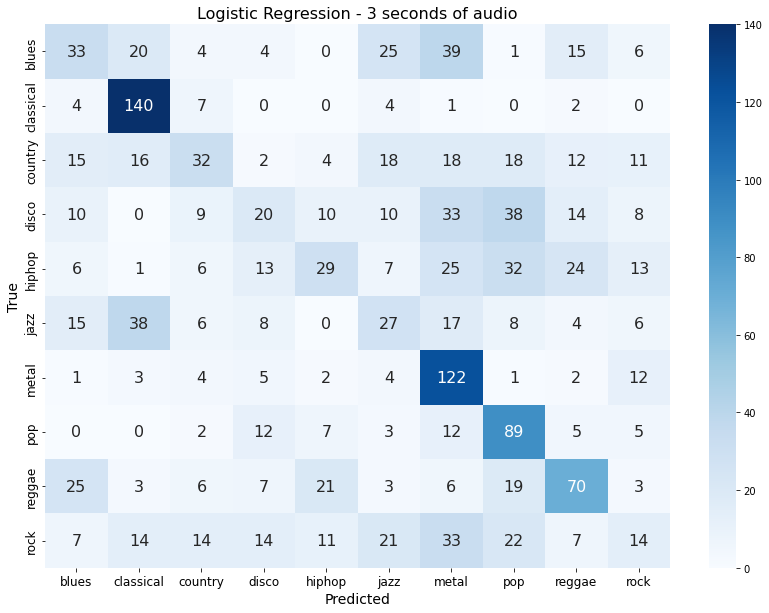

              precision    recall  f1-score   support

       blues       0.28      0.22      0.25       147
   classical       0.60      0.89      0.71       158
     country       0.36      0.22      0.27       146
       disco       0.24      0.13      0.17       152
      hiphop       0.35      0.19      0.24       156
        jazz       0.22      0.21      0.22       129
       metal       0.40      0.78      0.53       156
         pop       0.39      0.66      0.49       135
      reggae       0.45      0.43      0.44       163
        rock       0.18      0.09      0.12       157

    accuracy                           0.38      1499
   macro avg       0.35      0.38      0.34      1499
weighted avg       0.35      0.38      0.35      1499

10-fold cross validation
Accuracy: 0.39 (+/- 0.03)


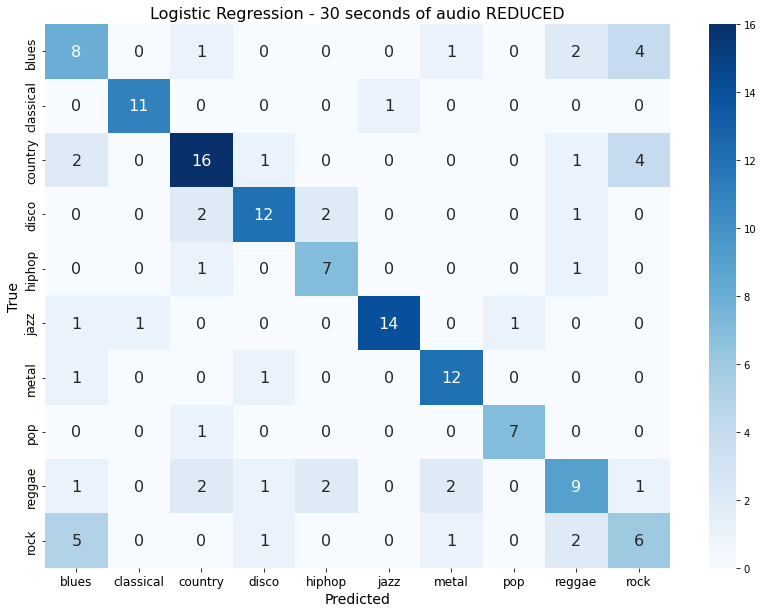

              precision    recall  f1-score   support

       blues       0.44      0.50      0.47        16
   classical       0.92      0.92      0.92        12
     country       0.70      0.67      0.68        24
       disco       0.75      0.71      0.73        17
      hiphop       0.64      0.78      0.70         9
        jazz       0.93      0.82      0.87        17
       metal       0.75      0.86      0.80        14
         pop       0.88      0.88      0.88         8
      reggae       0.56      0.50      0.53        18
        rock       0.40      0.40      0.40        15

    accuracy                           0.68       150
   macro avg       0.70      0.70      0.70       150
weighted avg       0.69      0.68      0.68       150

10-fold cross validation
Accuracy: 0.68 (+/- 0.10)


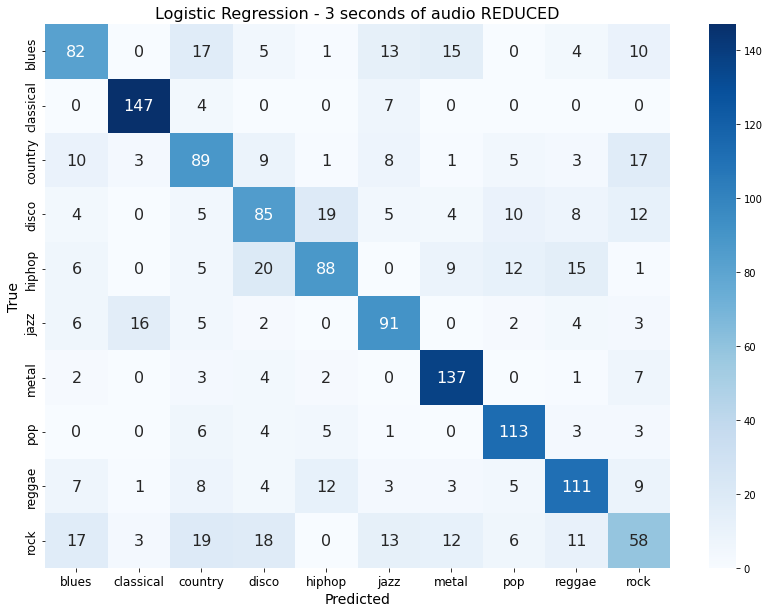

              precision    recall  f1-score   support

       blues       0.61      0.56      0.58       147
   classical       0.86      0.93      0.90       158
     country       0.55      0.61      0.58       146
       disco       0.56      0.56      0.56       152
      hiphop       0.69      0.56      0.62       156
        jazz       0.65      0.71      0.67       129
       metal       0.76      0.88      0.81       156
         pop       0.74      0.84      0.78       135
      reggae       0.69      0.68      0.69       163
        rock       0.48      0.37      0.42       157

    accuracy                           0.67      1499
   macro avg       0.66      0.67      0.66      1499
weighted avg       0.66      0.67      0.66      1499

10-fold cross validation
Accuracy: 0.67 (+/- 0.03)


In [34]:
logistic_regression(X_train1, y_train1, X_test1, y_test1, title='Logistic Regression - 30 seconds of audio')
logistic_regression(X_train2, y_train2, X_test2, y_test2, title='Logistic Regression - 3 seconds of audio')

logistic_regression(reduced_X_train1, reduced_y_train1, reduced_X_test1, reduced_y_test1, title='Logistic Regression - 30 seconds of audio REDUCED')
logistic_regression(reduced_X_train2, reduced_y_train2, reduced_X_test2, reduced_y_test2, title='Logistic Regression - 3 seconds of audio REDUCED')

### Osservazioni Logistic Regression
La Logistic Regression utilizza la funzione Sigmoid per la classificazione binaria. Come nel caso del GNB, non ha prestazioni buone se il dataset presenta feature altamente correlate, perché si ha difficoltà nell'identificazione delle feature rilevanti e quali quindi contribuiscono maggiormente alla predizione. 
Di nuovo, come nel GNB, abbiamo risultati migliori con il modello addestrato sul dataset ridotto con PCA, proprio perché va a ridurre le feature altamente correlate tra di esse.


### Feature Selection - Logistic Regression

### clustering
Raggruppa le caratteristiche simili in cluster e seleziona rappresentanti da ciascun cluster. La caratteristica con la massima varianza in quel cluster viene selezionata come rappresentativa. Questo può essere utile quando le caratteristiche sono altamente correlate.

In [35]:
import math
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

def select_features(df: pd.DataFrame, k: int):
    # Divide il dataset in set di addestramento e test
    train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

    # Standardizza le caratteristiche del set di addestramento
    scaler = StandardScaler()
    X_train_standardized = scaler.fit_transform(train_df.drop(columns=['label']))

    # Aggiungi la colonna 'label' al DataFrame standardizzato, se necessario
    train_df_standardized = pd.DataFrame(X_train_standardized, columns=train_df.columns[:-1])
    train_df_standardized['label'] = train_df['label']

    # Applica K-Means per formare cluster di caratteristiche
    num_clusters = k
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    train_df_standardized['cluster'] = kmeans.fit_predict(X_train_standardized)

    # Per ogni cluster, seleziona una caratteristica rappresentativa
    selected_features = []
    for cluster_id in range(num_clusters):
        cluster_subset = train_df_standardized[train_df_standardized['cluster'] == cluster_id].iloc[:, :-2]
        
        # Controlla se ci sono valori nan nel cluster_subset
        if not cluster_subset.isnull().values.all():  # Controlla se tutti i valori sono nan
            representative_feature = cluster_subset.var().idxmax()
            selected_features.append(representative_feature)

    selected_features = list(set(selected_features))
    selected_features = [feature for feature in selected_features if not (isinstance(feature, float) and math.isnan(feature))]
    selected_df = df.loc[:, selected_features + ['label']]

    return selected_df

In [69]:
df_30sec_selected = select_features(df_30sec, 56)
df_3sec_selected = select_features(df_3sec, 53)

In [43]:
train_30sec_selected, test_30sec_selected = split_dataset(df_30sec_selected, test_size=0.2, random_state=42)
train_3sec_selected, test_3sec_selected = split_dataset(df_3sec_selected, test_size=0.2, random_state=42)

X_train1_selected, y_train1_selected = train_30sec_selected.loc[:, train_30sec_selected.columns != 'label'], train_30sec_selected['label']
X_train2_selected, y_train2_selected = train_3sec_selected.loc[:, train_3sec_selected.columns != 'label'], train_3sec_selected['label']

X_test1_selected, y_test1_selected = test_30sec_selected.loc[:, test_30sec_selected.columns != 'label'], test_30sec_selected['label']
X_test2_selected, y_test2_selected = test_3sec_selected.loc[:, test_3sec_selected.columns != 'label'], test_3sec_selected['label']

In [37]:
from matplotlib.legend_handler import HandlerLine2D
from typing import Union

def learn_best_n_clusters(df: pd.DataFrame, k: Union[list, range, tuple, np.ndarray]):

    train_results = []
    test_results = []
    
    for i in k:
        df_selected = select_features(df, i)
        train_selected, test_selected = split_dataset(df_selected, test_size=0.2, random_state=42)
        X_train_selected, y_train_selected = train_selected.loc[:, train_selected.columns != 'label'], train_selected['label']
        X_test_selected, y_test_selected = test_selected.loc[:, test_selected.columns != 'label'], test_selected['label']
        model = LogisticRegression(max_iter=1000)

        # train the model
        model.fit(X_train_selected, y_train_selected)

        # compute the accuracy on the train set
        train_results.append(model.score(X_train_selected, y_train_selected))
        test_results.append(model.score(X_test_selected, y_test_selected))


    line1, = plt.plot(k, train_results, 'b', label='Train')
    plt.plot(k, test_results, 'r', label='Test')
    plt.title('Logistic regression')
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel('Accuracy')
    plt.xlabel('n_clusters')
    plt.show()

    # find the best max depth
    best_n_clusters = k[np.argmax(test_results)]
    print(f'Miglior numero di cluster: {best_n_clusters}')
    print(f'Best accuracy: {max(test_results)}')
    print(f'numero di features mantenute: {df_selected.shape[1]}')
    print(df_selected.columns)

    return best_n_clusters

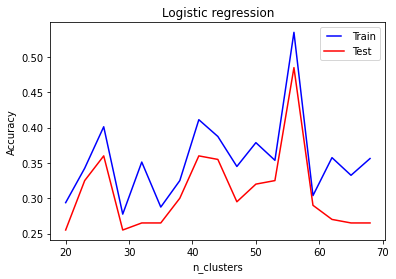

Miglior numero di cluster: 56
Best accuracy: 0.485
numero di features mantenute: 24
Index(['harmony_var', 'mfcc1_var', 'mfcc15_var', 'mfcc16_var', 'mfcc3_mean',
       'mfcc14_var', 'mfcc18_var', 'harmony_mean', 'mfcc20_var', 'mfcc10_var',
       'spectral_bandwidth_var', 'zero_crossing_rate_var', 'mfcc5_var',
       'mfcc3_var', 'mfcc18_mean', 'tempo', 'mfcc11_var', 'rolloff_var',
       'mfcc19_mean', 'perceptr_var', 'mfcc12_var', 'perceptr_mean', 'length',
       'label'],
      dtype='object')


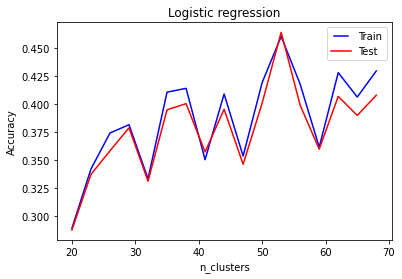

Miglior numero di cluster: 53
Best accuracy: 0.46396396396396394
numero di features mantenute: 30
Index(['harmony_var', 'mfcc1_var', 'mfcc15_var', 'mfcc16_var', 'mfcc3_mean',
       'mfcc7_var', 'chroma_stft_var', 'mfcc14_var', 'mfcc18_var',
       'harmony_mean', 'mfcc20_var', 'mfcc10_var', 'mfcc13_var', 'mfcc20_mean',
       'rms_var', 'mfcc8_var', 'zero_crossing_rate_var', 'mfcc5_var',
       'mfcc6_var', 'mfcc2_var', 'mfcc3_var', 'tempo', 'mfcc18_mean',
       'mfcc11_var', 'perceptr_var', 'mfcc4_var', 'mfcc19_var', 'mfcc12_var',
       'perceptr_mean', 'label'],
      dtype='object')


In [68]:
n_clusters = range(20, 70, 3)
c1 = learn_best_n_clusters(df_30sec, k = n_clusters)
c2 = learn_best_n_clusters(df_3sec, k = n_clusters)


## Decision Trees

In [78]:
# decision tree
from sklearn import tree

def decision_tree(
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        criterion: str = 'gini',
        max_depth: Optional[int] = None,
        splitter: str = 'best',
        title: str = 'Decision Tree',
        do_plot: bool = True,
        valuate: bool = True
    ):

    # create the model
    model = tree.DecisionTreeClassifier(
        criterion=criterion,
        max_depth=max_depth,
        splitter=splitter,
    )

    # train the model
    model.fit(X_train, y_train)

    # make predictions
    y_pred = model.predict(X_test)

    if do_plot:
        # plot the confusion matrix
        plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

    if valuate:
        # print the scores
        print_scores(y_test, y_pred)

        # k-fold cross validation
        # k_fold_cross_validation(model, X_train, y_train)

        print("=========================================")

### Gini Index

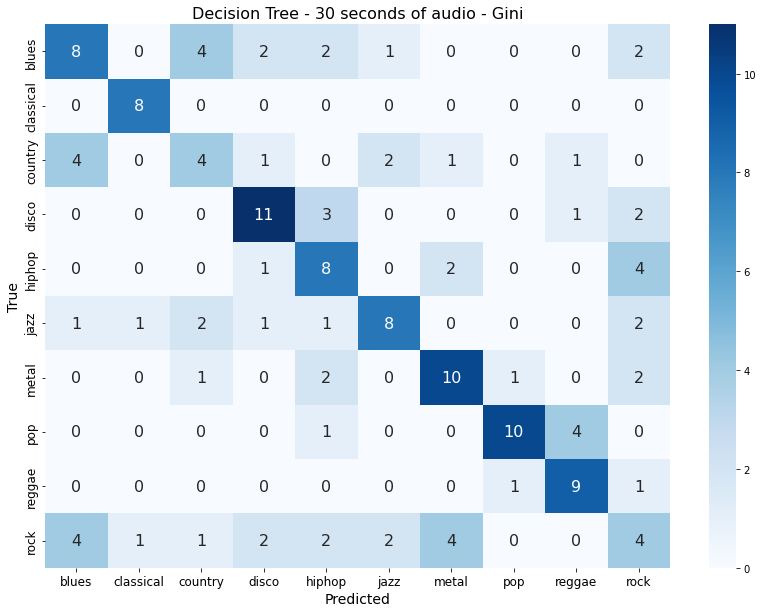

              precision    recall  f1-score   support

       blues       0.47      0.42      0.44        19
   classical       0.80      1.00      0.89         8
     country       0.33      0.31      0.32        13
       disco       0.61      0.65      0.63        17
      hiphop       0.42      0.53      0.47        15
        jazz       0.62      0.50      0.55        16
       metal       0.59      0.62      0.61        16
         pop       0.83      0.67      0.74        15
      reggae       0.60      0.82      0.69        11
        rock       0.24      0.20      0.22        20

    accuracy                           0.53       150
   macro avg       0.55      0.57      0.56       150
weighted avg       0.53      0.53      0.53       150



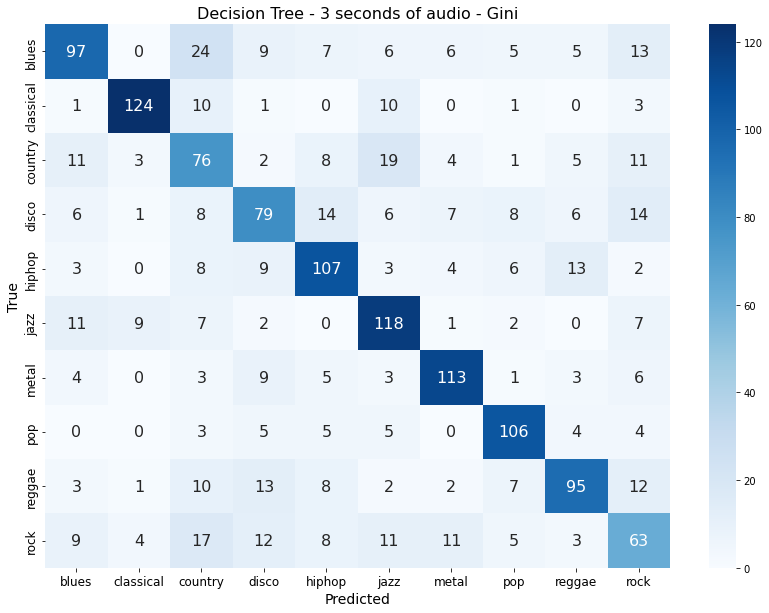

              precision    recall  f1-score   support

       blues       0.67      0.56      0.61       172
   classical       0.87      0.83      0.85       150
     country       0.46      0.54      0.50       140
       disco       0.56      0.53      0.54       149
      hiphop       0.66      0.69      0.68       155
        jazz       0.64      0.75      0.69       157
       metal       0.76      0.77      0.77       147
         pop       0.75      0.80      0.77       132
      reggae       0.71      0.62      0.66       153
        rock       0.47      0.44      0.45       143

    accuracy                           0.65      1498
   macro avg       0.66      0.65      0.65      1498
weighted avg       0.66      0.65      0.65      1498



In [79]:
decision_tree(X_train1, y_train1, X_val1, y_val1, title='Decision Tree - 30 seconds of audio - Gini')
decision_tree(X_train2, y_train2, X_val2, y_val2, title='Decision Tree - 3 seconds of audio - Gini')

### Entropy

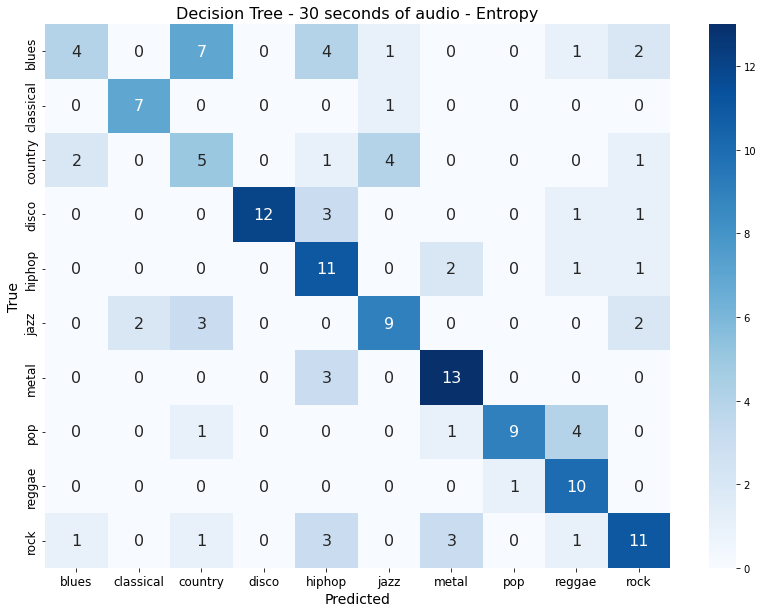

              precision    recall  f1-score   support

       blues       0.57      0.21      0.31        19
   classical       0.78      0.88      0.82         8
     country       0.29      0.38      0.33        13
       disco       1.00      0.71      0.83        17
      hiphop       0.44      0.73      0.55        15
        jazz       0.60      0.56      0.58        16
       metal       0.68      0.81      0.74        16
         pop       0.90      0.60      0.72        15
      reggae       0.56      0.91      0.69        11
        rock       0.61      0.55      0.58        20

    accuracy                           0.61       150
   macro avg       0.64      0.63      0.62       150
weighted avg       0.65      0.61      0.60       150



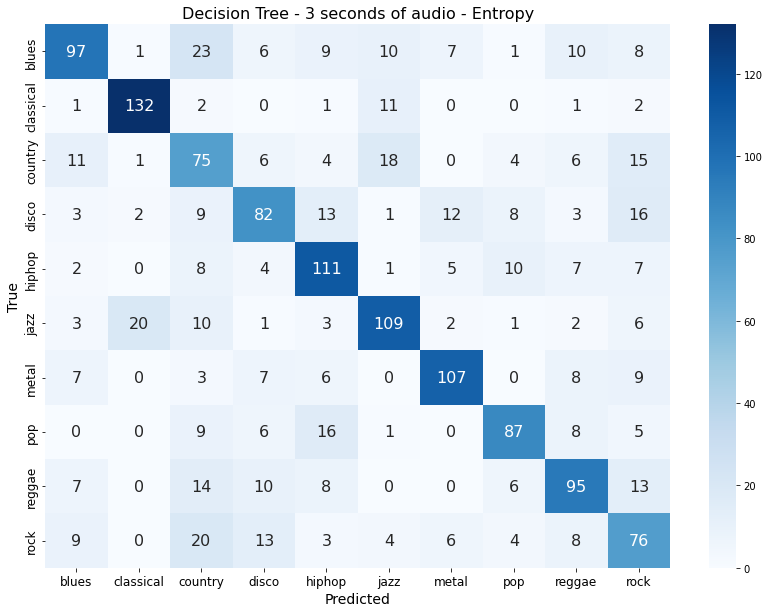

              precision    recall  f1-score   support

       blues       0.69      0.56      0.62       172
   classical       0.85      0.88      0.86       150
     country       0.43      0.54      0.48       140
       disco       0.61      0.55      0.58       149
      hiphop       0.64      0.72      0.67       155
        jazz       0.70      0.69      0.70       157
       metal       0.77      0.73      0.75       147
         pop       0.72      0.66      0.69       132
      reggae       0.64      0.62      0.63       153
        rock       0.48      0.53      0.51       143

    accuracy                           0.65      1498
   macro avg       0.65      0.65      0.65      1498
weighted avg       0.66      0.65      0.65      1498



In [80]:
decision_tree(X_train1, y_train1, X_val1, y_val1, title='Decision Tree - 30 seconds of audio - Entropy', criterion='entropy')
decision_tree(X_train2, y_train2, X_val2, y_val2, title='Decision Tree - 3 seconds of audio - Entropy', criterion='entropy')

### Learn best `max_depth`

In [66]:
from matplotlib.legend_handler import HandlerLine2D
from typing import Union

def learn_best_max_depth(
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        max_depth_range: Union[list, range, tuple, np.ndarray],
        criterion: str = 'gini',
        splitter: str = 'best',
        title: str = 'Decision Tree',
    ) -> int:
    """
    Learn the best max depth for the decision tree.
    :param X_train: Train features
    :param y_train: Train labels
    :param X_test: Test features
    :param y_test: Test labels
    :param title: Title of the plot
    :param criterion: Criterion
    :param splitter: Splitter
    :return:
    """

    # create lists of scores
    train_results = []
    test_results = []

    # for each max depth
    for max_depth in max_depth_range:

        # create the model
        model = tree.DecisionTreeClassifier(
            criterion=criterion,
            splitter=splitter,
            max_depth=max_depth
        )

        # train the model
        model.fit(X_train, y_train)

        # compute the accuracy on the train set
        train_results.append(model.score(X_train, y_train))
        test_results.append(model.score(X_test, y_test))


    line1, = plt.plot(max_depth_range, train_results, 'b', label='Train')
    plt.plot(max_depth_range, test_results, 'r', label='Test')
    plt.title(title)
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel('Accuracy')
    plt.xlabel('Tree depth')
    plt.show()

    # find the best max depth
    best_max_depth = max_depth_range[np.argmax(test_results)]
    print(f'Best max depth: {best_max_depth}')
    print(f'Best accuracy: {max(test_results)}')

    return best_max_depth

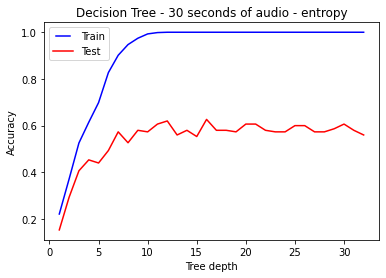

Best max depth: 16
Best accuracy: 0.6266666666666667


In [83]:
max_depths = np.linspace(1, 32, 32, endpoint=True).astype(int)

max_depth_30sec = learn_best_max_depth(
    X_train1, y_train1,
    X_val1, y_val1,
    max_depths,
    criterion='entropy',
    title='Decision Tree - 30 seconds of audio - entropy',
)

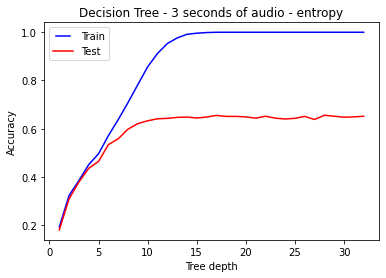

Best max depth: 28
Best accuracy: 0.6555407209612817


In [84]:
max_depth_3sec = learn_best_max_depth(
    X_train2, y_train2,
    X_val2, y_val2,
    max_depths,
    criterion='entropy',
    title='Decision Tree - 3 seconds of audio - entropy',
)

### Learn best `min_samples_split`
`min_samples_split` definisce il numero minimo di elementi per regione. Con min_samples_split impostato al 10%, l'albero avrà la massima flessibilità e sarà più incline a creare suddivisioni anche con un numero molto piccolo di campioni in un nodo. Con min_samples_split impostato al 100%, l'albero sarà molto più restrittivo e richiederà che tutti i campioni in un nodo siano uguali o che il nodo non sia suddiviso ulteriormente. Ciò porterà a un albero molto più piccolo e semplice.

In [70]:
def learn_best_min_samples_split(
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        min_samples_split_range: Union[list, range, tuple, np.ndarray],
        criterion: str = 'gini',
        max_depth: Optional[int] = None,
        splitter: str = 'best',
        title: str = 'Decision Tree',
    ) -> float:
    """
    Learn the best min samples split for the decision tree.
    :param X_train: Train features
    :param y_train: Train labels
    :param X_test: Test features
    :param y_test: Test labels
    :param title: Title of the plot
    :param criterion: Criterion
    :param splitter: Splitter
    :return:
    """

    # create lists of scores
    train_results = []
    test_results = []

    # for each min samples split
    for min_samples_split in min_samples_split_range:

        model = tree.DecisionTreeClassifier(
            criterion=criterion,
            splitter=splitter,
            max_depth=max_depth,
            min_samples_split=min_samples_split
        )

        # train the model
        model.fit(X_train, y_train)

        # compute the accuracy on the train set
        train_results.append(model.score(X_train, y_train))
        test_results.append(model.score(X_test, y_test))

    # plot the results
    line1, = plt.plot(min_samples_split_range, train_results, 'b', label='Train')
    plt.plot(min_samples_split_range, test_results, 'r', label='Test')
    plt.title(title)
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel('Accuracy')
    plt.xlabel('Min samples split')
    plt.show()

    # find the best min samples split
    best_min_samples_split = min_samples_split_range[np.argmax(test_results)]
    print(f'Best min samples split: {best_min_samples_split}')
    print(f'Best accuracy: {max(test_results)}')

    return best_min_samples_split

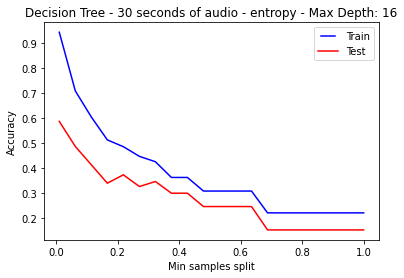

Best min samples split: 0.01
Best accuracy: 0.5866666666666667


In [85]:
min_samples_splits = np.linspace(0.01, 1.0, 20, endpoint=True)

min_samples_split_30sec = learn_best_min_samples_split(
    X_train1, y_train1,
    X_val1, y_val1,
    min_samples_splits,
    criterion='entropy',
    max_depth=max_depth_30sec,
    title=f'Decision Tree - 30 seconds of audio - entropy - Max Depth: {max_depth_30sec}',
)

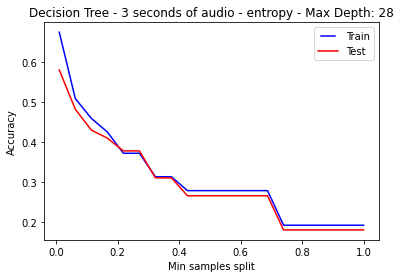

Best min samples split: 0.01
Best accuracy: 0.5807743658210948


In [86]:
min_samples_split_3sec = learn_best_min_samples_split(
    X_train2, y_train2,
    X_val2, y_val2,
    min_samples_splits,
    criterion='entropy',
    max_depth=max_depth_3sec,
    title=f'Decision Tree - 3 seconds of audio - entropy - Max Depth: {max_depth_3sec}',
)

Possiamo chiaramente vedere che quando consideriamo il 100% dei campioni in ciascun nodo, il modello non riesce ad apprendere abbastanza dai dati.

> osservare che questo parametro è appreso ponendo `max_depth` pari a quello imparato precedentemente.

## Best hypermarameters test - Decision Tree

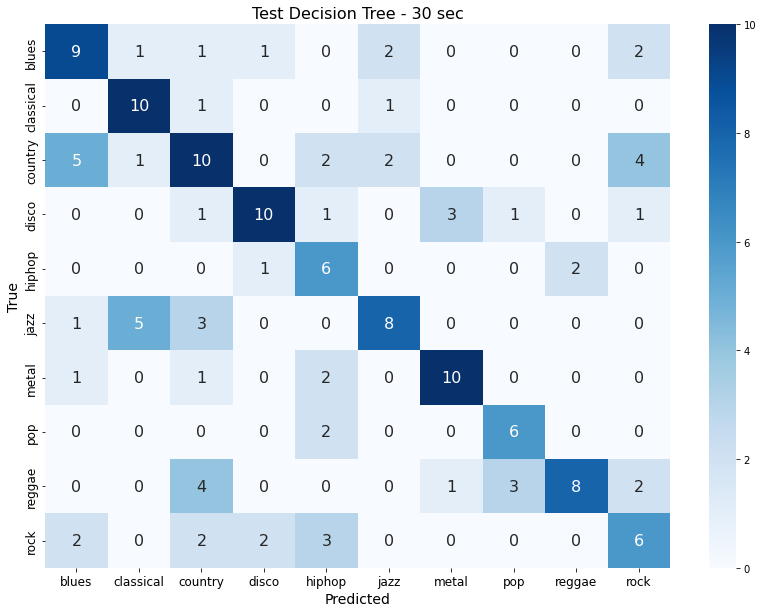

              precision    recall  f1-score   support

       blues       0.50      0.56      0.53        16
   classical       0.59      0.83      0.69        12
     country       0.43      0.42      0.43        24
       disco       0.71      0.59      0.65        17
      hiphop       0.38      0.67      0.48         9
        jazz       0.62      0.47      0.53        17
       metal       0.71      0.71      0.71        14
         pop       0.60      0.75      0.67         8
      reggae       0.80      0.44      0.57        18
        rock       0.40      0.40      0.40        15

    accuracy                           0.55       150
   macro avg       0.57      0.58      0.57       150
weighted avg       0.58      0.55      0.55       150



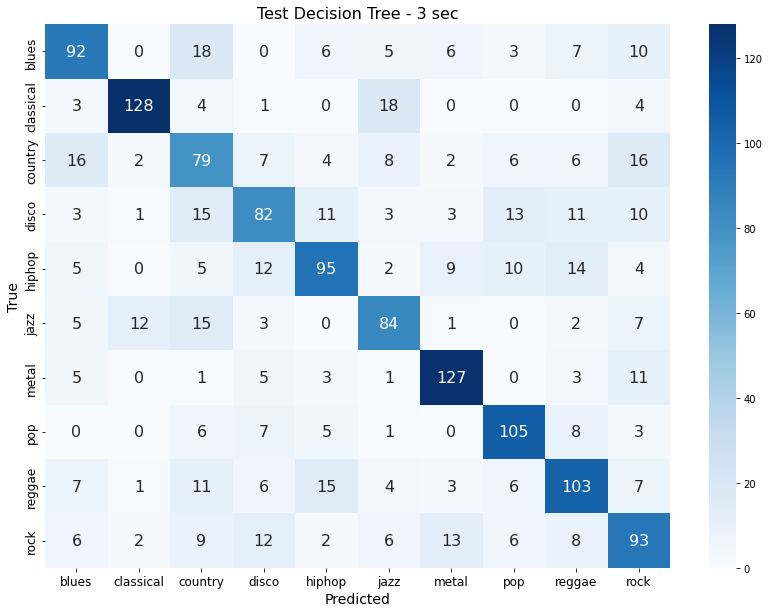

              precision    recall  f1-score   support

       blues       0.65      0.63      0.64       147
   classical       0.88      0.81      0.84       158
     country       0.48      0.54      0.51       146
       disco       0.61      0.54      0.57       152
      hiphop       0.67      0.61      0.64       156
        jazz       0.64      0.65      0.64       129
       metal       0.77      0.81      0.79       156
         pop       0.70      0.78      0.74       135
      reggae       0.64      0.63      0.63       163
        rock       0.56      0.59      0.58       157

    accuracy                           0.66      1499
   macro avg       0.66      0.66      0.66      1499
weighted avg       0.66      0.66      0.66      1499



In [87]:
decision_tree(X_train1, y_train1, X_test1, y_test1, criterion = 'entropy', max_depth = max_depth_30sec, title = 'Test Decision Tree - 30 sec')
decision_tree(X_train2, y_train2, X_test2, y_test2, criterion = 'entropy', max_depth = max_depth_3sec, title = 'Test Decision Tree - 3 sec')

In [76]:
param_grid = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': np.linspace(1, 32, 32, endpoint=True).astype(int),
    'min_samples_split': np.linspace(0.01, 1.0, 20, endpoint=True),
    #'min_samples_leaf': [1, 2, 4]
}

model = tree.DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = model, param_grid=param_grid, cv=5)

grid_search.fit(X_train1, y_train1)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(X_test1, y_test1)

print(f'Migliori parametri (Test - 30 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (Test - 30 sec): {accuracy}')

print("=========================================")

Migliori parametri (Test - 30 sec): {'criterion': 'gini', 'max_depth': 14, 'min_samples_split': 0.01}
Accuracy del modello ottimizzato (Test - 30 sec): 0.5533333333333333


In [77]:
param_grid = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': np.linspace(1, 32, 32, endpoint=True).astype(int),
    'min_samples_split': np.linspace(0.01, 1.0, 20, endpoint=True),
    #'min_samples_leaf': [1, 2, 4]
}

model = tree.DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = model, param_grid=param_grid, cv=5)

grid_search.fit(X_train2, y_train2)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(X_test2, y_test2)

print(f'Migliori parametri (Test - 3 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (Test - 3 sec): {accuracy}')

print("=========================================")

Migliori parametri (Test - 3 sec): {'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 0.01}
Accuracy del modello ottimizzato (Test - 3 sec): 0.5663775850567044


### Osservazioni decision tree

Gli alberi decisionali possono gestire features altamente correlate poiché, durante la costruzione dell'albero, possono scegliere la feature che fornisce la suddivisione più informativa a ogni nodo. In altre parole, l'algoritmo può selezionare automaticamente la feature che contribuisce maggiormente alla separazione delle classi.

## Random Forest

In [97]:
from sklearn.ensemble import RandomForestClassifier

def random_forest(X_train, y_train, X_test, y_test, title: str = 'Random Forest', n_estimators: int = 100):
    # create the model
    model = RandomForestClassifier(n_estimators=n_estimators)

    # train the model
    model.fit(X_train, y_train)

    # make predictions
    y_pred = model.predict(X_test)

    # plot the confusion matrix
    plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

    # print the scores
    print_scores(y_test, y_pred)

    # k-fold cross validation
    # k_fold_cross_validation(model, X_train, y_train)

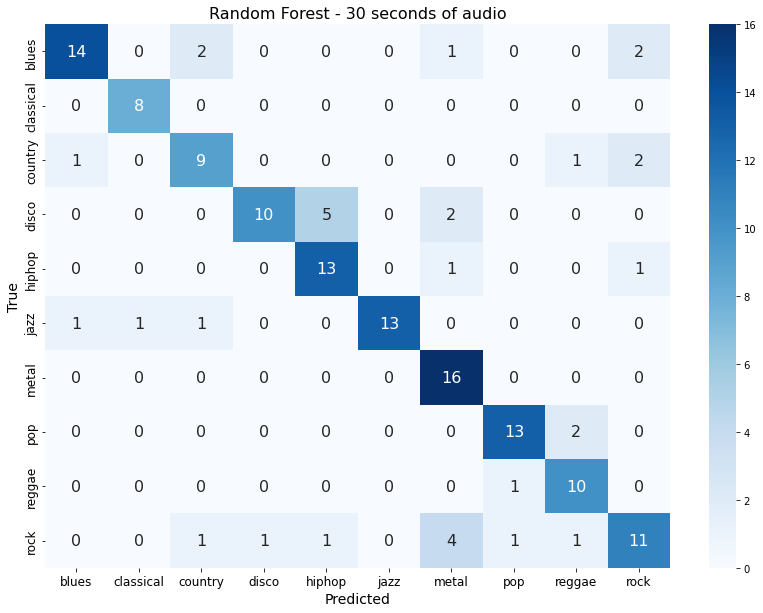

              precision    recall  f1-score   support

       blues       0.88      0.74      0.80        19
   classical       0.89      1.00      0.94         8
     country       0.69      0.69      0.69        13
       disco       0.91      0.59      0.71        17
      hiphop       0.68      0.87      0.76        15
        jazz       1.00      0.81      0.90        16
       metal       0.67      1.00      0.80        16
         pop       0.87      0.87      0.87        15
      reggae       0.71      0.91      0.80        11
        rock       0.69      0.55      0.61        20

    accuracy                           0.78       150
   macro avg       0.80      0.80      0.79       150
weighted avg       0.80      0.78      0.78       150



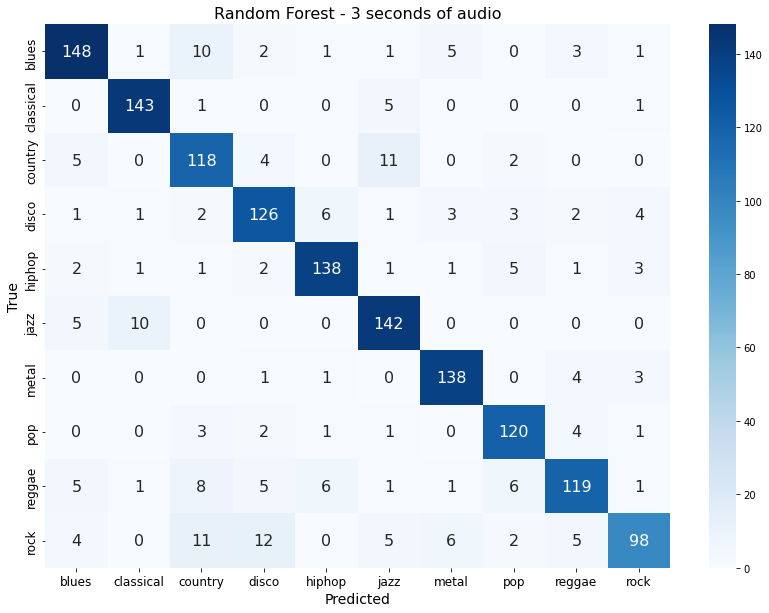

              precision    recall  f1-score   support

       blues       0.87      0.86      0.87       172
   classical       0.91      0.95      0.93       150
     country       0.77      0.84      0.80       140
       disco       0.82      0.85      0.83       149
      hiphop       0.90      0.89      0.90       155
        jazz       0.85      0.90      0.87       157
       metal       0.90      0.94      0.92       147
         pop       0.87      0.91      0.89       132
      reggae       0.86      0.78      0.82       153
        rock       0.88      0.69      0.77       143

    accuracy                           0.86      1498
   macro avg       0.86      0.86      0.86      1498
weighted avg       0.86      0.86      0.86      1498



In [98]:
random_forest(X_train1, y_train1, X_val1, y_val1, title='Random Forest - 30 seconds of audio')
random_forest(X_train2, y_train2, X_val2, y_val2, title='Random Forest - 3 seconds of audio')

### Learn best `n_estimators`

In [99]:
def learn_best_n_estimator(
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        n_estimators_range: Union[list,range,tuple,np.ndarray],
        # criterion: str = 'gini',
        # max_depth: int | None = None,
        splitter: str = 'best',
        title: str = 'Decision Tree',
    ) -> int:

    # create lists of scores
    train_results = []
    test_results = []

    # for each n estimator
    for n_estimator in n_estimators_range:

        model = RandomForestClassifier(
            n_estimators=n_estimator
        )

        # train the model
        model.fit(X_train, y_train)

        # compute the accuracy on the train set
        train_results.append(model.score(X_train, y_train))
        test_results.append(model.score(X_test, y_test))

    # plot the results
    line1, = plt.plot(n_estimators_range, train_results, 'b', label='Train')
    plt.plot(n_estimators_range, test_results, 'r', label='Test')
    plt.title(title)
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel('Accuracy')
    plt.xlabel('N Estimators')
    plt.show()

    # find the best n estimator
    best_n_estimator = n_estimators_range[np.argmax(test_results)]
    print(f'Best n estimator: {best_n_estimator}')
    print(f'Best accuracy: {max(test_results)}')

    return best_n_estimator

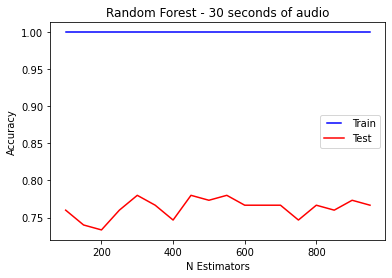

Best n estimator: 300
Best accuracy: 0.78


In [100]:
n_estimators = range(100, 1000, 50)

n_estimator_30sec = learn_best_n_estimator(
    X_train1, y_train1,
    X_val1, y_val1,
    n_estimators,
    title=f'Random Forest - 30 seconds of audio',
)

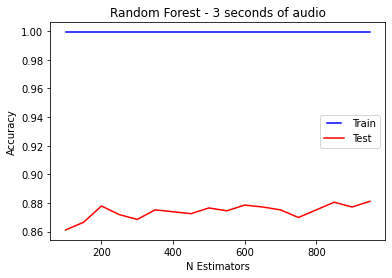

Best n estimator: 950
Best accuracy: 0.8811748998664887


In [101]:
best_n_estimator_3sec = learn_best_n_estimator(
    X_train2, y_train2,
    X_val2, y_val2,
    n_estimators,
    title=f'Random Forest - 3 seconds of audio',
)

## Best n_estimators test - Random Forest

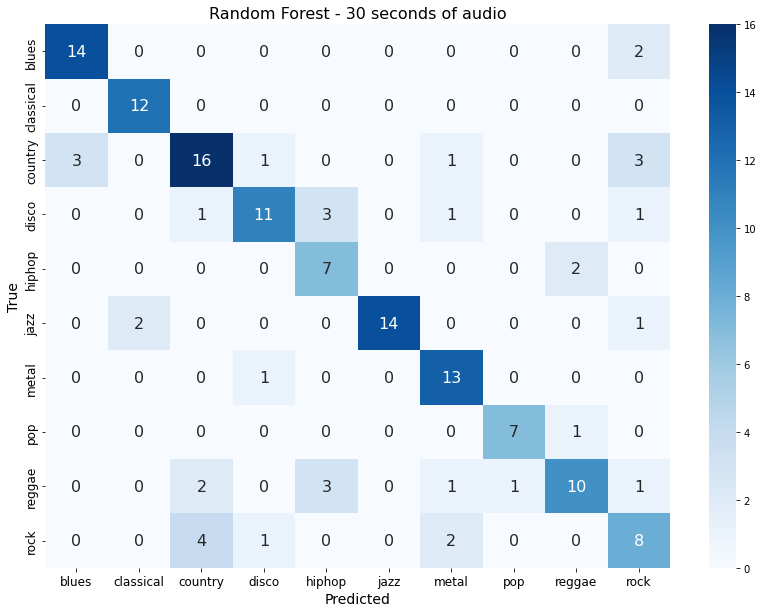

              precision    recall  f1-score   support

       blues       0.82      0.88      0.85        16
   classical       0.86      1.00      0.92        12
     country       0.70      0.67      0.68        24
       disco       0.79      0.65      0.71        17
      hiphop       0.54      0.78      0.64         9
        jazz       1.00      0.82      0.90        17
       metal       0.72      0.93      0.81        14
         pop       0.88      0.88      0.88         8
      reggae       0.77      0.56      0.65        18
        rock       0.50      0.53      0.52        15

    accuracy                           0.75       150
   macro avg       0.76      0.77      0.76       150
weighted avg       0.76      0.75      0.75       150



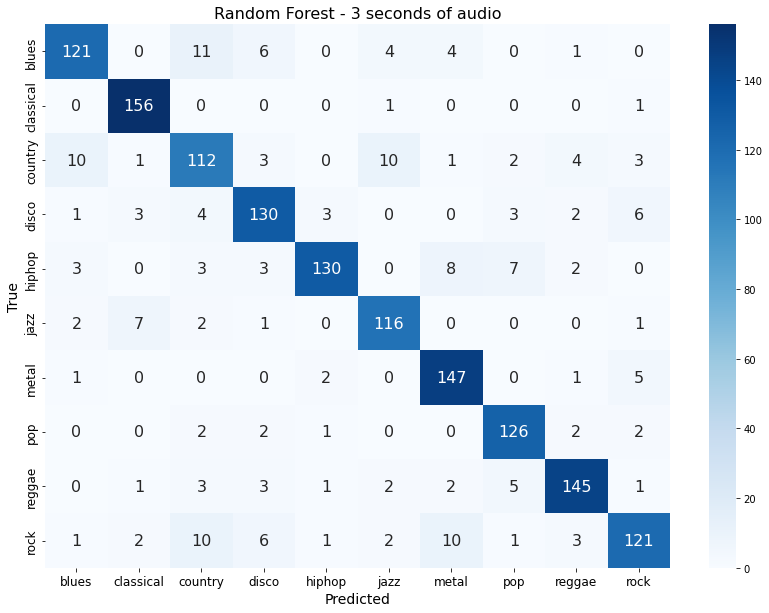

              precision    recall  f1-score   support

       blues       0.87      0.82      0.85       147
   classical       0.92      0.99      0.95       158
     country       0.76      0.77      0.76       146
       disco       0.84      0.86      0.85       152
      hiphop       0.94      0.83      0.88       156
        jazz       0.86      0.90      0.88       129
       metal       0.85      0.94      0.90       156
         pop       0.88      0.93      0.90       135
      reggae       0.91      0.89      0.90       163
        rock       0.86      0.77      0.81       157

    accuracy                           0.87      1499
   macro avg       0.87      0.87      0.87      1499
weighted avg       0.87      0.87      0.87      1499



In [102]:
random_forest(X_train1, y_train1, X_test1, y_test1, title='Random Forest - 30 seconds of audio', n_estimators = n_estimator_30sec)
random_forest(X_train2, y_train2, X_test2, y_test2, title='Random Forest - 3 seconds of audio', n_estimators = best_n_estimator_3sec)

### Osservazioni decision tree

Gli alberi decisionali possono gestire features altamente correlate poiché, durante la costruzione dell'albero, possono scegliere la feature che fornisce la suddivisione più informativa a ogni nodo. In altre parole, l'algoritmo può selezionare automaticamente la feature che contribuisce maggiormente alla separazione delle classi.

## Adaboost

In [34]:
from sklearn.ensemble import AdaBoostClassifier

def adaboost(X_train, y_train, X_test, y_test, title: str = 'Adaboost', n_estimators=100):

    # create the model
    model = AdaBoostClassifier(n_estimators=n_estimators)

    # train the model
    model.fit(X_train, y_train)

    # make predictions
    y_pred = model.predict(X_test)

    # plot the confusion matrix
    plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

    # print the scores
    print_scores(y_test, y_pred)

    # k-fold cross validation
    #k_fold_cross_validation(model, X_train, y_train)


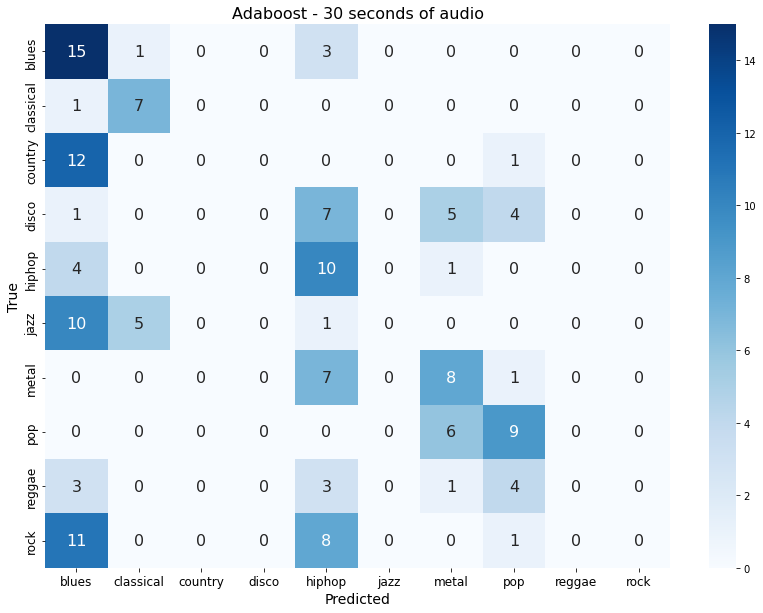

              precision    recall  f1-score   support

       blues       0.26      0.79      0.39        19
   classical       0.54      0.88      0.67         8
     country       0.00      0.00      0.00        13
       disco       0.00      0.00      0.00        17
      hiphop       0.26      0.67      0.37        15
        jazz       0.00      0.00      0.00        16
       metal       0.38      0.50      0.43        16
         pop       0.45      0.60      0.51        15
      reggae       0.00      0.00      0.00        11
        rock       0.00      0.00      0.00        20

    accuracy                           0.33       150
   macro avg       0.19      0.34      0.24       150
weighted avg       0.17      0.33      0.22       150



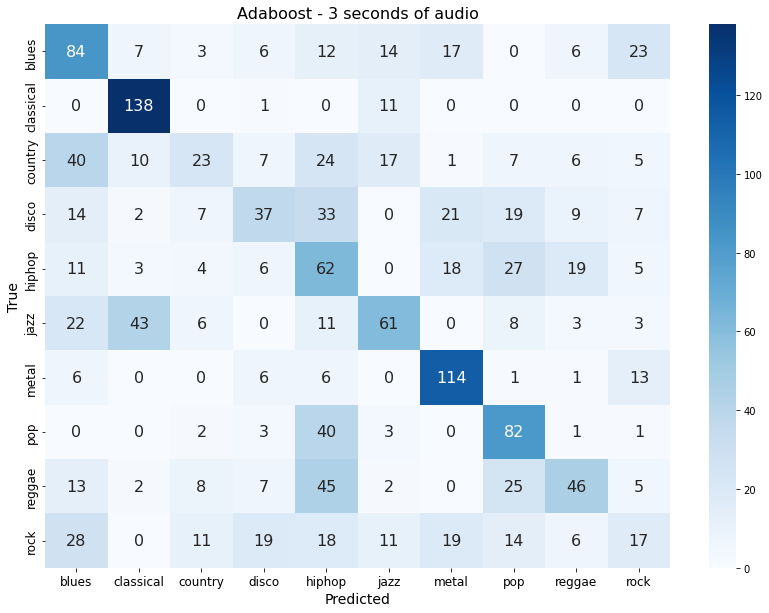

              precision    recall  f1-score   support

       blues       0.39      0.49      0.43       172
   classical       0.67      0.92      0.78       150
     country       0.36      0.16      0.23       140
       disco       0.40      0.25      0.31       149
      hiphop       0.25      0.40      0.31       155
        jazz       0.51      0.39      0.44       157
       metal       0.60      0.78      0.68       147
         pop       0.45      0.62      0.52       132
      reggae       0.47      0.30      0.37       153
        rock       0.22      0.12      0.15       143

    accuracy                           0.44      1498
   macro avg       0.43      0.44      0.42      1498
weighted avg       0.43      0.44      0.42      1498



In [75]:
adaboost(X_train1, y_train1, X_val1, y_val1, title='Adaboost - 30 seconds of audio')
adaboost(X_train2, y_train2, X_val2, y_val2, title='Adaboost - 3 seconds of audio')

In [35]:
def learn_best_n_estimator_adaboost(
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        n_estimators_range: Union[list,range,tuple,np.ndarray],
        title: str = 'Adaboost',
    ) -> int:

    # create lists of scores
    train_results = []
    test_results = []

    # for each n estimator
    for n_estimator in n_estimators_range:

        model = AdaBoostClassifier(
            n_estimators=n_estimator
        )

        # train the model
        model.fit(X_train, y_train)

        # compute the accuracy on the train set
        train_results.append(model.score(X_train, y_train))
        test_results.append(model.score(X_test, y_test))

    # plot the results
    #line1, = plt.plot(n_estimators_range, train_results, 'b', label='Train')
    line1, = plt.plot(n_estimators_range, test_results, 'r', label='Test')
    plt.title(title)
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel('Accuracy')
    plt.xlabel('N Estimators')
    plt.show()

    # find the best n estimator
    best_n_estimator = n_estimators_range[np.argmax(test_results)]
    print(f'Best n estimator: {best_n_estimator}')
    print(f'Best accuracy: {max(test_results)}')

    return best_n_estimator

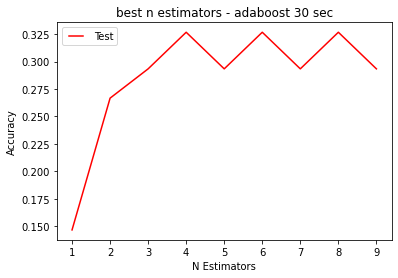

Best n estimator: 4
Best accuracy: 0.32666666666666666


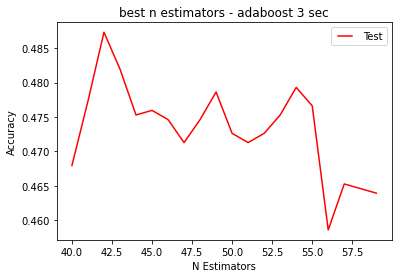

Best n estimator: 42
Best accuracy: 0.48731642189586116


In [38]:
n_estimators = range(1, 10, 1)
n_estimators1 = range(40, 60, 1)


n_estimator_adaboost1 = learn_best_n_estimator_adaboost(X_train1, y_train1, X_val1, y_val1, n_estimators, title='best n estimators - adaboost 30 sec')
n_estimator_adaboost2 = learn_best_n_estimator_adaboost(X_train2, y_train2, X_val2, y_val2, n_estimators1, title='best n estimators - adaboost 3 sec')

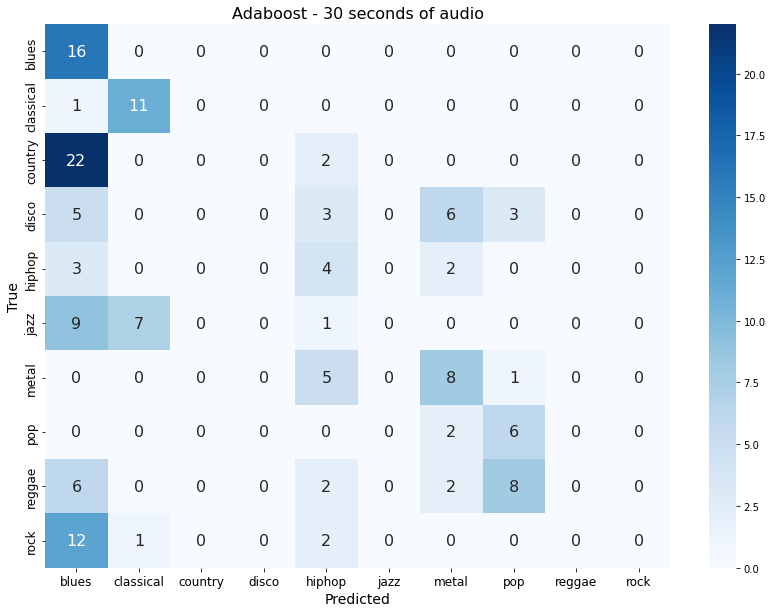

              precision    recall  f1-score   support

       blues       0.22      1.00      0.36        16
   classical       0.58      0.92      0.71        12
     country       0.00      0.00      0.00        24
       disco       0.00      0.00      0.00        17
      hiphop       0.21      0.44      0.29         9
        jazz       0.00      0.00      0.00        17
       metal       0.40      0.57      0.47        14
         pop       0.33      0.75      0.46         8
      reggae       0.00      0.00      0.00        18
        rock       0.00      0.00      0.00        15

    accuracy                           0.30       150
   macro avg       0.17      0.37      0.23       150
weighted avg       0.14      0.30      0.18       150



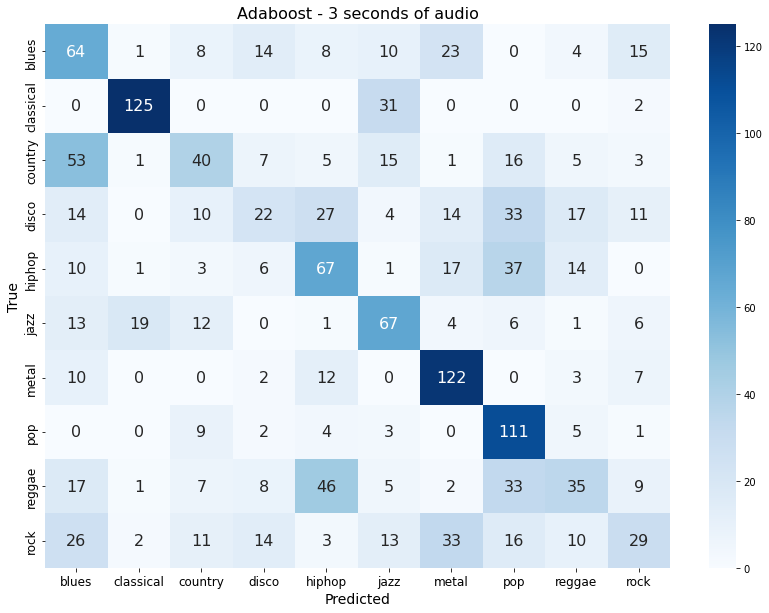

              precision    recall  f1-score   support

       blues       0.31      0.44      0.36       147
   classical       0.83      0.79      0.81       158
     country       0.40      0.27      0.33       146
       disco       0.29      0.14      0.19       152
      hiphop       0.39      0.43      0.41       156
        jazz       0.45      0.52      0.48       129
       metal       0.56      0.78      0.66       156
         pop       0.44      0.82      0.57       135
      reggae       0.37      0.21      0.27       163
        rock       0.35      0.18      0.24       157

    accuracy                           0.45      1499
   macro avg       0.44      0.46      0.43      1499
weighted avg       0.44      0.45      0.43      1499



In [92]:
adaboost(X_train1, y_train1, X_test1, y_test1, title='Adaboost - 30 seconds of audio', n_estimators=4)
adaboost(X_train2, y_train2, X_test2, y_test2, title='Adaboost - 3 seconds of audio',n_estimators=42)

### Osservazioni Adaboost

AdaBoost può essere sensibile agli outlier dei dati. Gli outlier sono punti dati che si discostano significativamente dagli altri punti nel dataset. Questa deviazione può essere causata da errori di misurazione o da eccezioni nel fenomeno che si sta cercando di modellare.

Questo perché l'algoritmo di Adaboost dà più peso ai punti difficili da classificare durante l'addestramento di ciascun stimatore debole. Gli stimatori deboli successivi cercano di correggere gli errori degli stimatori precedenti, e se ci sono outlier (e quindi eccezioni), possono influenzare negativamente il processo di correzione.

Se ci sono outlier nelle features altamente correlate, potrebbero influenzare negativamente la capacità di Adaboost di costruire modelli robusti.

## K-Nearest Neighbors

In [30]:
from sklearn.neighbors import KNeighborsClassifier

def knn(
        X_train, y_train, X_test, y_test,
        title: str = 'KNN',
        valuate: bool = True,
        n_neighbors: int = 3,
        weights: str = 'uniform',
        metric: str = 'minkowski'
    ):

    # create the model
    model = KNeighborsClassifier(n_neighbors=n_neighbors, weights=weights, metric=metric)

    # train the model
    model.fit(X_train, y_train)

    if valuate:
        # make predictions
        y_pred = model.predict(X_test.values)

        # plot the confusion matrix
        plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

        # print the scores
        print_scores(y_test, y_pred)

        # k-fold cross validation
        #k_fold_cross_validation(model, X_train, y_train)

    return model

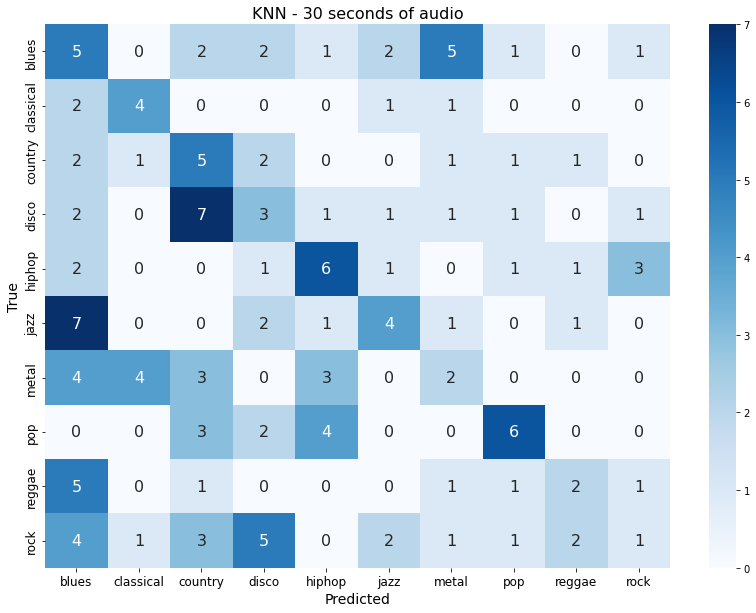

              precision    recall  f1-score   support

       blues       0.15      0.26      0.19        19
   classical       0.40      0.50      0.44         8
     country       0.21      0.38      0.27        13
       disco       0.18      0.18      0.18        17
      hiphop       0.38      0.40      0.39        15
        jazz       0.36      0.25      0.30        16
       metal       0.15      0.12      0.14        16
         pop       0.50      0.40      0.44        15
      reggae       0.29      0.18      0.22        11
        rock       0.14      0.05      0.07        20

    accuracy                           0.25       150
   macro avg       0.28      0.27      0.26       150
weighted avg       0.26      0.25      0.25       150

10-fold cross validation
Accuracy: 0.25 (+/- 0.11)


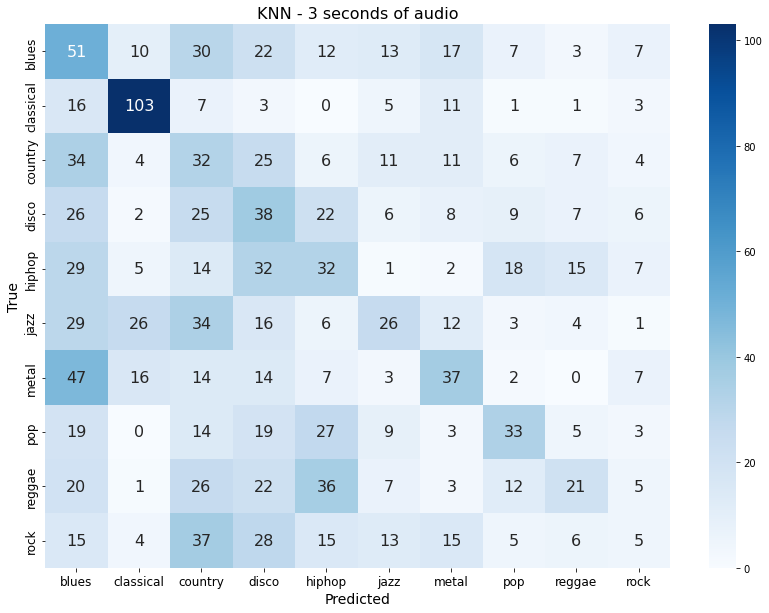

              precision    recall  f1-score   support

       blues       0.18      0.30      0.22       172
   classical       0.60      0.69      0.64       150
     country       0.14      0.23      0.17       140
       disco       0.17      0.26      0.21       149
      hiphop       0.20      0.21      0.20       155
        jazz       0.28      0.17      0.21       157
       metal       0.31      0.25      0.28       147
         pop       0.34      0.25      0.29       132
      reggae       0.30      0.14      0.19       153
        rock       0.10      0.03      0.05       143

    accuracy                           0.25      1498
   macro avg       0.26      0.25      0.25      1498
weighted avg       0.26      0.25      0.25      1498

10-fold cross validation
Accuracy: 0.25 (+/- 0.02)


In [109]:
knn(X_train1, y_train1, X_val1, y_val1, title='KNN - 30 seconds of audio')
knn(X_train2, y_train2, X_val2, y_val2, title='KNN - 3 seconds of audio');

### Meta-parameters tuning

weights: peso da dare ai vicini (uniforme o in base alla distanza)

In [32]:
hyperparameters = {
    'n_neighbors': range(3, 20, 1),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
}

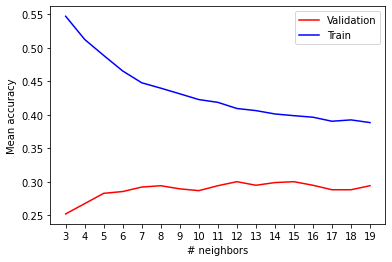

Miglior valore di n_neighbors: 12


In [116]:
neighbors_results = []
for n in hyperparameters['n_neighbors']:
    model = knn(X_train2, y_train2, X_val2, y_val2, valuate=False, n_neighbors=n)
    neighbors_results.append({
        'n_neighbors': n,
        'score': model.score(X_val2.values, y_val2.values),
        'score_train': model.score(X_train2.values, y_train2.values)
    })

plt.plot(list(map(lambda x: x['score'], neighbors_results)), label='Validation', color='red')
plt.plot(list(map(lambda x: x['score_train'], neighbors_results)), label='Train', color='blue')
plt.legend()
plt.xticks(ticks=range(len(hyperparameters['n_neighbors'])), labels=hyperparameters['n_neighbors'])
plt.ylabel('Mean accuracy')
plt.xlabel('# neighbors')
plt.show()

best_result = max(neighbors_results, key=lambda x: x['score'])

best_n_neighbors = best_result['n_neighbors']

print(f"Miglior valore di n_neighbors: {best_n_neighbors}")

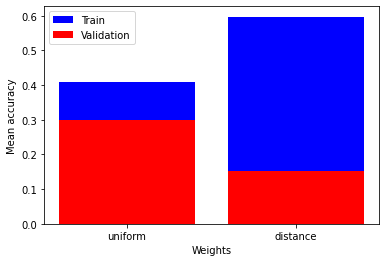

In [117]:
weights_results = []
for w in hyperparameters['weights']:
    model = knn(X_train2, y_train2, X_val2, y_val2, valuate=False, n_neighbors=12, weights=w)
    weights_results.append({
        'weights': w,
        'score': model.score(X_val2.values, y_val2.values),
        'score_train': model.score(X_train2.values, y_train2.values)
    })

plt.bar(range(len(weights_results)), list(map(lambda x: x['score_train'], weights_results)), label='Train', color='blue')
plt.bar(range(len(weights_results)), list(map(lambda x: x['score'], weights_results)), label='Validation', color='red')
plt.legend()
plt.xticks(ticks=range(len(hyperparameters['weights'])), labels=hyperparameters['weights'])
plt.ylabel('Mean accuracy')
plt.xlabel('Weights')
plt.show()


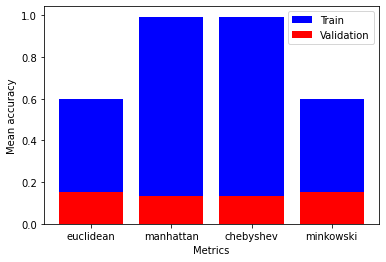

In [118]:
metrics_results = []
for m in hyperparameters['metric']:
    model = knn(X_train2, y_train2, X_val2, y_val2, valuate=False, n_neighbors=12, weights='distance', metric=m)
    metrics_results.append({
        'metric': m,
        'score': model.score(X_val2.values, y_val2.values),
        'score_train': model.score(X_train2.values, y_train2.values)
    })

plt.bar(range(len(metrics_results)), list(map(lambda x: x['score_train'], metrics_results)), label='Train', color='blue')
plt.bar(range(len(metrics_results)), list(map(lambda x: x['score'], metrics_results)), label='Validation', color='red')
plt.legend()
plt.xticks(ticks=range(len(hyperparameters['metric'])), labels=hyperparameters['metric'])
plt.ylabel('Mean accuracy')
plt.xlabel('Metrics')
plt.show()

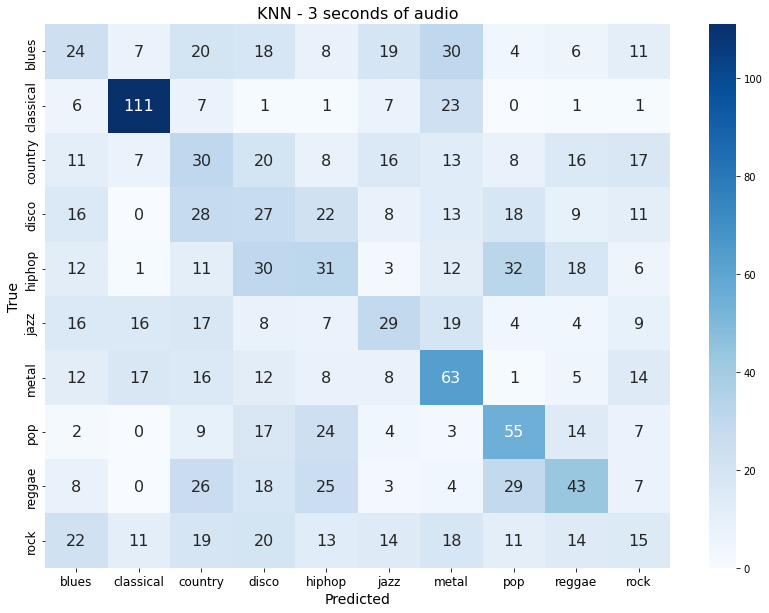

              precision    recall  f1-score   support

       blues       0.19      0.16      0.17       147
   classical       0.65      0.70      0.68       158
     country       0.16      0.21      0.18       146
       disco       0.16      0.18      0.17       152
      hiphop       0.21      0.20      0.20       156
        jazz       0.26      0.22      0.24       129
       metal       0.32      0.40      0.36       156
         pop       0.34      0.41      0.37       135
      reggae       0.33      0.26      0.29       163
        rock       0.15      0.10      0.12       157

    accuracy                           0.29      1499
   macro avg       0.28      0.28      0.28      1499
weighted avg       0.28      0.29      0.28      1499

10-fold cross validation
Accuracy: 0.29 (+/- 0.02)


In [120]:
# best model
knn(X_train2, y_train2, X_test2, y_test2, title='KNN - 3 seconds of audio', n_neighbors=12, weights='uniform');

In [121]:
model = KNeighborsClassifier()

grid_search = GridSearchCV(estimator=model, param_grid=hyperparameters, cv=5)

grid_search.fit(X_train1, y_train1)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(X_test1, y_test1)
print(f'Migliori parametri (Test - 30 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (Test - 30 sec): {accuracy}')

print("=========================================")


Migliori parametri (Test - 30 sec): {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'uniform'}
Accuracy del modello ottimizzato (Test - 30 sec): 0.24


In [122]:
model = KNeighborsClassifier()

grid_search = GridSearchCV(estimator=model, param_grid=hyperparameters, cv=5)

grid_search.fit(X_train2, y_train2)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(X_test2, y_test2)
print(f'Migliori parametri (Test - 3 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (Test - 3 sec): {accuracy}')

print("=========================================")


Migliori parametri (Test - 3 sec): {'metric': 'manhattan', 'n_neighbors': 19, 'weights': 'uniform'}
Accuracy del modello ottimizzato (Test - 3 sec): 0.3002001334222815


In [33]:
model = KNeighborsClassifier()

grid_search = GridSearchCV(estimator=model, param_grid=hyperparameters, cv=5)

grid_search.fit(reduced_X_train2, reduced_y_train2)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(reduced_X_test2, reduced_y_test2)
print(f'Migliori parametri (Test - 3 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (Test - 3 sec): {accuracy}')

print("=========================================")


Migliori parametri (Test - 3 sec): {'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}
Accuracy del modello ottimizzato (Test - 3 sec): 0.8785857238158773


Con features altamente correlate la vicinanza (o la distanza) tra i punti nello spazio non riflette al meglio la somiglianza effettiva. 

Anche per via dei generi sovrapponibili il k-NN può avere difficoltà nella classificazione.

Tracce audio di due generi diversi possono condividere valori simili di alcune features e quindi creare problemi nella classificazione. 

## Support Vector Machine

Dataset più piccolo per complessità cubica

In [27]:
from sklearn.svm import SVC

def svm(
        X_train, y_train, X_test, y_test,
        title: str = 'SVM',
        kernel: str = 'rbf',
        degree: int = 3,
        C: float = 1.0,
        gamma: Union[float, str] = 'scale',
        valuate: bool = True
    ):
    # create the model
    model = SVC(kernel=kernel, C=C, gamma=gamma, degree=degree, max_iter=1000)

    # train the model
    model.fit(X_train, y_train)

    # make predictions
    y_pred = model.predict(X_test)

    if valuate:
        # plot the confusion matrix
        plot_confusion_matrix(y_test, y_pred, title, CATEGORIES)

        # print the scores
        print_scores(y_test, y_pred)

    return model

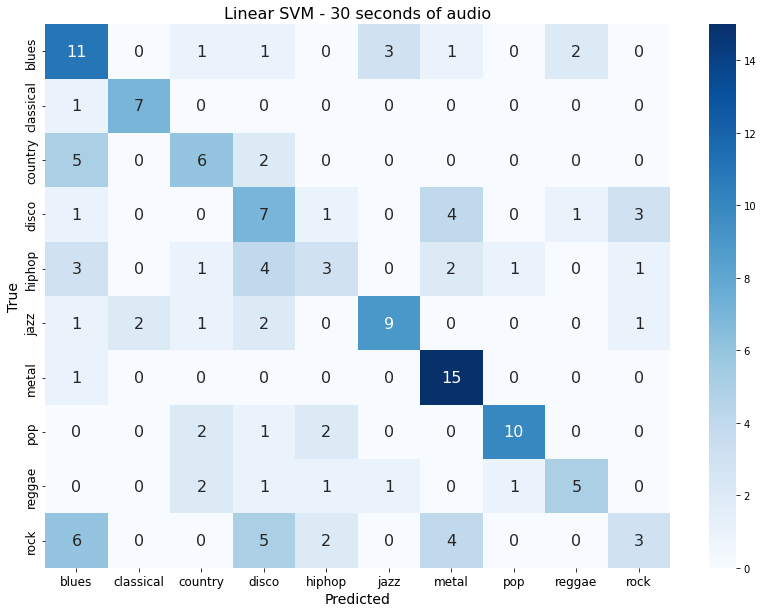

              precision    recall  f1-score   support

       blues       0.38      0.58      0.46        19
   classical       0.78      0.88      0.82         8
     country       0.46      0.46      0.46        13
       disco       0.30      0.41      0.35        17
      hiphop       0.33      0.20      0.25        15
        jazz       0.69      0.56      0.62        16
       metal       0.58      0.94      0.71        16
         pop       0.83      0.67      0.74        15
      reggae       0.62      0.45      0.53        11
        rock       0.38      0.15      0.21        20

    accuracy                           0.51       150
   macro avg       0.54      0.53      0.52       150
weighted avg       0.51      0.51      0.49       150



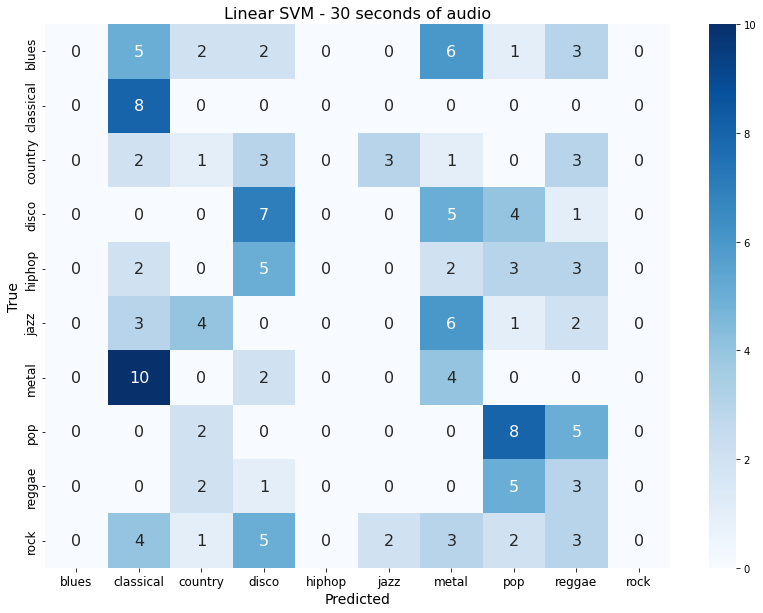

              precision    recall  f1-score   support

       blues       0.00      0.00      0.00        19
   classical       0.24      1.00      0.38         8
     country       0.08      0.08      0.08        13
       disco       0.28      0.41      0.33        17
      hiphop       0.00      0.00      0.00        15
        jazz       0.00      0.00      0.00        16
       metal       0.15      0.25      0.19        16
         pop       0.33      0.53      0.41        15
      reggae       0.13      0.27      0.18        11
        rock       0.00      0.00      0.00        20

    accuracy                           0.21       150
   macro avg       0.12      0.25      0.16       150
weighted avg       0.11      0.21      0.14       150



In [126]:
svm(X_train1, y_train1, X_val1, y_val1, title='Linear SVM - 30 seconds of audio', kernel='linear');
svm(X_train1, y_train1, X_val1, y_val1, title='Linear SVM - 30 seconds of audio', kernel='rbf');

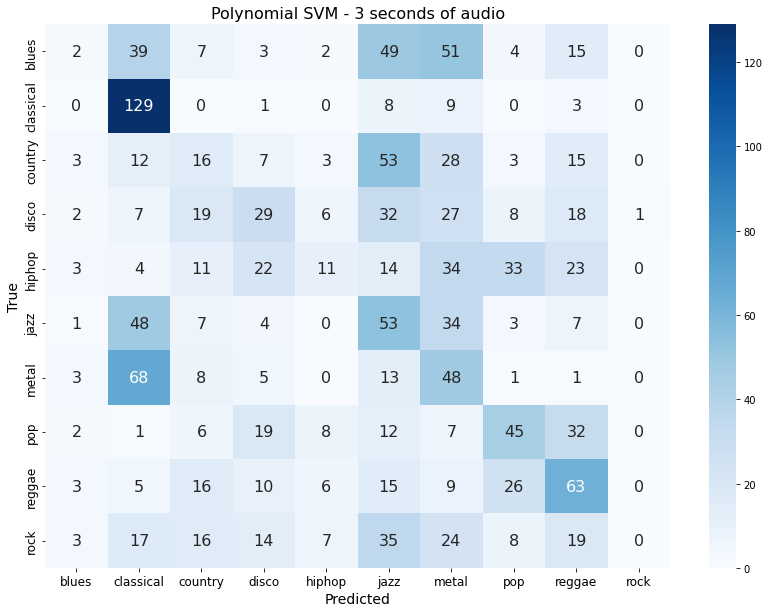

              precision    recall  f1-score   support

       blues       0.09      0.01      0.02       172
   classical       0.39      0.86      0.54       150
     country       0.15      0.11      0.13       140
       disco       0.25      0.19      0.22       149
      hiphop       0.26      0.07      0.11       155
        jazz       0.19      0.34      0.24       157
       metal       0.18      0.33      0.23       147
         pop       0.34      0.34      0.34       132
      reggae       0.32      0.41      0.36       153
        rock       0.00      0.00      0.00       143

    accuracy                           0.26      1498
   macro avg       0.22      0.27      0.22      1498
weighted avg       0.22      0.26      0.22      1498



In [131]:
svm(X_train2, y_train2, X_val2, y_val2, title='Polynomial SVM - 3 seconds of audio', kernel='poly', degree=1);

### Learn best `C`
è il parametro di penalizzazione dell'errore.

In [139]:
# hyperparameter C tuning
c_range = np.logspace(-2, 10, 11)
print(c_range)

[1.00000000e-02 1.58489319e-01 2.51188643e+00 3.98107171e+01
 6.30957344e+02 1.00000000e+04 1.58489319e+05 2.51188643e+06
 3.98107171e+07 6.30957344e+08 1.00000000e+10]


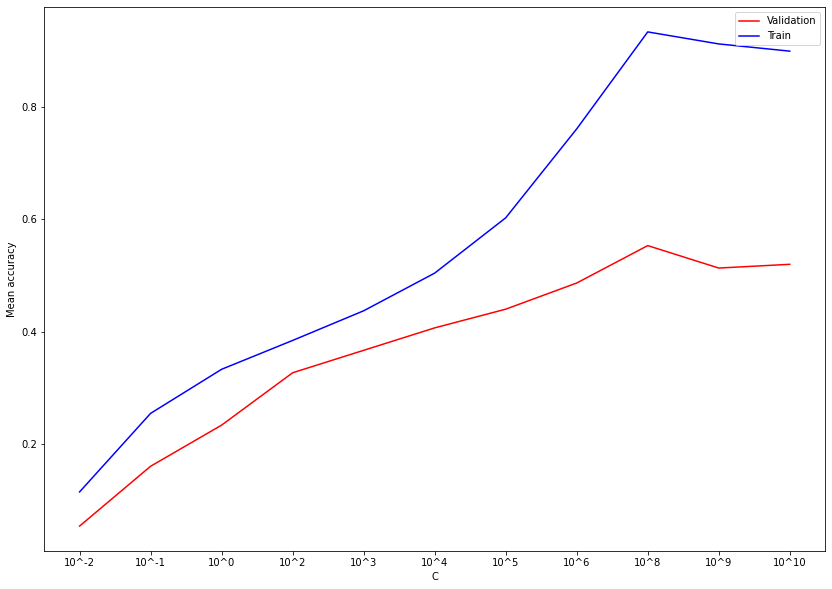

In [143]:

c_results = []
for c in c_range:
    model = svm(X_train1, y_train1, X_val1, y_val1, valuate=False, C=c)
    c_results.append({
        'c': c,
        'score': model.score(X_val1.values, y_val1.values),
        'score_train': model.score(X_train1.values, y_train1.values)
    })

plt.figure(figsize=(14, 10))
plt.plot(list(map(lambda x: x['score'], c_results)), label='Validation', color='red')
plt.plot(list(map(lambda x: x['score_train'], c_results)), label='Train', color='blue')
plt.legend()
# plt.xticks(ticks=range(len(c_range)), labels=[f"{c:.2f}" for c in c_range])
plt.xticks(ticks=range(len(c_range)), labels=[f"10^{np.log10(c):.0f}" for c in c_range])
plt.ylabel('Mean accuracy')
plt.xlabel('C')
plt.show()

> 10^8 sembra il miglior valore per C, ma non è detto che sia il migliore per il dataset più grande.

### Learn best `gamma`
 Il parametro gamma influenza la forma della funzione di decisione. Un valore più alto di gamma rende la funzione di decisione più complessa e flessibile, mentre un valore più basso di gamma la rende più semplice. Utilizzato nel kernel rbf

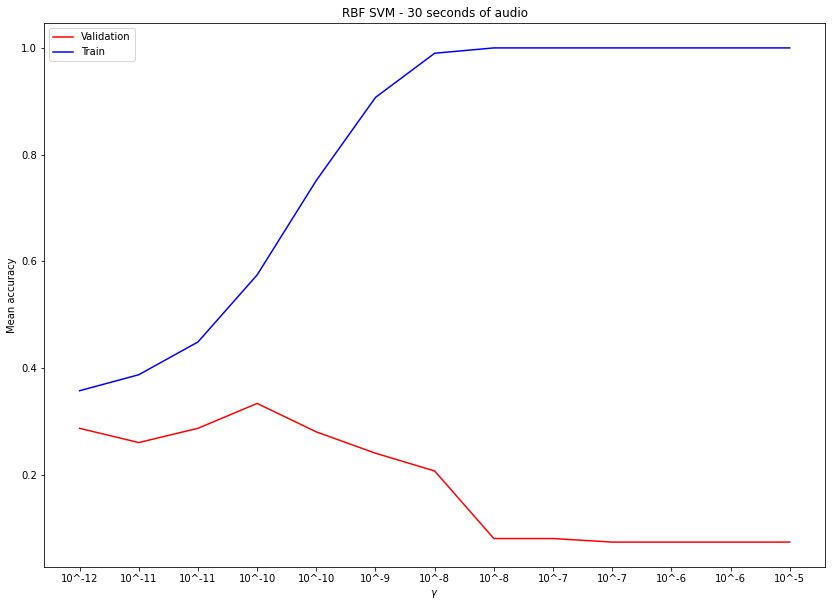

In [135]:
# hyperparameter gamma tuning
gamma_range = np.logspace(-12, -5, 13)

gamma_results = []
for gamma in gamma_range:
    model = svm(X_train1, y_train1, X_val1, y_val1, valuate=False, gamma=gamma)
    gamma_results.append({
        'gamma': gamma,
        'score': model.score(X_val1.values, y_val1.values),
        'score_train': model.score(X_train1.values, y_train1.values)
    })

plt.figure(figsize=(14, 10))
plt.plot(list(map(lambda x: x['score'], gamma_results)), label='Validation', color='red')
plt.plot(list(map(lambda x: x['score_train'], gamma_results)), label='Train', color='blue')
plt.legend()
plt.xticks(ticks=range(len(gamma_range)), labels=[f"10^{np.log10(gamma):.0f}" for gamma in gamma_range])
plt.ylabel('Mean accuracy')
plt.xlabel('$\gamma$')
plt.title('RBF SVM - 30 seconds of audio')
plt.show()

> 10^-10 sembra il miglior valore di gamma per kernel rbf, ma non è detto che sia il migliore per il dataset più grande.

### Plot best `C` and `gamma` for `rbf` kernel

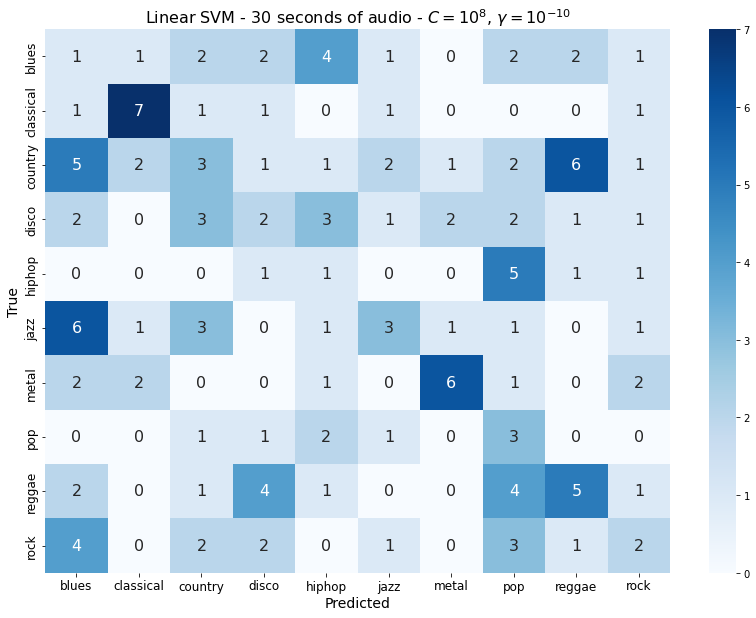

              precision    recall  f1-score   support

       blues       0.04      0.06      0.05        16
   classical       0.54      0.58      0.56        12
     country       0.19      0.12      0.15        24
       disco       0.14      0.12      0.13        17
      hiphop       0.07      0.11      0.09         9
        jazz       0.30      0.18      0.22        17
       metal       0.60      0.43      0.50        14
         pop       0.13      0.38      0.19         8
      reggae       0.31      0.28      0.29        18
        rock       0.18      0.13      0.15        15

    accuracy                           0.22       150
   macro avg       0.25      0.24      0.23       150
weighted avg       0.25      0.22      0.23       150



In [144]:
svm(X_train1, y_train1, X_test1, y_test1, title='Linear SVM - 30 seconds of audio - $C=10^{8}$, $\gamma=10^{-10}$', C=10**8, gamma=10**-10);

## SVM - GridSearch -rbf

In [29]:
model = SVC()

param_grid = {
    'C': np.logspace(-2, 12, 11),          # Parametro di regolarizzazione
    'kernel': ['rbf'],    # Tipo di kernel
    'gamma': np.logspace(-12, -5, 13)  # Coefficiente del kernel (solo per kernel 'rbf')
}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)

grid_search.fit(X_train1, y_train1)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(X_test1, y_test1)
print(f'Migliori parametri (30 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (30 sec): {accuracy}')

Migliori parametri (30 sec): {'C': 63095734.44801917, 'gamma': 1e-12, 'kernel': 'rbf'}
Accuracy del modello ottimizzato (30 sec): 0.36


In [28]:
model = SVC()

param_grid = {
    'C': np.logspace(-2, 12, 11),          # Parametro di regolarizzazione
    'kernel': ['rbf'],    # Tipo di kernel
    'gamma': np.logspace(-12, -5, 13)  # Coefficiente del kernel (solo per kernel 'rbf')
}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)

grid_search.fit(reduced_X_train1, reduced_y_train1)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(reduced_X_test1, reduced_y_test1)
print(f'Migliori parametri (30 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (30 sec): {accuracy}')

Migliori parametri (30 sec): {'C': 100000.0, 'gamma': 6.812920690579622e-07, 'kernel': 'rbf'}
Accuracy del modello ottimizzato (30 sec): 0.68


## Extreme Gradient Boosting

XGB è un modello basato su alberi e consigliabile per classificazioni multiclasse, cioè questo caso.
Inoltre fa uso di alberi piccoli che ne migliorano la generalizzazione.

A differenza di AdaBoost, gli algoritmi di gradient boosting costruiscono classificatori deboli che sono dipendenti l'uno dall'altro. Ogni nuovo classificatore cerca di correggere gli errori residui fatti dai modelli precedenti.

In [146]:
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder

def XGB(X_train, y_train, X_test, y_test, title: str = 'Extreme Gradient Boosting'):

    label_encoder = LabelEncoder()
    y_test_encoded = label_encoder.fit_transform(y_test)
    y_train_encoded = label_encoder.fit_transform(y_train)

    model = XGBClassifier()

    model.fit(X_train, y_train_encoded)

    y_pred = model.predict(X_test)

    # plot the confusion matrix
    plot_confusion_matrix(y_test_encoded, y_pred, title, CATEGORIES)

    print("=========================================")

    # print the scores
    print_scores(y_test_encoded, y_pred)

    # k-fold cross validation
    k_fold_cross_validation(model, X_train, y_train_encoded)


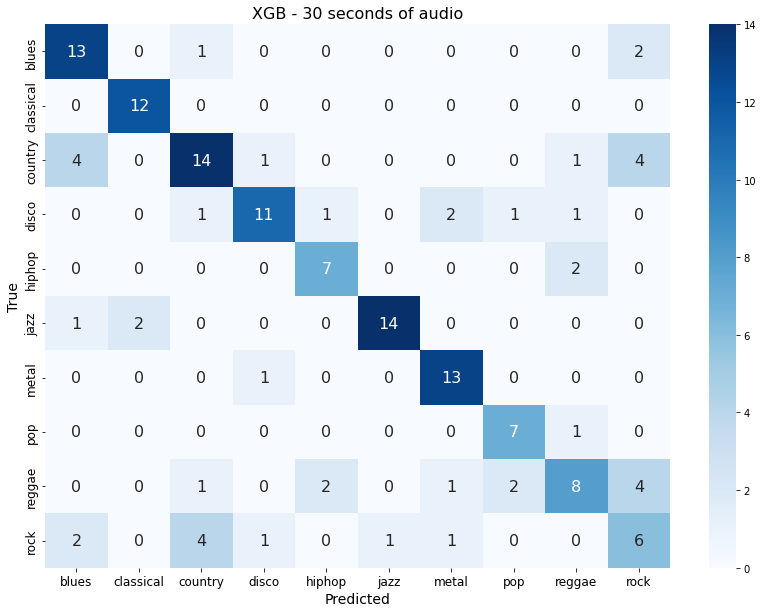

              precision    recall  f1-score   support

           0       0.65      0.81      0.72        16
           1       0.86      1.00      0.92        12
           2       0.67      0.58      0.62        24
           3       0.79      0.65      0.71        17
           4       0.70      0.78      0.74         9
           5       0.93      0.82      0.87        17
           6       0.76      0.93      0.84        14
           7       0.70      0.88      0.78         8
           8       0.62      0.44      0.52        18
           9       0.38      0.40      0.39        15

    accuracy                           0.70       150
   macro avg       0.70      0.73      0.71       150
weighted avg       0.70      0.70      0.69       150

10-fold cross validation
Accuracy: 0.76 (+/- 0.14)


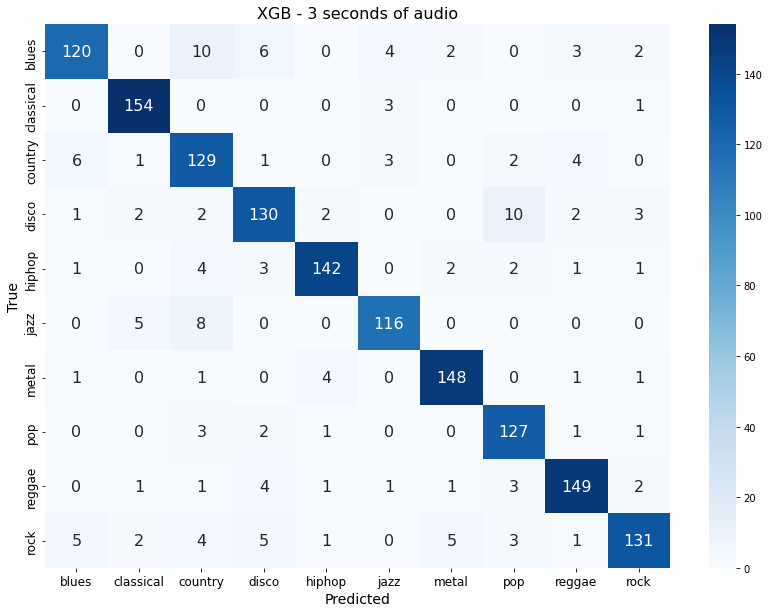

              precision    recall  f1-score   support

           0       0.90      0.82      0.85       147
           1       0.93      0.97      0.95       158
           2       0.80      0.88      0.84       146
           3       0.86      0.86      0.86       152
           4       0.94      0.91      0.93       156
           5       0.91      0.90      0.91       129
           6       0.94      0.95      0.94       156
           7       0.86      0.94      0.90       135
           8       0.92      0.91      0.92       163
           9       0.92      0.83      0.88       157

    accuracy                           0.90      1499
   macro avg       0.90      0.90      0.90      1499
weighted avg       0.90      0.90      0.90      1499

10-fold cross validation
Accuracy: 0.88 (+/- 0.02)


In [147]:
XGB(X_train1, y_train1, X_test1, y_test1, title='XGB - 30 seconds of audio')
XGB(X_train2, y_train2, X_test2, y_test2, title='XGB - 3 seconds of audio')

In [149]:
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': range(100, 1000, 50)
}

label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test1)
y_train_encoded = label_encoder.fit_transform(y_train1)

model = XGBClassifier()

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)

grid_search.fit(X_train1, y_train_encoded)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(X_test1, y_test_encoded)
print(f'Migliori parametri (Test - 30 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (Test - 30 sec): {accuracy}')

print("=========================================")


Migliori parametri (Test - 30 sec): {'learning_rate': 0.1, 'n_estimators': 200}
Accuracy del modello ottimizzato (Test - 30 sec): 0.6866666666666666


In [150]:
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test2)
y_train_encoded = label_encoder.fit_transform(y_train2)

model = XGBClassifier()

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)

grid_search.fit(X_train2, y_train_encoded)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

accuracy = best_model.score(X_test2, y_test_encoded)
print(f'Migliori parametri (Test - 3 sec): {best_params}')
print(f'Accuracy del modello ottimizzato (Test - 3 sec): {accuracy}')

print("=========================================")

Migliori parametri (Test - 3 sec): {'learning_rate': 0.1, 'n_estimators': 900}
Accuracy del modello ottimizzato (Test - 3 sec): 0.9052701801200801
